In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import scipy.stats as stats
from sklearn.linear_model import LinearRegression
import math
from scipy.stats import entropy
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce
import warnings
warnings.filterwarnings("ignore", category=pd.errors.DtypeWarning)
from scipy.stats import spearmanr
from scipy.stats import chi2_contingency
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

Q1_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q1.csv", skiprows=1).iloc[:-2]
Q2_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q2.csv", skiprows=1).iloc[:-2]
Q3_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q3.csv", skiprows=1).iloc[:-2]
Q4_2019 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-jul-2019-snap/LoanStats_2016Q4.csv", skiprows=1).iloc[:-2]

Q1_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q1.csv", skiprows=1).iloc[:-2]
Q2_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q2.csv", skiprows=1).iloc[:-2]
Q3_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q3.csv", skiprows=1).iloc[:-2]
Q4_2018 = pd.read_csv("/Users/shellylevy/Desktop/IDC/שנה ב/סמסטר ב/פרוייקט מבוסס אנליטיקה/project_data/loan-data-apr-2018-snap/LoanStats_2016Q4.csv", skiprows=1).iloc[:-2]


df_2019 = pd.concat([Q1_2019, Q2_2019, Q3_2019, Q4_2019], axis=0)
df_2018 = pd.concat([Q1_2018, Q2_2018, Q3_2018, Q4_2018], axis=0)

warnings.resetwarnings()


In [2]:
df_2018.shape

(434407, 151)

# Data Preprocessing

## Data cleaning

In [3]:
def entropy(column):
    counts = np.unique(column, return_counts=True)[1]
    probabilities = counts / np.sum(counts)
    return -np.sum(probabilities * np.log2(probabilities))

def information_gain(data, feature, target):
    # Calculate entropy of target variable
    target_entropy = entropy(data[target])
    
    feature_entropy = 0
    feature_values, feature_counts = np.unique(data[feature], return_counts=True)
    for value, count in zip(feature_values, feature_counts):
        subset = data[data[feature] == value]
        feature_entropy += (count / len(data)) * entropy(subset[target])
    
    # Calculate information gain
    return target_entropy - feature_entropy

### Data Consistency Checks and Verification

**Feature Comparison between 2018 and 2019 datasets**
<br>
Feature comparison between 2018 and 2019 datasets is crucial for ensuring consistency and identifying any changes or discrepancies in the data. It allows us to understand if the same features are present in both datasets, and if they have the same values or format. This process is necessary to ensure the accuracy and reliability of any analysis or models built using the data.

In [4]:
"""
This section compares the column names of both datasets, 'df_2018' and 'df_2019', 
to ensure that they have the same features. 
"""

# Define attrs_2018 and attrs_2019 as sets or lists of column names
attrs_2018 = set(df_2018.columns)
attrs_2019 = set(df_2019.columns)

# Find the column names present in attrs_2018 but not in attrs_2019
attrs_2018_only = attrs_2018.difference(attrs_2019)

# Find the column names present in attrs_2019 but not in attrs_2018
attrs_2019_only = attrs_2019.difference(attrs_2018)

# Check if there are no differences in either year
if len(attrs_2018_only) == 0 and len(attrs_2019_only) == 0:
    print("No differences found between attrs_2018 and attrs_2019.")
elif len(attrs_2018_only) == 0:
    print("No differences found in attrs_2018.")
else:
    print("Column names present in attrs_2018 but not in attrs_2019:", attrs_2018_only)

if len(attrs_2019_only) == 0:
    print("No differences found in attrs_2019.")
else:
    print("Column names present in attrs_2019 but not in attrs_2018:", attrs_2019_only)

Column names present in attrs_2018 but not in attrs_2019: {'disbursement_method'}
No differences found in attrs_2019.


**ID Value Check and Conversion**
<br>
Ensuring that all instances have an associated ID value and converting them to integer format if necessary is important because it allows us to easily reference and manipulate the data in a consistent way.


In [5]:
"""
Checks if all instances have an associated ID value and converts the ID values to integer 
if they are not already in integer format.
"""

na_count_2019 = df_2019['id'].isna().sum()
na_count_2018 = df_2018['id'].isna().sum()

if na_count_2019 == 0 and na_count_2018 == 0:
    print("All instances have an associated ID")
    df_2019['id'] = df_2019['id'].astype(int)
    df_2018['id'] = df_2018['id'].astype(int)
    na_count_2019 = df_2019['id'].isna().sum()
    na_count_2018 = df_2018['id'].isna().sum()
    if na_count_2019 == 0 and na_count_2018 == 0:
        print("ID conversion to int: OK")
else:
    print("Warning: Some instances do not have an associated ID")

All instances have an associated ID
ID conversion to int: OK


**Verify Loan ID Consistency between 2018 and 2019 Data Frames**
<br>
This process verifies that all loans granted in 2016 are included in the dataset without any additions or reductions, ensuring that the dataset provides a complete snapshot of loans granted in that year.

In [6]:
"""
Verify that each loan in the 2018 table has a corresponding loan in the 2019 table based on loan IDs.
"""

# Check for duplicate IDs in 2018 and 2019 tables
duplicate_ids_2018 = df_2018['id'].duplicated().sum()
duplicate_ids_2019 = df_2019['id'].duplicated().sum()

if duplicate_ids_2018 == 0:
    print("No duplicate IDs found in the 2018 table.")
else:
    print(f"Duplicate IDs found in the 2018 table: {duplicate_ids_2018}")

if duplicate_ids_2019 == 0:
    print("No duplicate IDs found in the 2019 table.")
else:
    print(f"Duplicate IDs found in the 2019 table: {duplicate_ids_2019}")

id_2019 = df_2019['id'].tolist()
id_2018 = df_2018['id'].tolist()

# Convert the lists to sets for faster comparisons
id_set_2019 = set(id_2019)
id_set_2018 = set(id_2018)

# Find the differences between the sets
missing_ids = id_set_2018.difference(id_set_2019)
extra_ids = id_set_2019.difference(id_set_2018)

# Check if the lengths of the sets are equal, indicating the same number of IDs
same_length = len(id_set_2019) == len(id_set_2018)

if not missing_ids and not extra_ids:
    print("Each instance (loan) from the 2018 table has a corresponding loan in the 2019 table.")
else:
    if missing_ids:
        print("IDs missing in 2019 data:", missing_ids)
    if extra_ids:
        print("Extra IDs in 2019 data:", extra_ids)

No duplicate IDs found in the 2018 table.
No duplicate IDs found in the 2019 table.
Each instance (loan) from the 2018 table has a corresponding loan in the 2019 table.


### Identification of Features Leakage
We aims to identify feature leakage by comparing the 2018 and 2019 datasets, dropping the 'disbursement_method' column from the 2018 dataframe, and merging the two dataframes based on the loan IDs. Then, it calculates the percentage of changed rows for each non-'id' column and prints the results.

In [7]:
"""
This code compares the 2018 and 2019 datasets to identify feature leakage. 
It drops the 'disbursement_method' column from the 2018 dataframe, 
merges the two dataframes based on the loan IDs, and calculates the percentage of 
changed rows for each non-'id' column.
"""

# Copy the 2018 dataframe and drop the 'disbursement_method' column
new_df_2018 = df_2018.drop('disbursement_method', axis=1).copy()

# Check if the dataframes have the same columns
if set(new_df_2018.columns) != set(df_2019.columns):
    print("Error: Dataframes have different columns")
else:
    # Merge the 2018 and 2019 dataframes on 'id'
    merged_df = pd.merge(new_df_2018, df_2019, on='id', suffixes=('_18', '_19'))

    # Calculate the percentage of changed rows for each non-'id' column
    changed_columns = {}
    for column in new_df_2018.columns:
        if column == 'id':
            continue
        non_na_rows = merged_df[[f"{column}_18", f"{column}_19"]].dropna()
        changed_rows = (non_na_rows[f"{column}_18"] != non_na_rows[f"{column}_19"]).sum()
        if not len(non_na_rows) == 0:
            percent_changed = changed_rows / len(non_na_rows) * 100
            if percent_changed > 0:
                changed_columns[column] = percent_changed

    # Sort the columns by percent_changed in descending order and print the results
    for column, percent_changed in sorted(changed_columns.items(), key=lambda x: x[1], reverse=True):
        print(f"{column}: {percent_changed:.2f}% changed")

next_pymnt_d: 100.00% changed
last_credit_pull_d: 83.97% changed
last_fico_range_high: 78.08% changed
last_fico_range_low: 78.08% changed
settlement_status: 62.70% changed
total_pymnt: 62.54% changed
total_pymnt_inv: 62.53% changed
out_prncp: 60.04% changed
out_prncp_inv: 60.04% changed
debt_settlement_flag_date: 59.96% changed
total_rec_int: 57.90% changed
total_rec_prncp: 57.72% changed
last_pymnt_d: 57.32% changed
loan_status: 38.64% changed
last_pymnt_amnt: 33.04% changed
hardship_status: 9.44% changed
recoveries: 6.87% changed
collection_recovery_fee: 6.87% changed
settlement_amount: 3.70% changed
hardship_end_date: 3.50% changed
settlement_date: 3.47% changed
total_rec_late_fee: 3.01% changed
settlement_percentage: 2.74% changed
settlement_term: 2.15% changed
debt_settlement_flag: 1.83% changed
verification_status: 1.62% changed
hardship_flag: 0.09% changed
pymnt_plan: 0.06% changed
installment: 0.02% changed
int_rate: 0.02% changed


To ensure our analysis reflects the factors known at the time of loan application, we remove any data points in the merged dataset that exhibit a percentage change higher than 0% between 2018 and 2019. Upon inspection, we discovered that the columns installment (representing the monthly repayment amount) and int_rate (representing the loan's interest percentage) exhibited a minute 0.02% change. Given the implausibility of these columns having changed, we will scrutinize the specific instances where changes occurred.

In [8]:
features_to_drop = list(changed_columns)
features_to_drop.remove('loan_status')
features_to_drop.remove('int_rate')
features_to_drop.remove('installment')

print(features_to_drop)

['verification_status', 'pymnt_plan', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'last_fico_range_high', 'last_fico_range_low', 'hardship_flag', 'hardship_status', 'hardship_end_date', 'debt_settlement_flag', 'debt_settlement_flag_date', 'settlement_status', 'settlement_date', 'settlement_amount', 'settlement_percentage', 'settlement_term']


We went through the data dictionary and found additional leakage features, these columns only have nan and that's why they didn't come up before.

In [9]:
features_to_drop.append('hardship_reason')
features_to_drop.append('hardship_type')
features_to_drop.append('deferral_term')
features_to_drop.append('hardship_amount')
features_to_drop.append('hardship_start_date')
features_to_drop.append('payment_plan_start_date')
features_to_drop.append('hardship_length')
features_to_drop.append('hardship_dpd')
features_to_drop.append('hardship_loan_status')
features_to_drop.append('orig_projected_additional_accrued_interest')
features_to_drop.append('hardship_payoff_balance_amount')
features_to_drop.append('hardship_last_payment_amount')

features_to_drop.append('funded_amnt')
features_to_drop.append('funded_amnt_inv')

Considering that changes in the int_rate and installment columns are uncommon and may be a result of human error, we will remove these instances from our analysis. This will ensure that our analysis is based on reliable and accurate information.

In [10]:
changes = pd.concat([merged_df['id'], merged_df['int_rate_18'] != merged_df['int_rate_19'], merged_df['installment_18'] != merged_df['installment_19']], axis=1)
changes.columns = ['id', 'int_rate_change', 'installment_change']

# Filter for instances where both int_rate and installment have changed
both_changed = changes[(changes['int_rate_change']) & (changes['installment_change'])]

# Count the number of unique IDs
num_unique = both_changed['id'].nunique()
percentage = num_unique / df_2019.shape[0] * 100


print(f"The total number of unique instances with changes in int_rate or installment columns is: {num_unique}. "
      f"This represents {percentage:.2f}% of the data.")

# Get the IDs to remove
ids_to_remove = set(both_changed['id'].unique())
# Remove the IDs from the data
df_2019 = df_2019[~df_2019['id'].isin(ids_to_remove)]


The total number of unique instances with changes in int_rate or installment columns is: 85. This represents 0.02% of the data.


### Filtering irrelevant instances

We will examine the distribution of categories under the loan_status feature.

In [11]:
df_2019.shape

(434322, 150)

In [12]:
count_by_status = df_2019['loan_status'].value_counts()
print(count_by_status)

Fully Paid            262778
Current                94134
Charged Off            72186
Late (31-120 days)      3228
In Grace Period         1466
Late (16-30 days)        522
Default                    8
Name: loan_status, dtype: int64


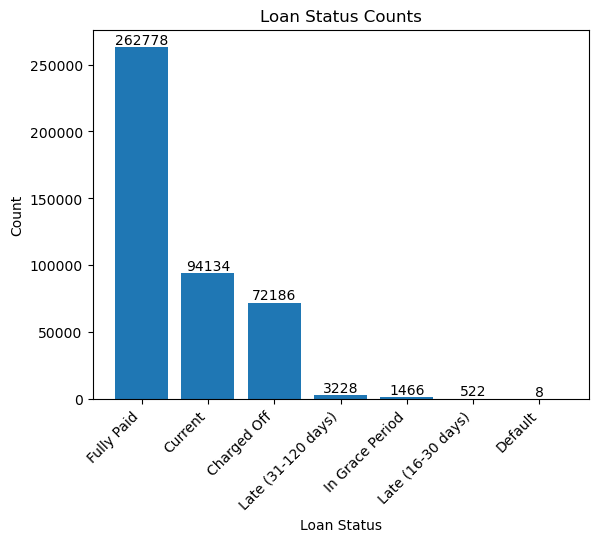

In [13]:
fig, ax = plt.subplots()
bars = ax.bar(count_by_status.index, count_by_status.values)

ax.set_title('Loan Status Counts')
ax.set_xlabel('Loan Status')
ax.set_ylabel('Count')
plt.xticks(rotation=45, ha='right')

for bar, count in zip(bars, count_by_status.values):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), count,
            ha='center', va='bottom')

plt.show()

We will remove instances with loan statuses other than "Charged Off" and "Fully Paid" to ensure completed loan outcomes.

In [14]:
data = df_2019[df_2019['loan_status'].isin(['Fully Paid', 'Charged Off'])]

In [15]:
data['loan_status'].value_counts()

Fully Paid     262778
Charged Off     72186
Name: loan_status, dtype: int64

In the future, we will realize that to exclude loan applications with a Joint App type. To better visualize the number of instances we are downloading, we will generate a graph at this point.

In [16]:
data['application_type'].value_counts()

Individual    328918
Joint App       6046
Name: application_type, dtype: int64

In [17]:
# Grouping data by 'application_type' and 'loan_status'
grouped = data.groupby(['application_type', 'loan_status']).size().unstack().fillna(0)

# Calculate row and column totals
col_totals = grouped.sum(axis=0)
row_totals = grouped.sum(axis=1)

# Calculate percentage values
percentages = grouped.apply(lambda x: x / col_totals * 100, axis=1)
percentages['Total'] = row_totals / row_totals.sum() * 100
percentages = percentages.round(2)

# Styling options
styled_table = percentages.style.background_gradient(cmap='coolwarm', axis=0) \
                      .applymap(lambda x: 'background-color: lightcoral', subset='Charged Off') \
                      .applymap(lambda x: 'background-color: lightgreen', subset='Fully Paid') \
                      .set_caption('Loan Status by Application Type') \
                      .format('{:,.2f}%') \
                      .set_properties(subset=['Charged Off', 'Fully Paid', 'Total'], color='black')

# Display the styled table
styled_table

loan_status,Charged Off,Fully Paid,Total
application_type,,,
Individual,98.06%,98.23%,98.20%
Joint App,1.94%,1.77%,1.80%


We found very few joint loan applications, so we removed them from our analysis to avoid bias and account for potential differences between individual and joint loans.

In [18]:
data = data[data['application_type'] == 'Individual']
data.drop('application_type', axis=1, inplace=True)

### Calculate targed varible
Since the original dataset doesn't include our target variable, we need to define it based on certain criteria or rules. By creating the target variable during the preprocessing stage, we can streamline the subsequent data cleaning and transformation steps. With the target variable already in place, we can better understand how missing values or scaling variables might impact it, and adjust our preprocessing accordingly. This will help us to ensure that our final model is both accurate and interpretable.

In [19]:
"""
We will check how many missing values there are in each column that is necessary to calculate the target variable.
"""
print(data[['issue_d', 'last_pymnt_d', 'total_pymnt', 'funded_amnt']].isnull().sum())

issue_d           0
last_pymnt_d    513
total_pymnt       0
funded_amnt       0
dtype: int64


We will handle missing values in the total_pymnt column by using the issue_d and last_pymnt_d columns. If the total_pymnt is 0, it indicates that no payment has been made, so we assume that the last_pymnt_d is the same as the issue_d. For all other instances where there is a missing value, we will remove those instances.

In [20]:
mask = (data['total_pymnt'] == 0) & (data['last_pymnt_d'].isna())
data.loc[mask, 'last_pymnt_d'] = data.loc[mask, 'issue_d']

In [21]:
print(data[['issue_d', 'last_pymnt_d', 'total_pymnt', 'funded_amnt']].isnull().sum())

issue_d           0
last_pymnt_d    376
total_pymnt       0
funded_amnt       0
dtype: int64


In [22]:
data = data.dropna(subset=["last_pymnt_d"])

We will create several target variables, including two return calculations, a binary variable indicating whether the loan has defaulted, and another binary variable indicating whether the return is above 2%.

In [23]:
data.loc[:, "T"] = data['term'].replace({' 36 months': 36, ' 60 months': 60})

# Convert "issue_d" and "last_pymnt_d" columns to datetime objects
data.loc[:, "issue_d"] = pd.to_datetime(data["issue_d"])
data.loc[:, "last_pymnt_d"] = pd.to_datetime(data["last_pymnt_d"])
data = data.dropna(subset=['last_pymnt_d'])

data.loc[:, "real_time_month"] = (data["last_pymnt_d"] - data["issue_d"]).dt.days / 365.25 *12

data.loc[:, "p/m"] = data["total_pymnt"] / data["real_time_month"]

data.loc[:, "real_time_month"] = np.where(data["real_time_month"] == 0, 1/12, data["real_time_month"])

data.loc[:, "yield_2"] = (12/data["T"])*(1/data["funded_amnt"]) * (((data["p/m"])*((1-(1+0.00165158130192022)**data["real_time_month"])/(1-(1+0.00165158130192022))))*(1+0.00165158130192022)**(data["T"]-data["real_time_month"]) - data["funded_amnt"])

data.loc[:, 'yield_yearly_1'] = (data['total_pymnt'] - data['funded_amnt'])/data['funded_amnt']*(12/data["real_time_month"])

data['is_default?'] = (data['loan_status'] == 'Charged Off').astype(int)

data.drop('loan_status', axis=1, inplace=True)

cols = list(data.columns)
cols.remove('is_default?')
cols.append('is_default?')
data = data[cols]

data['yield_over'] = (data['yield_yearly_1'] >= 0.02).astype(int)

In [24]:
features_to_drop.append('real_time_month')
features_to_drop.append('p/m')
features_to_drop.append('T')
print(features_to_drop)
data.drop(features_to_drop, axis=1, inplace=True)

['verification_status', 'pymnt_plan', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d', 'last_fico_range_high', 'last_fico_range_low', 'hardship_flag', 'hardship_status', 'hardship_end_date', 'debt_settlement_flag', 'debt_settlement_flag_date', 'settlement_status', 'settlement_date', 'settlement_amount', 'settlement_percentage', 'settlement_term', 'hardship_reason', 'hardship_type', 'deferral_term', 'hardship_amount', 'hardship_start_date', 'payment_plan_start_date', 'hardship_length', 'hardship_dpd', 'hardship_loan_status', 'orig_projected_additional_accrued_interest', 'hardship_payoff_balance_amount', 'hardship_last_payment_amount', 'funded_amnt', 'funded_amnt_inv', 'real_time_month', 'p/m', 'T']


**Calculate annual realized returns and standard deviation by loan grade.**

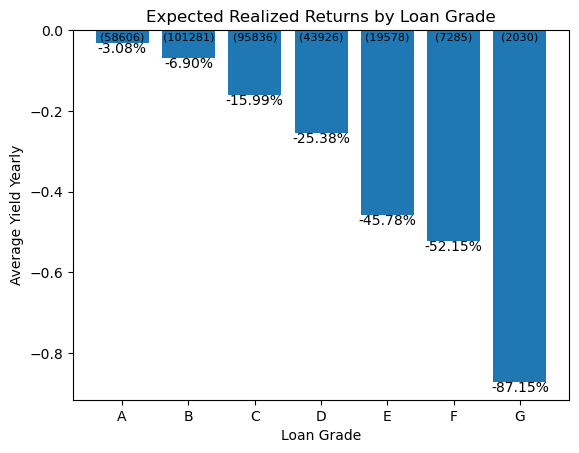

In [25]:
avg_yield_by_grade = data.groupby('grade')['yield_yearly_1'].mean()
count_by_grade = data.groupby('grade')['yield_yearly_1'].count()

fig, ax = plt.subplots()
ax.bar(avg_yield_by_grade.index, avg_yield_by_grade.values)
ax.set_title('Expected Realized Returns by Loan Grade')
ax.set_xlabel('Loan Grade')
ax.set_ylabel('Average Yield Yearly')

for i, v in enumerate(avg_yield_by_grade):
    ax.text(i, v-0.025, f'{v:.2%}', ha='center')

for i, v in enumerate(count_by_grade):
    ax.text(i, max(avg_yield_by_grade), f'({v})', ha='center', va='bottom', fontsize=8)

plt.xticks(rotation=360)
plt.show()

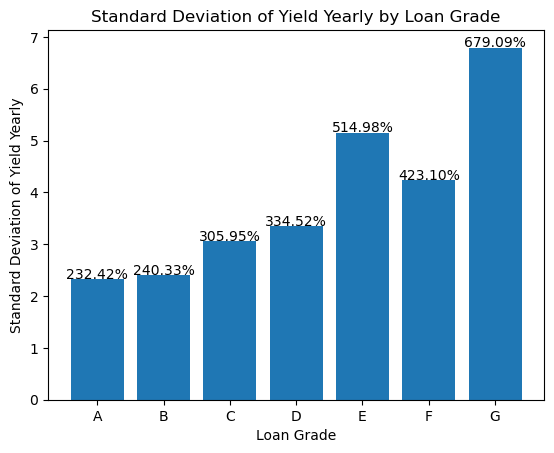

In [26]:
std_yield_by_grade = data.groupby('grade')['yield_yearly_1'].std()

fig, ax = plt.subplots()
ax.bar(std_yield_by_grade.index, std_yield_by_grade.values)
ax.set_title('Standard Deviation of Yield Yearly by Loan Grade')
ax.set_xlabel('Loan Grade')
ax.set_ylabel('Standard Deviation of Yield Yearly')

for i, v in enumerate(std_yield_by_grade):
    ax.text(i, v+0.01, f'{v:.2%}', ha='center')

plt.show()

### Identifying Features with High Percentage of NaN Values
Features with a high percentage of NaN values can negatively affect the performance of machine learning models and hence should be identified and either dropped or imputed with appropriate values.

In [27]:
"""
This code snippet checks for NaN values in the columns of a given dataset and identifies the features 
with a NaN percentage higher than 0%.
"""

na_percent = {}

# Loop through the columns in data dataframe
for column in data.columns:
    if column == 'id':
        continue
    na_count = data[column].isna().sum()
    na_percent[column] = (na_count / len(data)) * 100

# Filter columns with NaN percentage higher than 0%
na_percent_above_0 = {column: na_percent for column, na_percent in na_percent.items() if na_percent > 0}

# Sort the dictionary by NaN percentages in descending order
sorted_na_percent_above_0 = {column: na_percent for column, na_percent in sorted(na_percent_above_0.items(), key=lambda x: x[1], reverse=True)}

# Print the sorted list of column names and NaN percentages
print("Columns with NaN percentage higher than 0% (sorted):")
for column, na_percent in sorted_na_percent_above_0.items():
    print(f"{column}: {na_percent:.2f}% NaN Percent")

Columns with NaN percentage higher than 0% (sorted):
member_id: 100.00% NaN Percent
annual_inc_joint: 100.00% NaN Percent
dti_joint: 100.00% NaN Percent
verification_status_joint: 100.00% NaN Percent
revol_bal_joint: 100.00% NaN Percent
sec_app_fico_range_low: 100.00% NaN Percent
sec_app_fico_range_high: 100.00% NaN Percent
sec_app_earliest_cr_line: 100.00% NaN Percent
sec_app_inq_last_6mths: 100.00% NaN Percent
sec_app_mort_acc: 100.00% NaN Percent
sec_app_open_acc: 100.00% NaN Percent
sec_app_revol_util: 100.00% NaN Percent
sec_app_open_act_il: 100.00% NaN Percent
sec_app_num_rev_accts: 100.00% NaN Percent
sec_app_chargeoff_within_12_mths: 100.00% NaN Percent
sec_app_collections_12_mths_ex_med: 100.00% NaN Percent
sec_app_mths_since_last_major_derog: 100.00% NaN Percent
desc: 99.99% NaN Percent
mths_since_last_record: 80.31% NaN Percent
mths_since_recent_bc_dlq: 74.53% NaN Percent
mths_since_last_major_derog: 70.82% NaN Percent
mths_since_recent_revol_delinq: 63.90% NaN Percent
mths_

In [28]:
"""
Features with a NaN percentage higher than 45% are added to the 'features_to_drop' list, while the remaining 
features are added to the 'features_to_test' list for further analysis in progess. 
"""

# Create an empty list to store column names
features_to_drop = []
features_to_test=[]

# Loop through the columns in changed_columns dictionary
for column, na_percent in sorted_na_percent_above_0.items():
    if na_percent > 45:
        features_to_drop.append(column)
        if column in features_to_test:
            features_to_test.remove(column)
    else:
        features_to_test.append(column)

In [29]:
print(features_to_drop)
data.drop(features_to_drop, axis=1, inplace=True)

['member_id', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'revol_bal_joint', 'sec_app_fico_range_low', 'sec_app_fico_range_high', 'sec_app_earliest_cr_line', 'sec_app_inq_last_6mths', 'sec_app_mort_acc', 'sec_app_open_acc', 'sec_app_revol_util', 'sec_app_open_act_il', 'sec_app_num_rev_accts', 'sec_app_chargeoff_within_12_mths', 'sec_app_collections_12_mths_ex_med', 'sec_app_mths_since_last_major_derog', 'desc', 'mths_since_last_record', 'mths_since_recent_bc_dlq', 'mths_since_last_major_derog', 'mths_since_recent_revol_delinq', 'mths_since_last_delinq']


### The distribution of features values
#### Identifying Features with Identical Values
We aims to identify features in the dataset that have the same value for the entire length of the column. Identifying these features is important because they do not provide any useful information for modeling and can be safely removed to reduce the dimensionality of the dataset and improve model performance.

In [30]:
"""
Identify features in the dataset with the same value for the entire length of the column.
"""
features_to_drop = []
same_value_cols = []
for column in data.columns:
    if column == 'id':
        continue
    unique_values = data[column].nunique()
    if unique_values == 1 and data[column].isna().sum() == 0:
        same_value_cols.append(column)

# Print columns with the same value for the entire length of the column
print("Columns with the same value for the entire length of the column:")
for col in same_value_cols:
    features_to_drop.append(col)
    if column in features_to_test:
        features_to_test.remove(column)
    print(col)

Columns with the same value for the entire length of the column:
policy_code


In [31]:
print(features_to_drop)
data.drop(features_to_drop, axis=1, inplace=True)

['policy_code']


### Removing Business-Irrelevant Features
The columns that considere business-irrelevant as they do not have a significant impact on the loan prediction model and do not provide meaningful insights to the business. By removing these features, we can reduce the complexity of the dataset and potentially improve the performance of the machine learning model.

In [32]:
features_to_drop=['emp_title','url','title','zip_code','grade','sub_grade']
data.drop(features_to_drop, axis=1, inplace=True)

###  Data Type Conversion
We want to ensures that the data is in the appropriate format for analysis.

In [33]:
pd.set_option("display.max_rows", None)
print(data.dtypes)
pd.reset_option("display.max_rows")

id                                     int64
loan_amnt                            float64
term                                  object
int_rate                              object
installment                          float64
emp_length                            object
home_ownership                        object
annual_inc                           float64
issue_d                       datetime64[ns]
purpose                               object
addr_state                            object
dti                                  float64
delinq_2yrs                          float64
earliest_cr_line                      object
fico_range_low                       float64
fico_range_high                      float64
inq_last_6mths                       float64
open_acc                             float64
pub_rec                              float64
revol_bal                            float64
revol_util                            object
total_acc                            float64
initial_li

In [34]:
data["term"] = data['term'].replace({' 36 months': 36, ' 60 months': 60})
data['int_rate'] = data['int_rate'].str.replace('%', '').astype('float64') / 100.0
data["emp_length"] = data["emp_length"].replace({"< 1 year": "0", "10+ years": "10", np.nan: np.nan})
data["emp_length"] = data["emp_length"].str.extract('(\\d+)').astype(float)
data['revol_util'] = data['revol_util'].str.replace('%', '').astype('float64') / 100.0
data.loc[:, "earliest_cr_line"] = pd.to_datetime(data["earliest_cr_line"])

**Correct Classification of Numeric Data: Differentiating between Float and Integer**
<br>
Checking which columns are integers is important to ensure that calculations and operations are performed correctly, as certain functions or operations may behave differently on integers compared to floats or other data types. Additionally, some columns may be categorical in nature even if they contain numerical values, and treating them as continuous variables may result in inaccurate analyses or models. Therefore, it is important to identify and treat integer columns appropriately in data analysis.

In [35]:
"""
This code properly classifies float columns with all zero decimals into integer or object types. 
Columns without missing values are converted to integers, while those with missing values are converted 
to object types. Once missing values are handled, variables in the int_with_nas list will be converted to integers.
"""

int_with_nas=[]
for col in data.columns:
    if not data[col].dtype == 'object' and not data[col].dtype == 'int64' and not data[col].dtype=='datetime64[ns]': 
        count = (data[col].apply(lambda x: str(x).split('.')[1] if '.' in str(x) else '')
                   .str.count('[1-9]')
                   .sum())
        if count==0:
            if sum(data[col].isna())==0:
                data[col]=data[col].astype(int)

In [36]:
data['tot_cur_bal']=data['tot_cur_bal'].astype('float64')
data['loan_amnt']=data['loan_amnt'].astype('float64')
data['fico_range_low']=data['fico_range_low'].astype('float64')
data['fico_range_high']=data['fico_range_high'].astype('float64')
data['revol_bal']=data['revol_bal'].astype('float64')
data['max_bal_bc']=data['max_bal_bc'].astype('float64')
data['tot_coll_amt']=data['tot_coll_amt'].astype('float64')
data['total_bal_il']=data['total_bal_il'].astype('float64')
data['total_rev_hi_lim']=data['total_rev_hi_lim'].astype('float64')
data['avg_cur_bal']=data['avg_cur_bal'].astype('float64')
data['bc_open_to_buy']=data['bc_open_to_buy'].astype('float64')
data['tot_hi_cred_lim']=data['tot_hi_cred_lim'].astype('float64')
data['total_bal_ex_mort']=data['total_bal_ex_mort'].astype('float64')
data['total_bc_limit']=data['total_bc_limit'].astype('float64')
data['total_il_high_credit_limit']=data['total_il_high_credit_limit'].astype('float64')

### Continuation of Distribution of features values
#### Detecting High Concentration of Values in the columns
<br>
Identifying columns with over 95% of the data in one value can help detect potential data quality issues, redundant features, and improve computational efficiency by reducing the dimensionality of the dataset. By investigating the cause of this issue, we can determine whether the column should be kept, modified, or removed from the dataset to ensure accurate and efficient analysis.
We chose 95% because columns with over 95% of the data in one value may not provide enough information to effectively predict the target variable, which could result in a suboptimal or inaccurate model.

In [37]:
"""
Finds columns in data that have over 95% of the data in one value.
"""
for column in data.columns:
    value_counts = data[column].value_counts(normalize=True)
    if (value_counts > 0.95).any():
        print(f"{column} has over 95% of the data in one value.")

collections_12_mths_ex_med has over 95% of the data in one value.
acc_now_delinq has over 95% of the data in one value.
chargeoff_within_12_mths has over 95% of the data in one value.
delinq_amnt has over 95% of the data in one value.
num_tl_120dpd_2m has over 95% of the data in one value.
num_tl_30dpd has over 95% of the data in one value.
tax_liens has over 95% of the data in one value.


Now we will explore each variable

In [38]:
def plot_yield_graphs(col,title):
    """
    Plot the loan failure rates and yearly yield mean for a given column.

    Parameters:
    col (str): A string representing the column of the data to analyze.
    title (str): A string representing the title of the plot.

    Returns:
    None: The function only plots the data.

    """
    df = yield_percentages(col)
    
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
    sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])
    
    axes[0].set_xlabel(title)
    axes[0].set_ylabel('Percentage of yield under 2%')
    axes[0].set_title(f'Loan failure rates by {title}')
    pop_mean = 1 - data['yield_over'].mean()
    axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
    
    sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
    axes[1].set_xlabel(title)
    axes[1].set_ylabel('Yearly yield mean')
    axes[1].set_title(f'Yearly yield mean by {title}')
    pop_mean = data['yield_yearly_1'].mean()
    axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
    
    axes[0].legend()
    axes[1].legend()

    plt.show()

def yield_percentages(col):
    """
    Compute the loan failure rates and yearly yield mean for a given column.

    Parameters:
    col (str): A string representing the column of the data to analyze.

    Returns:
    pd.DataFrame: A DataFrame with the loan failure rates and yearly yield mean for each value of the given column.

    """

    col_counts_normal = data[col].value_counts(normalize=True)
    col_counts = data[col].value_counts()
    
    yield_under_percentages = []
    yield_yearly_1_mean = []
    for idx in col_counts.index:
        yield_under_percentages.append(1 - (data[data[col] == idx]['yield_over'].mean()))
        yield_yearly_1_mean.append((data[data[col] == idx]['yield_yearly_1'].mean()))
        
    df = pd.DataFrame({col: col_counts.index, 'Count': col_counts.values,'normalize count':col_counts_normal.values ,'yield over percentages': yield_under_percentages,'yearly yield mean':yield_yearly_1_mean})
    return(df)


**collections_12_mths_ex_med**
<br>
This variable contains 98% of the data in one category, where both the failure and return rates are close to the overall average. The remaining 2% of the data is dispersed and does not provide conclusive insights. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

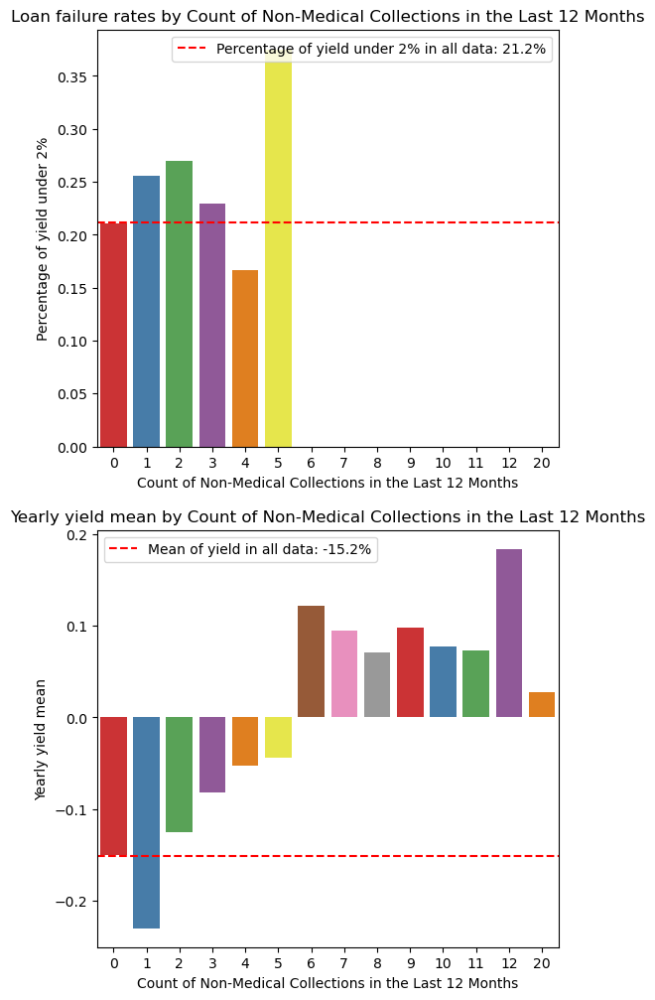

,collections_12_mths_ex_med,Count,normalize count,yield over percentages,yearly yield mean
0,0,322023,0.980158,0.211022,-0.150192
1,1,6023,0.018333,0.255521,-0.230041
2,2,401,0.001221,0.269327,-0.125795
3,3,48,0.000146,0.229167,-0.082174
4,4,24,0.000073,0.166667,-0.052330
5,5,8,0.000024,0.375000,-0.044440
6,6,5,0.000015,0.000000,0.122218
7,7,4,0.000012,0.000000,0.094527
8,11,1,0.000003,0.000000,0.072667
9,12,1,0.000003,0.000000,0.183941


In [39]:
plot_yield_graphs('collections_12_mths_ex_med','Count of Non-Medical Collections in the Last 12 Months')
yield_percentages('collections_12_mths_ex_med')

In [40]:
data.drop('collections_12_mths_ex_med', axis=1, inplace=True)

**acc_now_delinq**
<br>
This variable contains 99.36% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

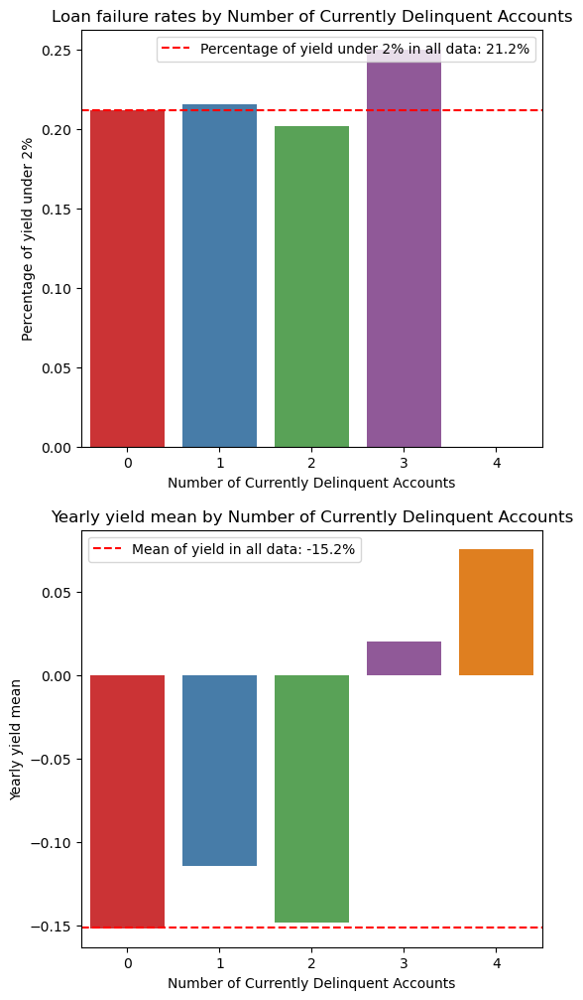

,acc_now_delinq,Count,normalize count,yield over percentages,yearly yield mean
0,0,326459,0.993660,0.211886,-0.151828
1,1,1963,0.005975,0.215487,-0.114560
2,2,104,0.000317,0.201923,-0.148222
3,3,12,0.000037,0.250000,0.020243
4,4,4,0.000012,0.000000,0.075674


In [41]:
plot_yield_graphs('acc_now_delinq','Number of Currently Delinquent Accounts')
yield_percentages('acc_now_delinq')

In [42]:
data.drop('acc_now_delinq', axis=1, inplace=True)

**chargeoff_within_12_mths**
<br>
This variable contains 99.17% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

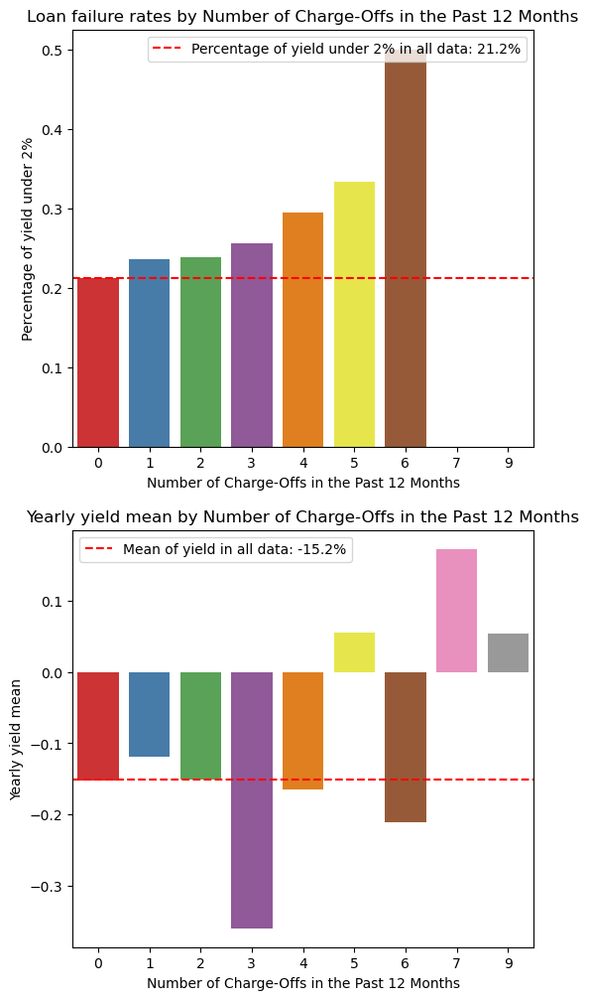

,chargeoff_within_12_mths,Count,normalize count,yield over percentages,yearly yield mean
0,0,325824,0.991727,0.211697,-0.151828
1,1,2486,0.007567,0.235720,-0.118571
2,2,164,0.000499,0.237805,-0.151130
3,3,39,0.000119,0.256410,-0.359430
4,4,17,0.000052,0.294118,-0.164656
5,5,6,0.000018,0.333333,0.055087
6,7,2,0.000006,0.000000,0.172546
7,6,2,0.000006,0.500000,-0.210921
8,9,2,0.000006,0.000000,0.054520


In [43]:
plot_yield_graphs('chargeoff_within_12_mths','Number of Charge-Offs in the Past 12 Months')
yield_percentages('chargeoff_within_12_mths')

In [44]:
data.drop('chargeoff_within_12_mths', axis=1, inplace=True)

**delinq_amnt**
<br>
This variable contains 99.45% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

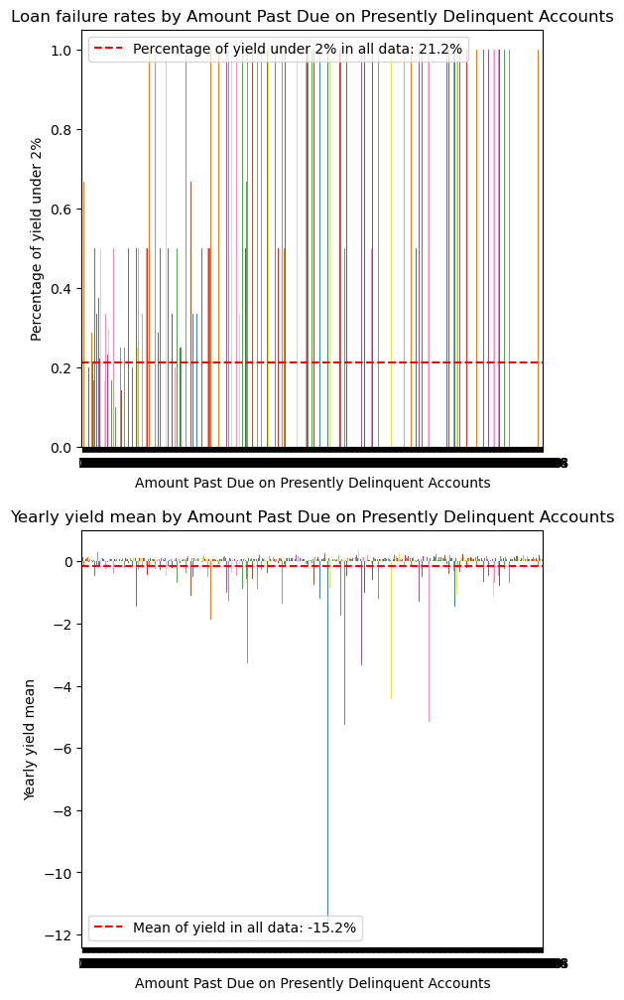

,delinq_amnt,Count,normalize count,yield over percentages,yearly yield mean
0,0,326750,0.994546,0.211804,-0.151705
1,65000,40,0.000122,0.325000,-0.310498
2,25,24,0.000073,0.208333,-0.005655
3,56,19,0.000058,0.263158,-0.242170
4,30,19,0.000058,0.263158,-0.625535
...,...,...,...,...,...
1009,6089,1,0.000003,0.000000,0.227452
1010,5332,1,0.000003,1.000000,-0.394270
1011,36609,1,0.000003,0.000000,0.057021
1012,1087,1,0.000003,0.000000,0.093757


In [45]:
plot_yield_graphs('delinq_amnt','Amount Past Due on Presently Delinquent Accounts')
yield_percentages('delinq_amnt')

In [46]:
data.drop('delinq_amnt', axis=1, inplace=True)

**num_tl_30dpd**
<br>
This variable contains 99.58% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

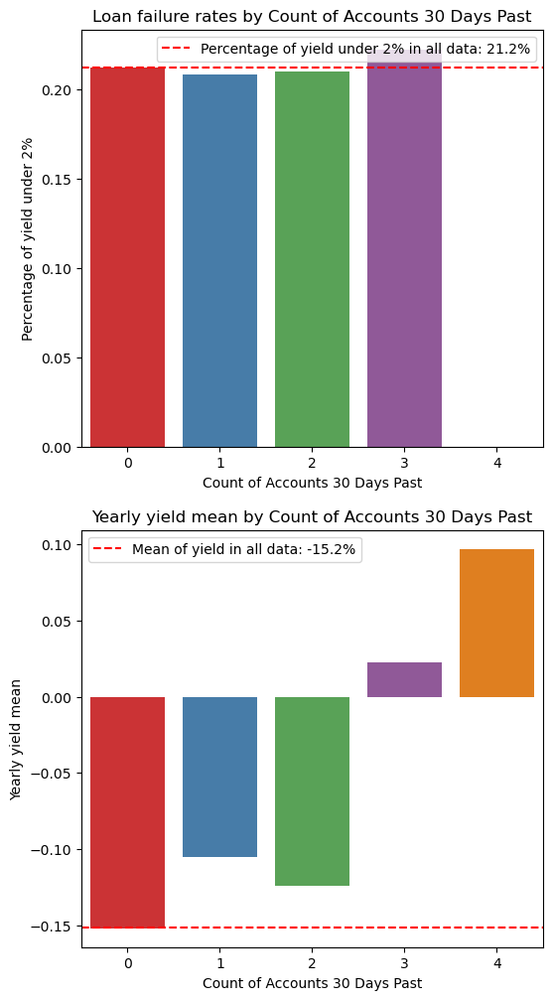

,num_tl_30dpd,Count,normalize count,yield over percentages,yearly yield mean
0,0,327184,0.995867,0.211917,-0.151789
1,1,1286,0.003914,0.208398,-0.104876
2,2,62,0.000189,0.209677,-0.123759
3,3,9,0.000027,0.222222,0.022175
4,4,1,0.000003,0.000000,0.096835


In [47]:
plot_yield_graphs('num_tl_30dpd','Count of Accounts 30 Days Past')
yield_percentages('num_tl_30dpd')

In [48]:
data.drop('num_tl_30dpd', axis=1, inplace=True)

**num_tl_120dpd_2m**
<br>
This variable contains 99.89% of the data in one category, where both the failure and return rates are close to the overall average. Therefore, we will remove this variable and thus preventing potential biases or inaccuracies in our analysis that could arise from including a variable with minimal variation and limited impact on the target variable.

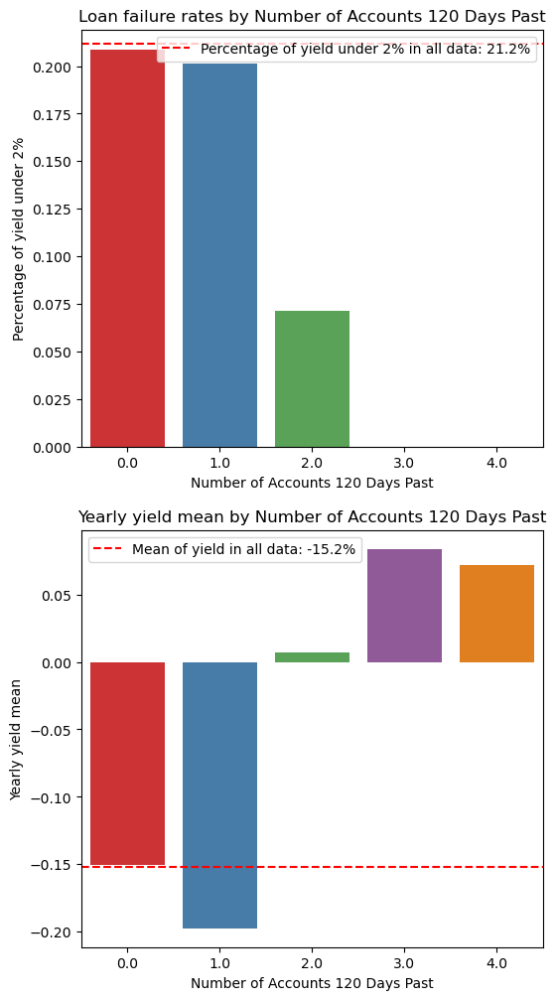

,num_tl_120dpd_2m,Count,normalize count,yield over percentages,yearly yield mean
0,0.0,311965,0.998962,0.208805,-0.150159
1,1.0,308,0.000986,0.201299,-0.197292
2,2.0,14,0.000045,0.071429,0.006868
3,3.0,1,0.000003,0.000000,0.083689
4,4.0,1,0.000003,0.000000,0.071952


In [49]:
plot_yield_graphs('num_tl_120dpd_2m','Number of Accounts 120 Days Past')
yield_percentages('num_tl_120dpd_2m')

In [50]:
data.drop('num_tl_120dpd_2m', axis=1, inplace=True)

**tax_liens**
<br>

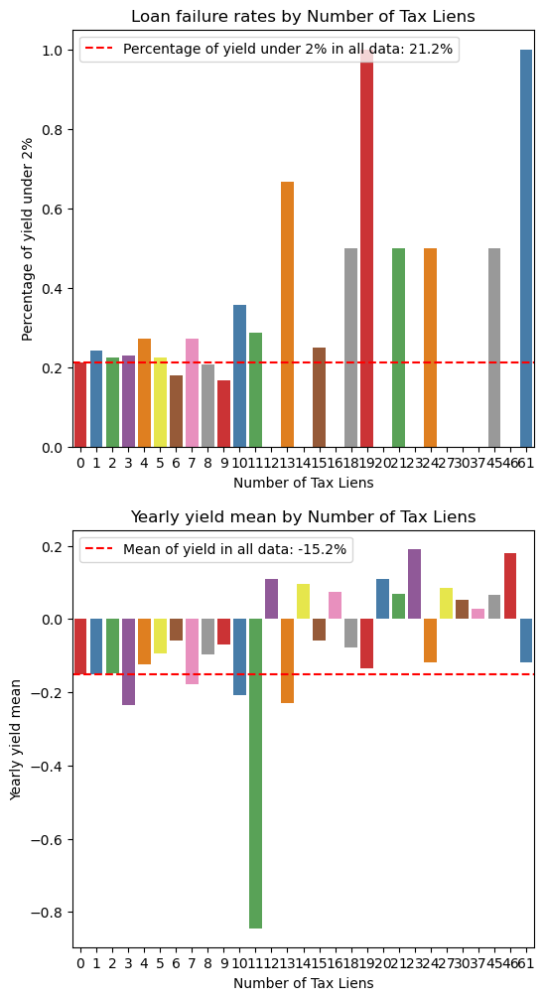

,tax_liens,Count,normalize count,yield over percentages,yearly yield mean
0,0,314145,0.956179,0.210677,-0.151467
1,1,9784,0.029780,0.242743,-0.151796
2,2,2674,0.008139,0.224383,-0.149442
3,3,952,0.002898,0.228992,-0.234359
4,4,451,0.001373,0.272727,-0.123862
5,5,249,0.000758,0.224900,-0.093862
6,6,112,0.000341,0.178571,-0.057915
7,7,59,0.000180,0.271186,-0.177788
8,8,34,0.000103,0.205882,-0.097445
9,9,18,0.000055,0.166667,-0.070781


In [51]:
plot_yield_graphs('tax_liens','Number of Tax Liens')
yield_percentages('tax_liens')

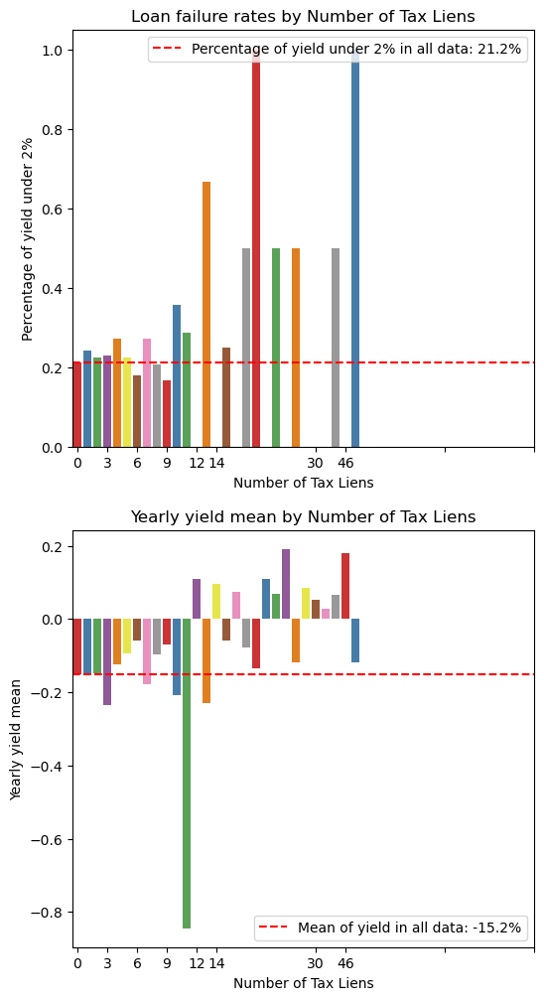

In [52]:
title='Number of Tax Liens'
col='tax_liens'
df = yield_percentages(col)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])
    
axes[0].set_xlabel(title)
axes[0].set_ylabel('Percentage of yield under 2%')
axes[0].set_title(f'Loan failure rates by {title}')
axes[0].set_xticks(df['tax_liens'][::3])
pop_mean = 1 - data['yield_over'].mean()
axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
    
sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
axes[1].set_xlabel(title)
axes[1].set_ylabel('Yearly yield mean')
axes[1].set_title(f'Yearly yield mean by {title}')
axes[1].set_xticks(df['tax_liens'][::3])
pop_mean = data['yield_yearly_1'].mean()
axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
    
axes[0].legend()
axes[1].legend()

plt.show()


In [53]:
data["has_tax_liens"] = data["tax_liens"].apply(lambda x: 1 if x > 0 else 0)
data.drop('tax_liens', axis=1, inplace=True)

#### Calculating Entropy 
We look for entropy that close to 0 that means there is no uncertainty or randomness in the system and the outcome is certain.

In [54]:
continuous_vars = data.select_dtypes(include=['int','object'])
sorted_entropy = continuous_vars.apply(lambda col: stats.entropy(col.value_counts(normalize=True)))
sorted_entropy.sort_values(ascending=False, inplace=True)
sorted_entropy

id                       12.702420
mo_sin_old_rev_tl_op      5.880915
total_acc                 3.826531
mo_sin_rcnt_rev_tl_op     3.522944
num_rev_accts             3.372033
addr_state                3.363290
num_il_tl                 3.141903
open_acc                  3.045419
num_sats                  3.041009
mo_sin_rcnt_tl            2.986429
num_op_rev_tl             2.823564
num_bc_tl                 2.821244
acc_open_past_24mths      2.503707
num_actv_rev_tl           2.493808
num_rev_tl_bal_gt_0       2.471303
num_bc_sats               2.374656
num_actv_bc_tl            2.123269
num_tl_op_past_12m        1.933689
mort_acc                  1.695756
purpose                   1.369338
home_ownership            0.978859
num_accts_ever_120_pd     0.940248
delinq_2yrs               0.744553
pub_rec                   0.634835
initial_list_status       0.543567
is_default?               0.519608
yield_over                0.516467
term                      0.490611
pub_rec_bankruptcies

**num_tl_90g_dpd_24m**
<br>
The variable "num_tl_90g_dpd_24m" represents the number of accounts a borrower has that are 90 or more days past due in the last 24 months. This variable is relevant for predicting loan defaults because a high number of accounts past due may indicate a history of not repaying debts on time, which increases the risk of default. While high numbers of accounts past due generally lead to higher failure rates, for certain cases with a high number of accounts past due, they do not represent a large percentage of the data. Therefore, we can make this variable binary, where 0 represents no accounts past due and 1 represents a history of having accounts past due for 90 or more days in the last 24 months.

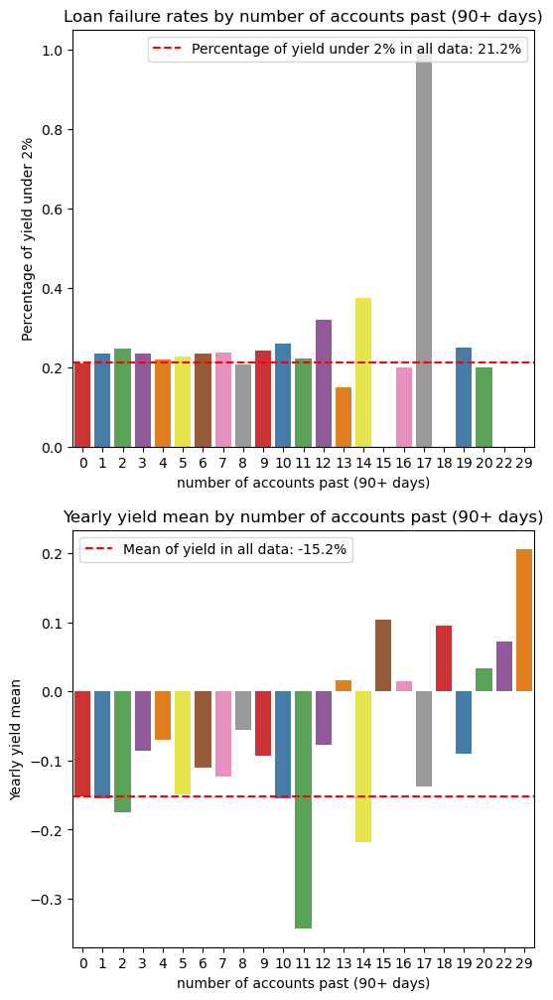

,num_tl_90g_dpd_24m,Count,normalize count,yield over percentages,yearly yield mean
0,0,309066,0.940720,0.210379,-0.151653
1,1,14495,0.044119,0.234840,-0.154200
2,2,2796,0.008510,0.247496,-0.175189
3,3,823,0.002505,0.234508,-0.085885
4,4,469,0.001428,0.219616,-0.070342
5,5,255,0.000776,0.227451,-0.148420
6,6,209,0.000636,0.234450,-0.110390
7,7,114,0.000347,0.236842,-0.123186
8,8,77,0.000234,0.207792,-0.055401
9,9,70,0.000213,0.242857,-0.093189


In [55]:
plot_yield_graphs('num_tl_90g_dpd_24m','number of accounts past (90+ days)')
yield_percentages('num_tl_90g_dpd_24m')

In [56]:
data["has_past_due_accounts_90g_24m"] = data["num_tl_90g_dpd_24m"].apply(lambda x: 1 if x > 0 else 0)
data.drop('num_tl_90g_dpd_24m', axis=1, inplace=True)

**pub_rec_bankruptcies**
<br>
"Pub_rec_bankruptcies" represents the number of public record bankruptcies a borrower has. This variable is relevant for predicting loan defaults because having a history of bankruptcy may indicate that the borrower has experienced financial difficulties in the past and may be at a higher risk of defaulting on the loan. Therefore, higher values of "pub_rec_bankruptcies" may be associated with a higher risk of default. Therefore, we can make this variable binary, where 0 represents no public record bankruptcies and 1 represents a more then one public record bankruptcies

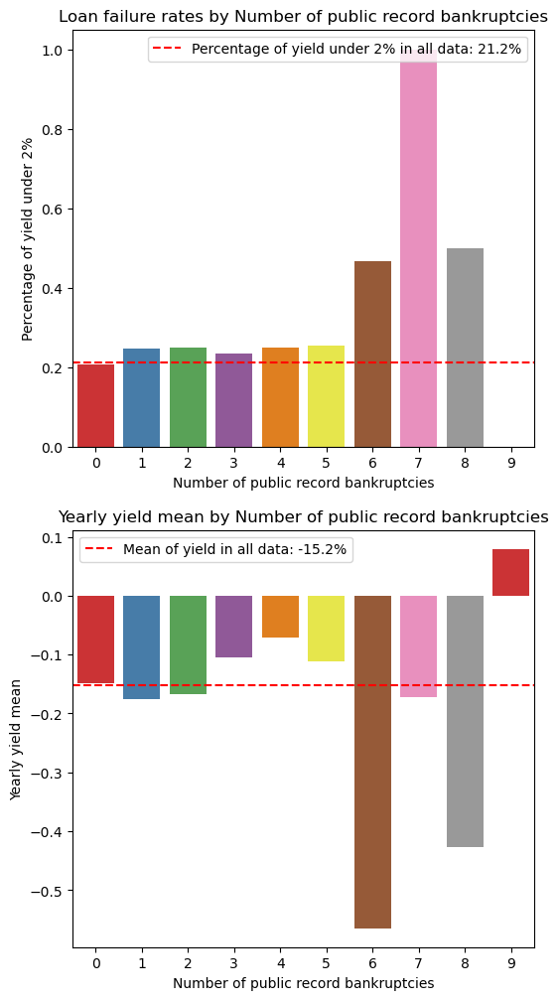

,pub_rec_bankruptcies,Count,normalize count,yield over percentages,yearly yield mean
0,0,283985,0.864380,0.206293,-0.148191
1,1,41065,0.124992,0.247632,-0.175030
2,2,2672,0.008133,0.248877,-0.166477
3,3,587,0.001787,0.233390,-0.104283
4,4,156,0.000475,0.250000,-0.070279
5,5,55,0.000167,0.254545,-0.111431
6,6,15,0.000046,0.466667,-0.564477
7,8,4,0.000012,0.500000,-0.426362
8,7,2,0.000006,1.000000,-0.172247
9,9,1,0.000003,0.000000,0.079271


In [57]:
plot_yield_graphs('pub_rec_bankruptcies','Number of public record bankruptcies')
yield_percentages('pub_rec_bankruptcies')

In [58]:
data["has_pub_rec_bankruptcies"] = data["pub_rec_bankruptcies"].apply(lambda x: 1 if x > 0 else 0)
data.drop('pub_rec_bankruptcies', axis=1, inplace=True)

**term**
For now we will keep this variable (you can see higher than average failure rates for loans taken for 60 months) and they represent 20% of the data - quite a bit.

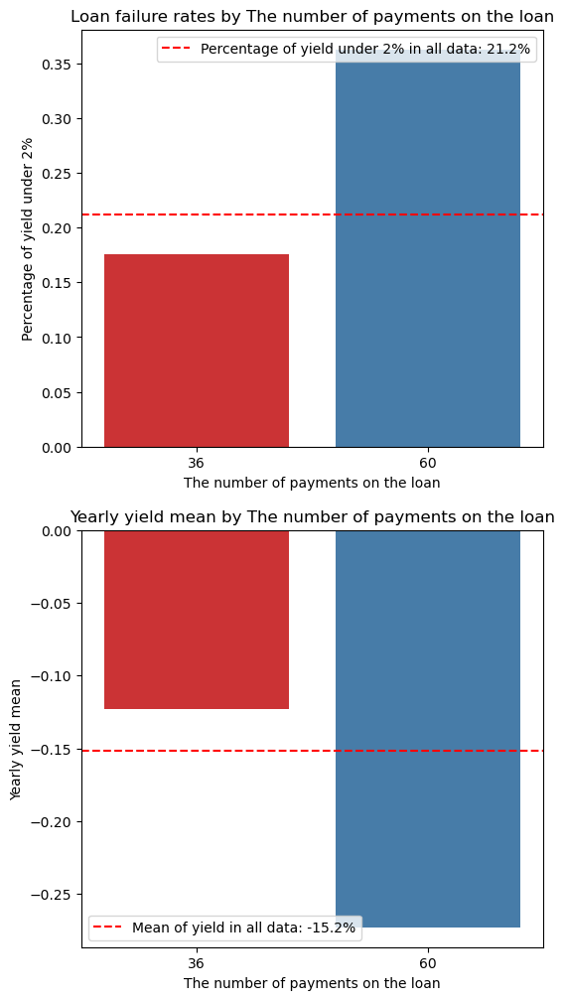

,term,Count,normalize count,yield over percentages,yearly yield mean
0,36,265118,0.806953,0.175827,-0.122613
1,60,63424,0.193047,0.362702,-0.272742


In [59]:
plot_yield_graphs('term','The number of payments on the loan')
yield_percentages('term')

### Handling missing values
Missing values can affect the accuracy of statistical analyses and modeling, and can lead to biased results or inaccurate predictions.

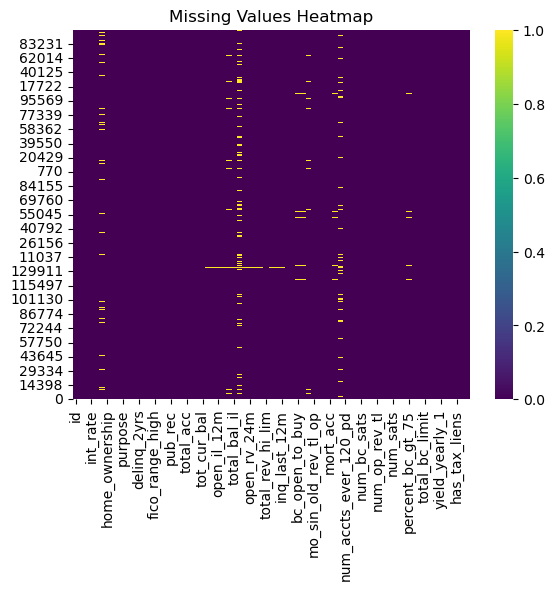

In [60]:
sns.heatmap(data.isnull(), cmap='viridis')
plt.title('Missing Values Heatmap')
plt.ylim(0, len(data))
plt.show()

In [61]:
"""
This code calculates the percentage of missing values for each column in the dataset and returns 
a sorted list of columns that have missing values higher than 0%, along with their corresponding 
percentage of missing values. The resulting dictionary is printed in descending order of NaN percentages.
"""

na_percent = {}

# Loop through the columns in data dataframe
for column in data.columns:
    if column == 'id':
        continue
    na_count = data[column].isna().sum()
    na_percent[column] = (na_count / len(data)) * 100

# Filter columns with NaN percentage higher than 0%
na_percent_above_0 = {column: na_percent for column, na_percent in na_percent.items() if na_percent > 0}

# Sort the dictionary by NaN percentages in descending order
sorted_na_percent_above_0 = {column: na_percent for column, na_percent in sorted(na_percent_above_0.items(), key=lambda x: x[1], reverse=True)}

# Print the sorted list of column names and NaN percentages
print("Columns with NaN percentage higher than 0% (sorted):")
for column, na_percent in sorted_na_percent_above_0.items():
    print(f"{column}: {na_percent:.2f}% NaN Percent")


Columns with NaN percentage higher than 0% (sorted):
il_util: 13.20% NaN Percent
mths_since_recent_inq: 9.83% NaN Percent
emp_length: 6.52% NaN Percent
mths_since_rcnt_il: 2.69% NaN Percent
mo_sin_old_il_acct: 2.68% NaN Percent
bc_util: 1.13% NaN Percent
percent_bc_gt_75: 1.09% NaN Percent
bc_open_to_buy: 1.08% NaN Percent
mths_since_recent_bc: 1.01% NaN Percent
revol_util: 0.06% NaN Percent
yield_2: 0.04% NaN Percent
all_util: 0.02% NaN Percent
open_acc_6m: 0.02% NaN Percent
total_cu_tl: 0.02% NaN Percent
inq_last_12m: 0.02% NaN Percent
open_act_il: 0.02% NaN Percent
open_il_12m: 0.02% NaN Percent
open_il_24m: 0.02% NaN Percent
total_bal_il: 0.02% NaN Percent
open_rv_12m: 0.02% NaN Percent
open_rv_24m: 0.02% NaN Percent
max_bal_bc: 0.02% NaN Percent
inq_fi: 0.02% NaN Percent
inq_last_6mths: 0.00% NaN Percent


Since this is a very small amount of instances, we will remove all instances with a percentage of missing values smaller than 0.07%

In [62]:
"""
This script drops rows containing missing values in columns with less than 0.07% percentage of missing values.
It returns the number of features with missing values and the number and percentage of rows that were removed.
"""

data_t=data.copy()
i=0
initial_instances = data_t.shape[0]

for column, na_percent in sorted_na_percent_above_0.items():
    if na_percent < 0.07:
        i+=1
        data_t.dropna(subset=[column], inplace=True)

final_instances = data_t.shape[0]
removed_number = (initial_instances - final_instances)
removed_percent = removed_number / initial_instances * 100


print('there is:',len(na_percent_above_0.keys()),"featuers with missing value")
print('Of these:',removed_number,"have less than 0.07% percentage of missing values and it",removed_percent,"Percentage of the data")

there is: 24 featuers with missing value
Of these: 395 have less than 0.07% percentage of missing values and it 0.12022815956559588 Percentage of the data


In [63]:
for column, na_percent in sorted_na_percent_above_0.items():
    if na_percent < 0.07:
        data.dropna(subset=[column], inplace=True)

In [64]:
"""
This code calculates the percentage of missing values for each column in the dataset and returns 
a sorted list of columns that have missing values higher than 0%, along with their corresponding 
percentage of missing values. The resulting dictionary is printed in descending order of NaN percentages.
"""

na_percent = {}

# Loop through the columns in data dataframe
for column in data.columns:
    if column == 'id':
        continue
    na_count = data[column].isna().sum()
    na_percent[column] = (na_count / len(data)) * 100

# Filter columns with NaN percentage higher than 0%
na_percent_above_0 = {column: na_percent for column, na_percent in na_percent.items() if na_percent > 0}

# Sort the dictionary by NaN percentages in descending order
sorted_na_percent_above_0 = {column: na_percent for column, na_percent in sorted(na_percent_above_0.items(), key=lambda x: x[1], reverse=True)}

# Print the sorted list of column names and NaN percentages
print("Columns with NaN percentage higher than 0% (sorted):")
for column, na_percent in sorted_na_percent_above_0.items():
    print(f"{column}: {na_percent:.2f}% NaN Percent")

Columns with NaN percentage higher than 0% (sorted):
il_util: 13.19% NaN Percent
mths_since_recent_inq: 9.82% NaN Percent
emp_length: 6.51% NaN Percent
mths_since_rcnt_il: 2.68% NaN Percent
mo_sin_old_il_acct: 2.68% NaN Percent
bc_util: 1.07% NaN Percent
percent_bc_gt_75: 1.03% NaN Percent
bc_open_to_buy: 1.03% NaN Percent
mths_since_recent_bc: 0.96% NaN Percent


**il_util and mths_since_recent_inq**
<br>
The "il_util" feature reflects a borrower's account utilization, which is important in assessing ability to return loan. We can use other related columns such as payment and credit utilization to predict this variable, we can see that they have high correlation.
The "mths_since_recent_inq" feature reflects the number of months since the borrower's most recent installment accounts opened, which is important in assessing ability to return a loan. 
We observed that the distribution of "il_util" has a median greater than the mean, indicating a non-normal distribution. Hence, we will use the median to fill in the missing values, which is a more conservative approach. A lower value of "il_util" suggests that the borrower is utilizing a smaller portion of their available credit, potentially reducing the risk of default and improving their creditworthiness.

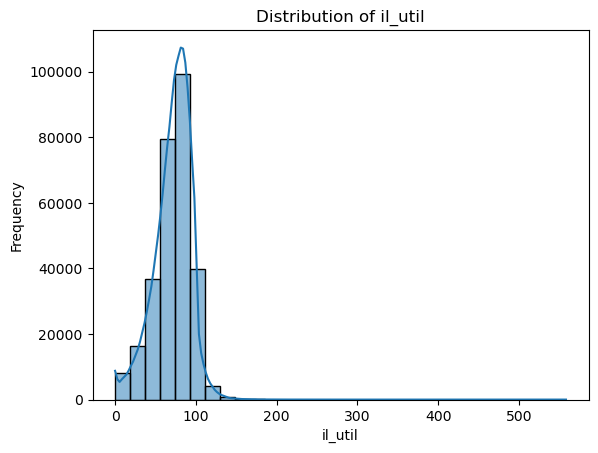

In [65]:
col_withoutnas = data.reset_index()['il_util']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=30, kde=True)
plt.xlabel('il_util')
plt.ylabel('Frequency')
plt.title('Distribution of il_util')
plt.show()

In [66]:
il_util_medi = data["il_util"].median()
data["il_util_med"]=data["il_util"]
data["il_util_med"].fillna(il_util_medi, inplace=True)

The "mths_since_rcnt_il" distribution shows a higher mean than the median, indicating some outliers in the data. To address missing values, we will use the median as a conservative approach. Higher values of "mths_since_rcnt_il" suggest that the borrower has not recently applied for new credit, which could reduce the risk of default.

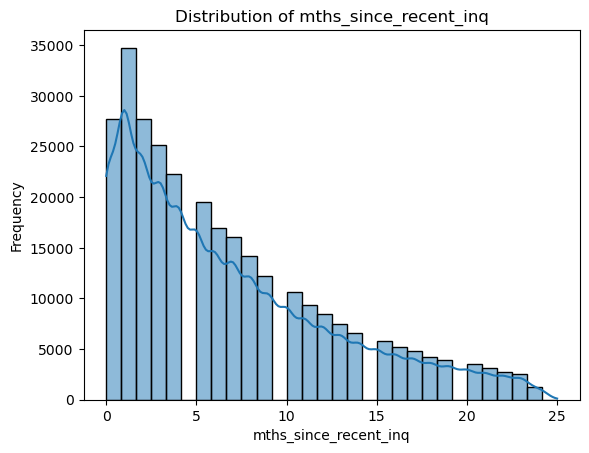

In [67]:
col_withoutnas = data.reset_index()['mths_since_recent_inq']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=30, kde=True)
plt.xlabel('mths_since_recent_inq')
plt.ylabel('Frequency')
plt.title('Distribution of mths_since_recent_inq')
plt.show()

In [68]:
mths_since_recent_inq_med = data["mths_since_recent_inq"].median()
data["mths_since_recent_inq_med"]=data["mths_since_recent_inq"]
data["mths_since_recent_inq_med"].fillna(mths_since_recent_inq_med, inplace=True)

The "il_util" feature reflects a borrower's account utilization, which is important in assessing ability to return a loan. We can use other related columns such as payment and credit utilization to predict this variable, we can see that they have high correlation.

The "mths_since_recent_inq_med" feature reflects the number of months since the borrower's most recent installment accounts opened, which is important in assessing ability to return a loan. We can use other related columns , we can see that there is high correlation.

In [69]:
"""
This code creates a correlation matrix using the `corr()` function on a DataFrame called `data`. 
It then finds the columns with the highest correlation to two specific features: `il_util` and `mths_since_recent_inq`.
The results are printed to the console, showing the column names with the highest correlation for each feature.
"""

corr_matrix = data.corr()

# Find the column with highest correlation to il_util
highest_corr_to_il_util = corr_matrix['il_util'].sort_values(ascending=False).index[0:6]

# Find the column with highest correlation to mths_since_recent_inq
highest_corr_to_mths_since_recent_inq = corr_matrix['mths_since_recent_inq'].sort_values(ascending=False).index[0:10]

# Print the results
print("Column with highest correlation to il_util: ", highest_corr_to_il_util)
print("Column with highest correlation to mths_since_recent_inq: ", highest_corr_to_mths_since_recent_inq)


Column with highest correlation to il_util:  Index(['il_util', 'il_util_med', 'all_util', 'open_il_12m', 'total_bal_il',
       'open_il_24m'],
      dtype='object')
Column with highest correlation to mths_since_recent_inq:  Index(['mths_since_recent_inq_med', 'mths_since_recent_inq', 'mo_sin_rcnt_tl',
       'mo_sin_rcnt_rev_tl_op', 'revol_util', 'mths_since_rcnt_il',
       'mths_since_recent_bc', 'bc_util', 'percent_bc_gt_75',
       'fico_range_high'],
      dtype='object')


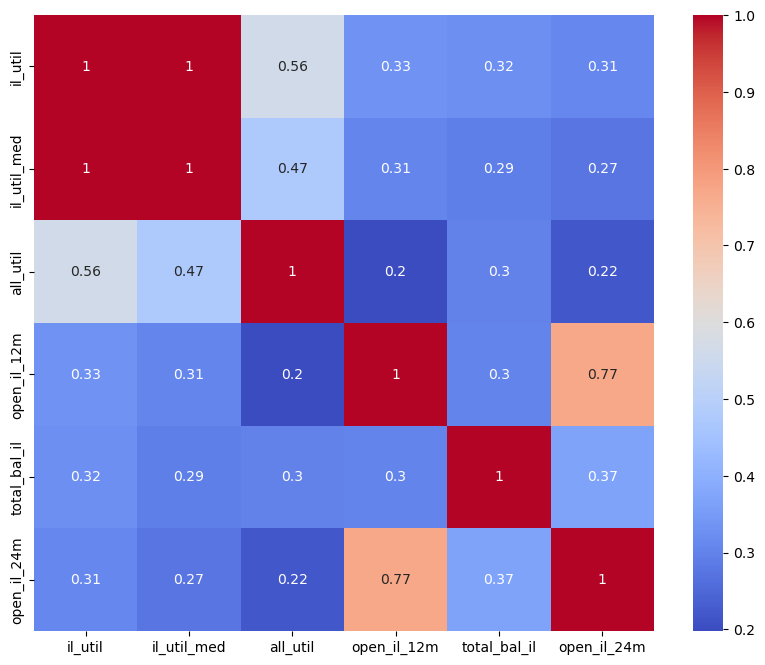

In [70]:
corr_matrix = data.corr()

# Find the column with highest correlation to il_util
highest_corr_to_il_util = corr_matrix['il_util'].sort_values(ascending=False).index[0:6]

# Create a subset of the correlation matrix using the columns in highest_corr_to_il_util
corr_subset = corr_matrix.loc[highest_corr_to_il_util, highest_corr_to_il_util]

# Plot the heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr_subset, cmap='coolwarm', annot=True)
plt.show()


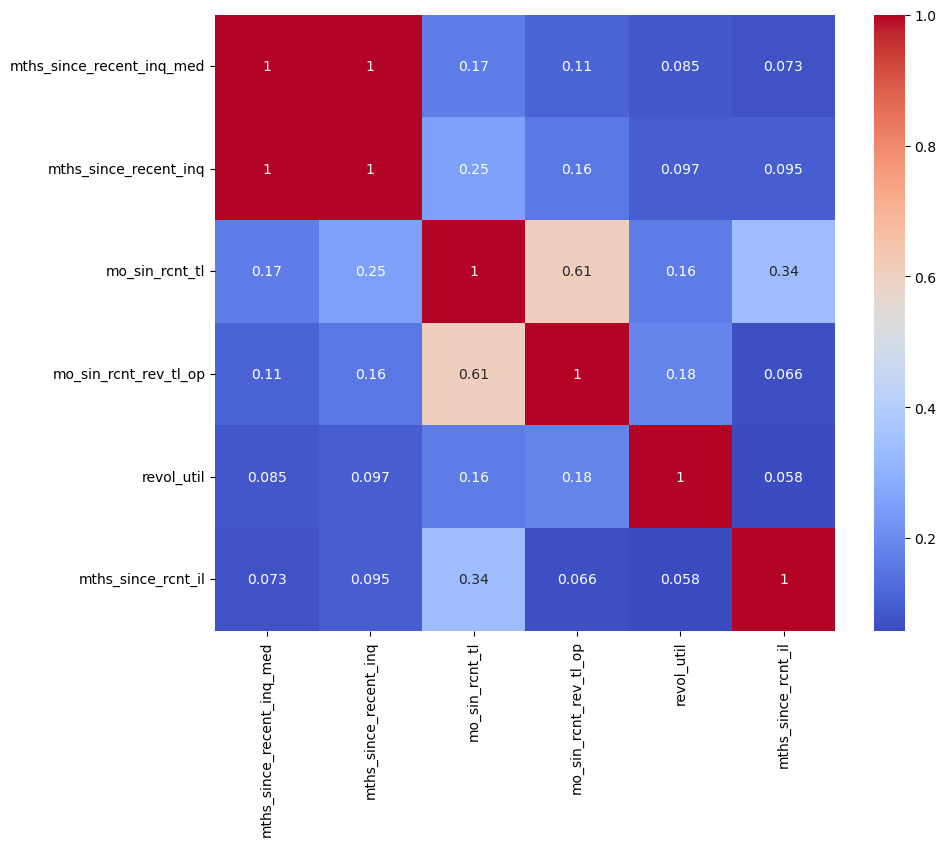

In [71]:
mths_since_recent_inq_features = ['mo_sin_rcnt_tl', 'mo_sin_rcnt_rev_tl_op', 'fico_range_high', 'fico_range_low']

corr_matrix = data.corr()

# Find the column with highest correlation to il_util
highest_corr_to_mths_since_recent_inq = corr_matrix['mths_since_recent_inq'].sort_values(ascending=False).index[0:6]

# Create a subset of the correlation matrix using the columns in highest_corr_to_il_util
corr_subset = corr_matrix.loc[highest_corr_to_mths_since_recent_inq, highest_corr_to_mths_since_recent_inq]

# Plot the heatmap
plt.figure(figsize=(10,8))
sns.heatmap(corr_subset, cmap='coolwarm', annot=True)
plt.show()


In [72]:
"""
Impute missing values in the 'il_util' and 'mths_since_recent_inq' columns using linear regression models 
trained on related features. 
"""

# columns to be used as features for imputing il_util
il_util_features = ['all_util', 'open_il_12m', 'total_bal_il', 'open_il_24m', 'open_act_il']

# columns to be used as features for imputing mths_since_recent_inq
mths_since_recent_inq_features = ['mo_sin_rcnt_tl', 'mo_sin_rcnt_rev_tl_op', 'fico_range_high', 'fico_range_low']

# create a new dataframe with only the columns to be used for imputing
il_util_df = data[['il_util'] + il_util_features].dropna()
mths_since_recent_inq_df = data[['mths_since_recent_inq'] + mths_since_recent_inq_features].dropna()

# separate the dependent variable (il_util/mths_since_recent_inq) from the features
il_util_X = il_util_df[il_util_features]
il_util_y = il_util_df['il_util']
mths_since_recent_inq_X = mths_since_recent_inq_df[mths_since_recent_inq_features]
mths_since_recent_inq_y = mths_since_recent_inq_df['mths_since_recent_inq']

# create a linear regression model for each column
il_util_model = LinearRegression().fit(il_util_X, il_util_y)
mths_since_recent_inq_model = LinearRegression().fit(mths_since_recent_inq_X, mths_since_recent_inq_y)

# get indices of rows with missing values for each column
il_util_missing_indices = data[data['il_util'].isna()].index
mths_since_recent_inq_missing_indices = data[data['mths_since_recent_inq'].isna()].index

# predict missing values using the trained models and fill them in the original dataframe
if len(il_util_missing_indices) > 0:
    data.loc[il_util_missing_indices, 'il_util'] = il_util_model.predict(data.loc[il_util_missing_indices, il_util_features])
if len(mths_since_recent_inq_missing_indices) > 0:
    data.loc[mths_since_recent_inq_missing_indices, 'mths_since_recent_inq'] = mths_since_recent_inq_model.predict(data.loc[mths_since_recent_inq_missing_indices, mths_since_recent_inq_features])


In [73]:
data['il_util'] = data['il_util'].astype(int)
data['il_util_med'] = data['il_util_med'].astype(int)
data['mths_since_recent_inq'] = data['mths_since_recent_inq'].astype(int)
data['mths_since_recent_inq_med'] = data['mths_since_recent_inq_med'].astype(int)

**emp_length**

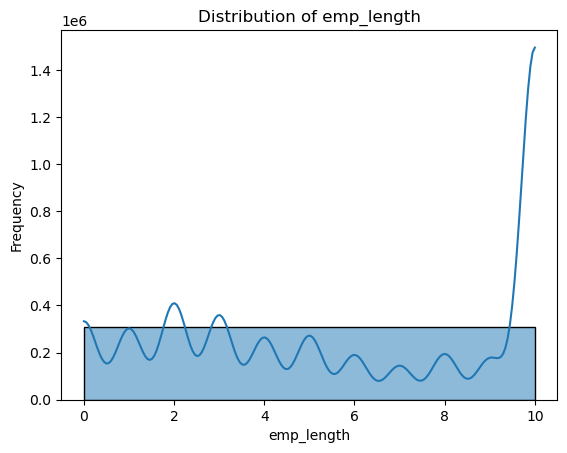

In [74]:
col_withoutnas = data.reset_index()['emp_length']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=1, kde=True)
plt.xlabel('emp_length')
plt.ylabel('Frequency')
plt.title('Distribution of emp_length')
plt.show()

In [75]:
"""
This code block fills in missing values in the 'emp_length' column of a DataFrame by using the mode of 'emp_length'
for unique combinations of 'home_ownership' and 'annual_inc_range'. It performs the following steps:
"""

# Make a copy of the original DataFrame
df_clean = data.copy()

# Create a DataFrame of unique combinations of "home_ownership" and "annual_inc" with NaN values in "emp_length"
result = df_clean[df_clean['emp_length'].isna()][['home_ownership', 'annual_inc']]
result = result.drop_duplicates()

# Bin the annual_inc values into groups
result['annual_inc_range'] = pd.cut(result['annual_inc'], bins=np.arange(0, 1000000, 5000))

# Split the DataFrame into two parts: one with NaN values in "emp_length" and one without
df_with_na = df_clean[df_clean['emp_length'].isna()]
df_without_na = df_clean[df_clean['emp_length'].notna()]

# For each unique combination of "home_ownership" and "annual_inc_range" with NaN values in "emp_length",
# calculate the mode of "emp_length" for the corresponding group, and fill in the NaN values with this mode
for i in result[['home_ownership', 'annual_inc_range']].drop_duplicates().itertuples():
    a = df_without_na[(df_without_na['home_ownership'] == i.home_ownership) & 
                      (pd.cut(df_without_na['annual_inc'], bins=np.arange(0, 1000000, 5000)) == i.annual_inc_range)]
    mode_emp_length = a['emp_length'].mode()
    if len(mode_emp_length) > 0:
        df_with_na.loc[(df_with_na['home_ownership'] == i.home_ownership) & 
                       (pd.cut(df_with_na['annual_inc'], bins=np.arange(0, 1000000, 5000)) == i.annual_inc_range), 
                       'emp_length'] = mode_emp_length[0]

# Concatenate the two parts of the DataFrame back together
data = pd.concat([df_with_na, df_without_na], ignore_index=True)


In [76]:
num_instances_with_na = sum(data['emp_length'].isna())
print("Number of instances with missing emp_length:", num_instances_with_na)
print("Although there are instances with missing emp_length, the number is very low.")
print("These instances have a very low frequency in the annual income feature.")
print("Therefore, we will remove them from the data.")
data = data.dropna(subset=['emp_length'])

Number of instances with missing emp_length: 7
Although there are instances with missing emp_length, the number is very low.
These instances have a very low frequency in the annual income feature.
Therefore, we will remove them from the data.


**mths_since_rcnt_il**
<br>
For the column in question, the mean is larger than the median. This indicates that there are a few very large values (outliers) that are pulling up the mean. To be more conservative in our approach, we will use the average to impute missing values.
However, because the difference between the average and the median is relatively large due to the presence of outliers, we will also consider using the median to impute missing values to have a more robust and conservative approach.

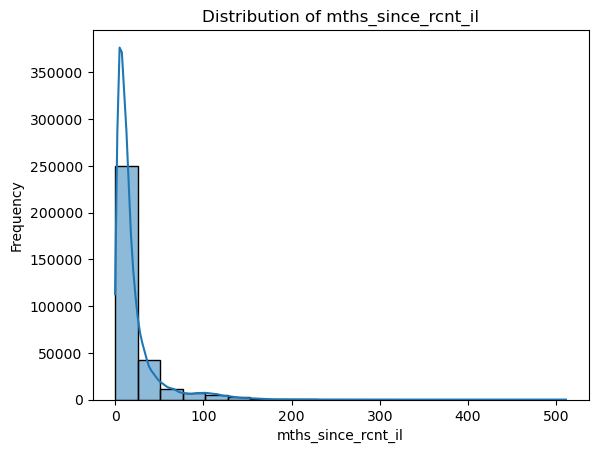

In [77]:
col_withoutnas = data.reset_index()['mths_since_rcnt_il']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('mths_since_rcnt_il')
plt.ylabel('Frequency')
plt.title('Distribution of mths_since_rcnt_il')
plt.show()

In [78]:
mths_since_rcnt_il_med = data["mths_since_rcnt_il"].median()
data["mths_since_rcnt_il_med"]=data["mths_since_rcnt_il"]
data["mths_since_rcnt_il_med"].fillna(mths_since_rcnt_il_med, inplace=True)

mths_since_rcnt_il_mean = data["mths_since_rcnt_il"].median()
data["mths_since_rcnt_il_mean"]=data["mths_since_rcnt_il"]
data["mths_since_rcnt_il_mean"].fillna(mths_since_rcnt_il_mean, inplace=True)

data['mths_since_rcnt_il_mean'] = data['mths_since_rcnt_il_mean'].astype(int)
data['mths_since_rcnt_il_med'] = data['mths_since_rcnt_il_med'].astype(int)
data.drop('mths_since_rcnt_il', axis=1, inplace=True)

**mo_sin_old_il_acct**
<br>
For the column in question, the median is larger than the mean. This indicates that there are a few very large values (outliers) that are pulling up the mean. To be more conservative in our approach, we will use the median to impute missing values.
However, because the difference between the average and the median is relatively large due to the presence of outliers, we will also consider using the mean to impute missing values to have a more robust and conservative approach.

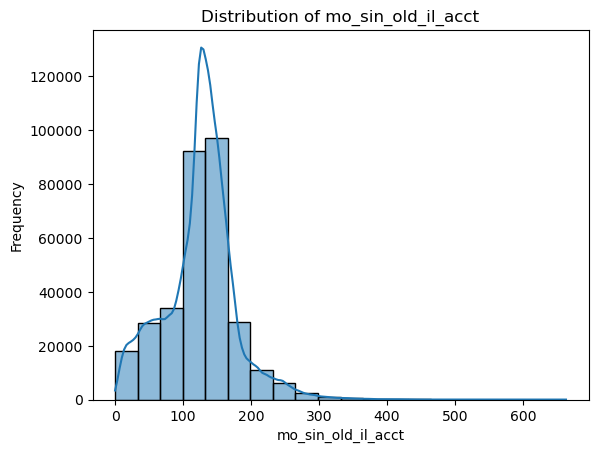

In [79]:
col_withoutnas = data.reset_index()['mo_sin_old_il_acct']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('mo_sin_old_il_acct')

plt.ylabel('Frequency')
plt.title('Distribution of mo_sin_old_il_acct')
plt.show()

In [80]:
mo_sin_old_il_acct_med = data["mo_sin_old_il_acct"].median()
data["mo_sin_old_il_acct_med"]=data["mo_sin_old_il_acct"]
data["mo_sin_old_il_acct_med"].fillna(mo_sin_old_il_acct_med, inplace=True)

mo_sin_old_il_acct_mean = data["mo_sin_old_il_acct"].median()
data["mo_sin_old_il_acct_mean"]=data["mo_sin_old_il_acct"]
data["mo_sin_old_il_acct_mean"].fillna(mo_sin_old_il_acct_mean, inplace=True)

data['mo_sin_old_il_acct_mean'] = data['mo_sin_old_il_acct_mean'].astype(int)
data['mo_sin_old_il_acct_med'] = data['mo_sin_old_il_acct_med'].astype(int)
data.drop('mo_sin_old_il_acct', axis=1, inplace=True)

**bc_util**
<br>
The mean is larger than the median. This indicates that there are a few very large values (outliers) that are pulling up the mean. To be more conservative in our approach, we will use the average to impute missing values.
However, because the difference between the average and the median is relatively large due to the presence of outliers, we will also consider using the median to impute missing values to have a more robust and conservative approach.

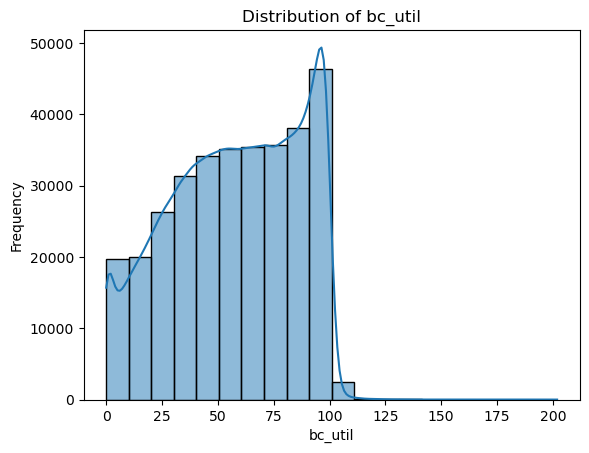

In [81]:
col_withoutnas = data.reset_index()['bc_util']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('bc_util')

plt.ylabel('Frequency')
plt.title('Distribution of bc_util')
plt.show()

In [82]:
bc_util_med = data["bc_util"].median()
data["bc_util_med"]=data["bc_util"]
data["bc_util_med"].fillna(bc_util_med, inplace=True)

bc_util_mean = data["bc_util"].median()
data["bc_util_mean"]=data["bc_util"]
data["bc_util_mean"].fillna(mo_sin_old_il_acct_mean, inplace=True)

data['bc_util_med'] = data['bc_util_med'].astype(int)
data['bc_util_mean'] = data['bc_util_mean'].astype(int)
data.drop('bc_util', axis=1, inplace=True)

**percent_bc_gt_75**
<br>
Because of the unclear distribution, we will complete both by mean and median.

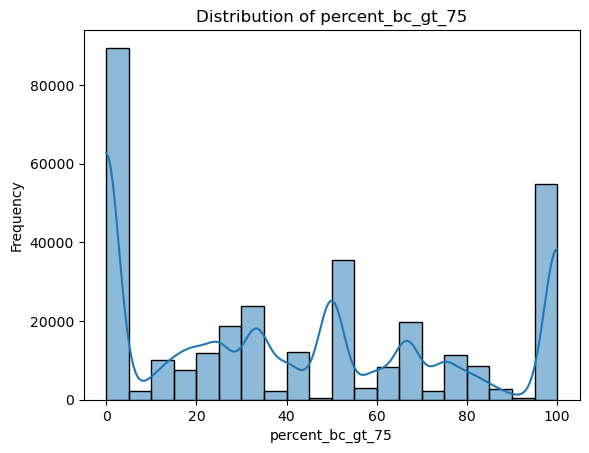

In [83]:
col_withoutnas = data.reset_index()['percent_bc_gt_75']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=20, kde=True)
plt.xlabel('percent_bc_gt_75')

plt.ylabel('Frequency')
plt.title('Distribution of percent_bc_gt_75')
plt.show()

In [84]:
percent_bc_gt_75_med = data["percent_bc_gt_75"].median()
data["percent_bc_gt_75_med"]=data["percent_bc_gt_75"]
data["percent_bc_gt_75_med"].fillna(percent_bc_gt_75_med, inplace=True)

percent_bc_gt_75_mean = data["percent_bc_gt_75"].median()
data["percent_bc_gt_75_mean"]=data["percent_bc_gt_75"]
data["percent_bc_gt_75_mean"].fillna(percent_bc_gt_75_mean, inplace=True)

data['percent_bc_gt_75_med'] = data['percent_bc_gt_75_med'].astype(int)
data['percent_bc_gt_75_mean'] = data['percent_bc_gt_75_mean'].astype(int)
data.drop('percent_bc_gt_75', axis=1, inplace=True)

**bc_open_to_buy**
<br>
Because the mean and the median are very far from each other due to many outliers we will use both the mean and the median.

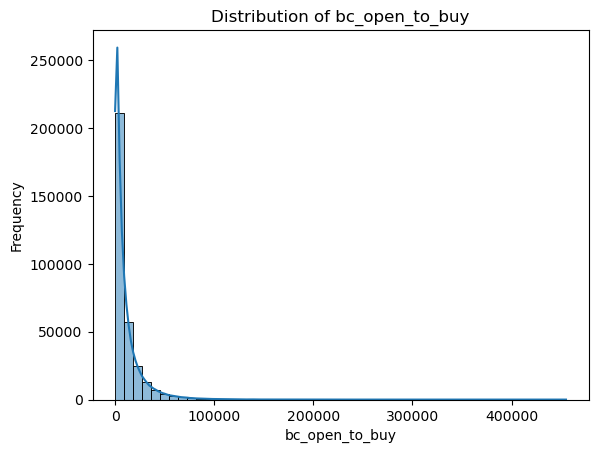

In [85]:
col_withoutnas = data.reset_index()['bc_open_to_buy']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=50, kde=True)
plt.xlabel('bc_open_to_buy')

plt.ylabel('Frequency')
plt.title('Distribution of bc_open_to_buy')
plt.show()

In [86]:
bc_open_to_buy_med = data["bc_open_to_buy"].median()
data["bc_open_to_buy_med"]=data["bc_open_to_buy"]
data["bc_open_to_buy_med"].fillna(bc_open_to_buy_med, inplace=True)

bc_open_to_buy_mean = data["bc_open_to_buy"].median()
data["bc_open_to_buy_mean"]=data["bc_open_to_buy"]
data["bc_open_to_buy_mean"].fillna(bc_open_to_buy_mean, inplace=True)

data['bc_open_to_buy_med'] = data['bc_open_to_buy_med'].astype(int)
data['bc_open_to_buy_mean'] = data['bc_open_to_buy_mean'].astype(int)
data.drop('bc_open_to_buy', axis=1, inplace=True)

**mths_since_recent_bc**
<br>
Because the mean and the median are very far from each other due to many outliers we will use both the mean and the median.

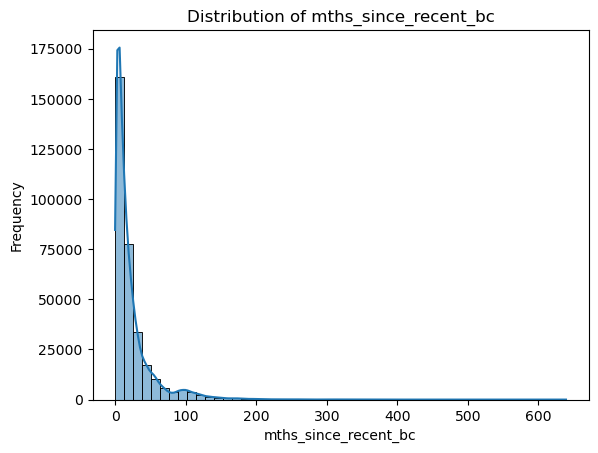

In [87]:
col_withoutnas = data.reset_index()['mths_since_recent_bc']
col_withoutnas.dropna(inplace=True)

sns.histplot(col_withoutnas, bins=50, kde=True)
plt.xlabel('mths_since_recent_bc')

plt.ylabel('Frequency')
plt.title('Distribution of mths_since_recent_bc')
plt.show()

In [88]:
mths_since_recent_bc_med = data["mths_since_recent_bc"].median()
data["mths_since_recent_bc_med"]=data["mths_since_recent_bc"]
data["mths_since_recent_bc_med"].fillna(bc_open_to_buy_med, inplace=True)

mths_since_recent_bc_mean = data["mths_since_recent_bc"].median()
data["mths_since_recent_bc_mean"]=data["mths_since_recent_bc"]
data["mths_since_recent_bc_mean"].fillna(bc_open_to_buy_mean, inplace=True)

data['mths_since_recent_bc_med'] = data['mths_since_recent_bc_med'].astype(int)
data['mths_since_recent_bc_mean'] = data['mths_since_recent_bc_mean'].astype(int)
data.drop('mths_since_recent_bc', axis=1, inplace=True)

### Find low frequency values in each feature

In [89]:
low_freq_threshold = 0.02
low_freq_values = {}

for feature in data.columns:
    if data[feature].dtype == "object":
        counts = data[feature].value_counts(normalize=True)
        low_freq = counts[counts < low_freq_threshold].index.tolist()
        if len(low_freq) > 0:
            low_freq_values[feature] = low_freq
            
for feature, values in low_freq_values.items():
    print(f"Low frequency values in feature '{feature}':")
    print(values)

Low frequency values in feature 'home_ownership':
['ANY']
Low frequency values in feature 'purpose':
['medical', 'car', 'small_business', 'moving', 'vacation', 'house', 'renewable_energy', 'wedding']
Low frequency values in feature 'addr_state':
['WA', 'MN', 'IN', 'TN', 'MO', 'CT', 'NV', 'WI', 'AL', 'SC', 'LA', 'OR', 'KY', 'OK', 'KS', 'AR', 'UT', 'MS', 'NM', 'NH', 'NE', 'HI', 'RI', 'ME', 'ID', 'DE', 'MT', 'ND', 'DC', 'AK', 'WY', 'VT', 'SD', 'WV']


**home_ownership**

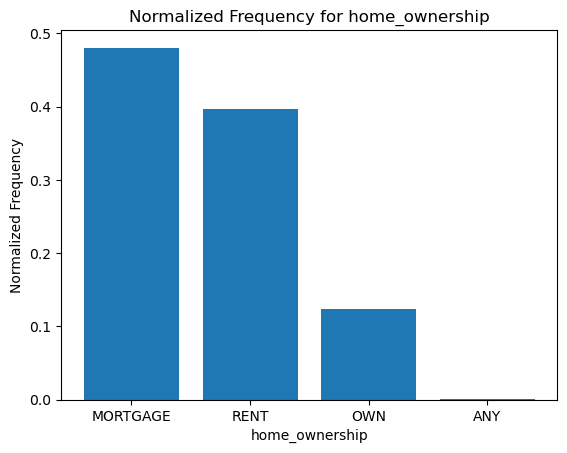

In [90]:
feature_value_counts = data['home_ownership'].value_counts(normalize=True)

plt.bar(feature_value_counts.index, feature_value_counts.values)
plt.xlabel('home_ownership')
plt.ylabel("Normalized Frequency")
plt.title("Normalized Frequency for home_ownership")
plt.show()

In [91]:
yield_percentages('home_ownership')

,home_ownership,Count,normalize count,yield over percentages,yearly yield mean
0,MORTGAGE,157645,0.480420,0.181357,-0.060603
1,RENT,129996,0.396160,0.248492,-0.128436
2,OWN,40432,0.123216,0.210823,-0.093864
3,ANY,67,0.000204,0.283582,-0.025055


In [92]:
data['home_ownership'] = data['home_ownership'].replace('ANY', 'OTHER')

So that the model does not fall, we will have to leave a category (other) for this column (according to the data dictionary, we will include any as other)

**purpose**

We will define 2 methods for handling this column and examine their level of significance later.

In [93]:
yield_percentages('purpose')

,purpose,Count,normalize count,yield over percentages,yearly yield mean
0,debt_consolidation,187435,0.571204,0.225171,-0.096180
1,credit_card,69049,0.210425,0.185665,-0.064679
2,home_improvement,23635,0.072027,0.180622,-0.083577
3,other,21705,0.066146,0.205483,-0.112179
4,major_purchase,7999,0.024377,0.194399,-0.105527
5,medical,4097,0.012486,0.226507,-0.146216
6,car,3709,0.011303,0.161499,-0.043216
7,small_business,3624,0.011044,0.294426,-0.197588
8,moving,2550,0.007771,0.227843,-0.149935
9,vacation,2523,0.007689,0.201744,-0.083325


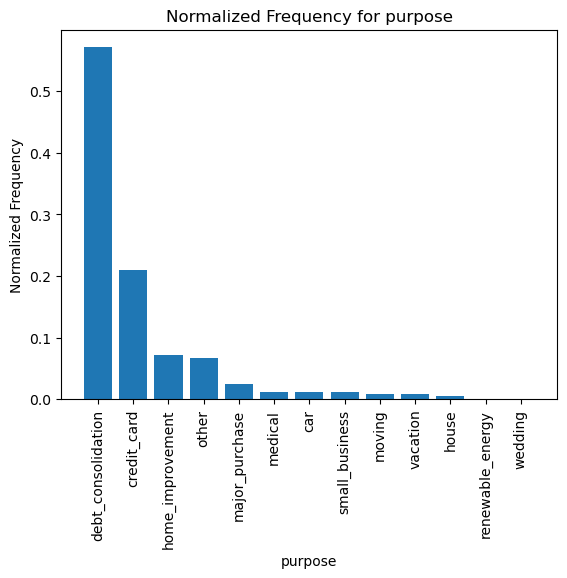

In [94]:
feature_value_counts = data['purpose'].value_counts(normalize=True)

plt.bar(feature_value_counts.index, feature_value_counts.values)
plt.xlabel('purpose')
plt.ylabel("Normalized Frequency")
plt.title("Normalized Frequency for purpose")

plt.xticks(rotation=90)
plt.show()

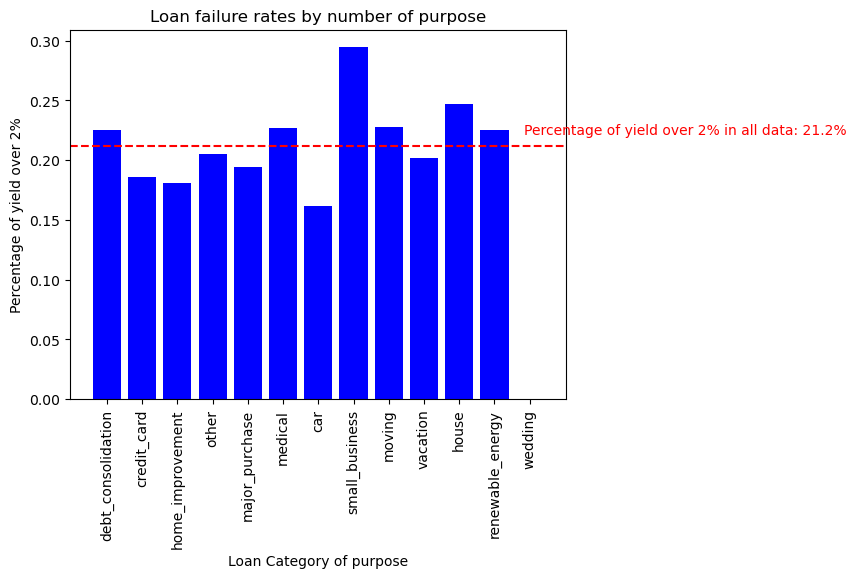

In [95]:
df = yield_percentages('purpose')

fig, ax = plt.subplots()

ax.bar(df['purpose'], df['yield over percentages'], color='blue')

ax.set_xlabel('Loan Category of purpose')
ax.set_ylabel('Percentage of yield over 2%')
ax.set_title('Loan failure rates by number of purpose')
ax.set_xticks(df['purpose'])  # show every other x-axis tick label

pop_mean = 1 - data['yield_over'].mean()
ax.axhline(pop_mean, color='red', linestyle='--')
ax.text(len(df['purpose'])+8, pop_mean+0.01, f'Percentage of yield over 2% in all data: {pop_mean*100:.1f}%', color='red', ha='right')
plt.xticks(rotation=90)

plt.show()

#### method 1

we will calculare the average, the median and the standard deviation.

In [96]:
# Calculate mean, median, and standard deviation of default percentages
mean_dev = np.mean(df['yield over percentages'])
median_dev = np.median(df['yield over percentages'])
std_dev = np.std(df['yield over percentages'])

pop_mean = 1 - data['yield_over'].mean()

print("the mean of population:", pop_mean)
print("the mean is:", mean_dev)
print("the median is:", median_dev)
print("the std is:", std_dev)

the mean of population: 0.21160480282806116
the mean is: 0.198124894936301
the median is: 0.20548260769407967
the std is: 0.06561184801982654


We will classify the level of risk associated with each loan based on the loan purpose- If the default percentage for that purpose is greater than the population mean, the value in purpose_danger will be set to 1, otherwise it will be set to 0. 

In [97]:
purpose_default_percentages = {}
for purpose in df['purpose']:
    purpose_default_percentages[purpose] = df[df['purpose'] == purpose]['yield over percentages'].values[0]

# Create new column in data indicating level of danger based on purpose
data['purpose_danger'] = data['purpose'].apply(lambda x: 1 if purpose_default_percentages[x] > pop_mean else 0)

#### method 2

We will change all the categories whose values are less than 1% of the data to other since it is impossible to rely on the reliability of this data in representing the population that is applying for the same purpose

In [98]:
data['purpose'] = data['purpose'].replace('wedding', 'other')
data['purpose'] = data['purpose'].replace('renewable_energy', 'other')
data['purpose'] = data['purpose'].replace('house', 'other')
data['purpose'] = data['purpose'].replace('vacation', 'other')
data['purpose'] = data['purpose'].replace('moving', 'other')

**addr_state**

In [99]:
yield_percentages('addr_state') 

,addr_state,Count,normalize count,yield over percentages,yearly yield mean
0,CA,45287,0.138011,0.215669,-0.102508
1,TX,27842,0.084848,0.215143,-0.090921
2,NY,26576,0.080990,0.228665,-0.103407
3,FL,24304,0.074066,0.224408,-0.112458
4,IL,12812,0.039044,0.199344,-0.083554
5,NJ,11695,0.035640,0.223172,-0.096451
6,OH,11069,0.033733,0.212937,-0.097446
7,GA,10820,0.032974,0.199445,-0.072673
8,PA,10574,0.032224,0.222338,-0.095340
9,NC,9338,0.028457,0.220711,-0.123867


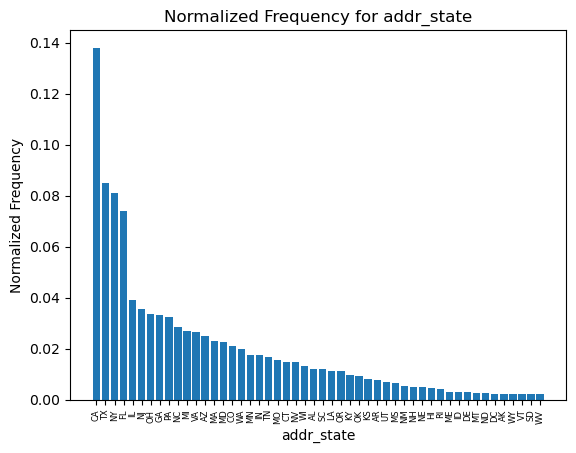

In [100]:
feature_value_counts = data['addr_state'].value_counts(normalize=True)

plt.bar(feature_value_counts.index, feature_value_counts.values)
plt.xlabel('addr_state')
plt.ylabel("Normalized Frequency")
plt.title("Normalized Frequency for addr_state")

plt.xticks(rotation=90, fontsize=6)
plt.show()


In [101]:
# Calculate mean, median, and standard deviation of default percentages
mean_dev = np.mean(df['yield over percentages'])
median_dev = np.median(df['yield over percentages'])
std_dev = np.std(df['yield over percentages'])

pop_mean = 1 - data['yield_over'].mean()

print("the mean of population:", pop_mean)
print("the mean is:", mean_dev)
print("the median is:", median_dev)
print("the std is:", std_dev)

the mean of population: 0.21160480282806116
the mean is: 0.198124894936301
the median is: 0.20548260769407967
the std is: 0.06561184801982654


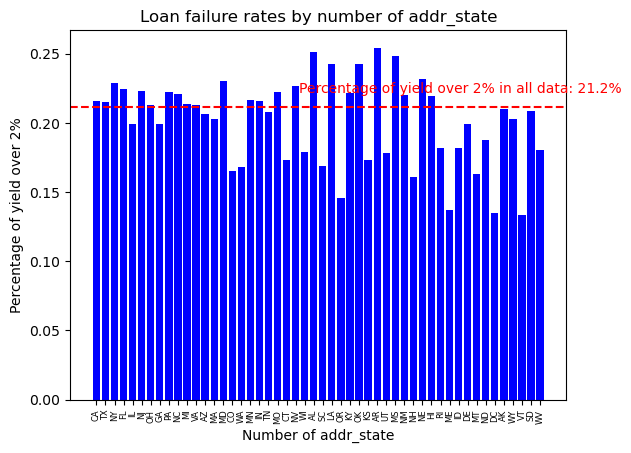

In [102]:
df = yield_percentages('addr_state')

fig, ax = plt.subplots()

ax.bar(df['addr_state'], df['yield over percentages'], color='blue')

ax.set_xlabel('Number of addr_state')
ax.set_ylabel('Percentage of yield over 2%')
ax.set_title('Loan failure rates by number of addr_state')
ax.set_xticks(df['addr_state'])  # show every other x-axis tick label

pop_mean = 1 - data['yield_over'].mean()
ax.axhline(pop_mean, color='red', linestyle='--')
ax.text(len(df['addr_state'])+8, pop_mean+0.01, f'Percentage of yield over 2% in all data: {pop_mean*100:.1f}%', color='red', ha='right')
plt.xticks(rotation=90, fontsize=6)

plt.show()

We will classify the level of risk associated with each loan based on the borrower's address state- If the yield over percentages for that address state is greater than the population mean, the value in addr_state_danger will be set to 1, otherwise it will be set to 0. 

In [103]:
addr_state_default_percentages = {}
for addr_state in df['addr_state']:
    addr_state_default_percentages[addr_state] = df[df['addr_state'] == addr_state]['yield over percentages'].values[0]

# Create new column in data indicating level of danger based on purpose
data['addr_state_danger'] = data['addr_state'].apply(lambda x: 1 if addr_state_default_percentages[x] > pop_mean else 0)

In [104]:
data.drop('addr_state', axis=1, inplace=True)

**earliest_cr_line**
<br>
Age of credit history: The age of the borrower's credit history, which is the difference between the earliest credit line and the date the loan was issued, may be an indicator of the borrower's creditworthiness. Borrowers with longer credit histories may be seen as less risky than those with shorter credit histories, assuming they have a good credit record during that time.

In [105]:
data['Age_of_credit_history']=(data['issue_d'] - data["earliest_cr_line"]).apply(lambda x: x.days/365.25)

In [106]:
data.drop('earliest_cr_line', axis=1, inplace=True)

In [107]:
pd.set_option("display.max_rows", None)
print(data.dtypes)
pd.reset_option("display.max_rows")

id                                        int64
loan_amnt                               float64
term                                      int64
int_rate                                float64
installment                             float64
emp_length                              float64
home_ownership                           object
annual_inc                              float64
issue_d                          datetime64[ns]
purpose                                  object
dti                                     float64
delinq_2yrs                               int64
fico_range_low                          float64
fico_range_high                         float64
inq_last_6mths                          float64
open_acc                                  int64
pub_rec                                   int64
revol_bal                               float64
revol_util                              float64
total_acc                                 int64
initial_list_status                     

### Handling categorical variables

**home_ownership**
<br>
We will one-hot encode the categories RENT and MORTGAGE since they have a loan percentage above 2% and the average yield is above/below the mean in the data.

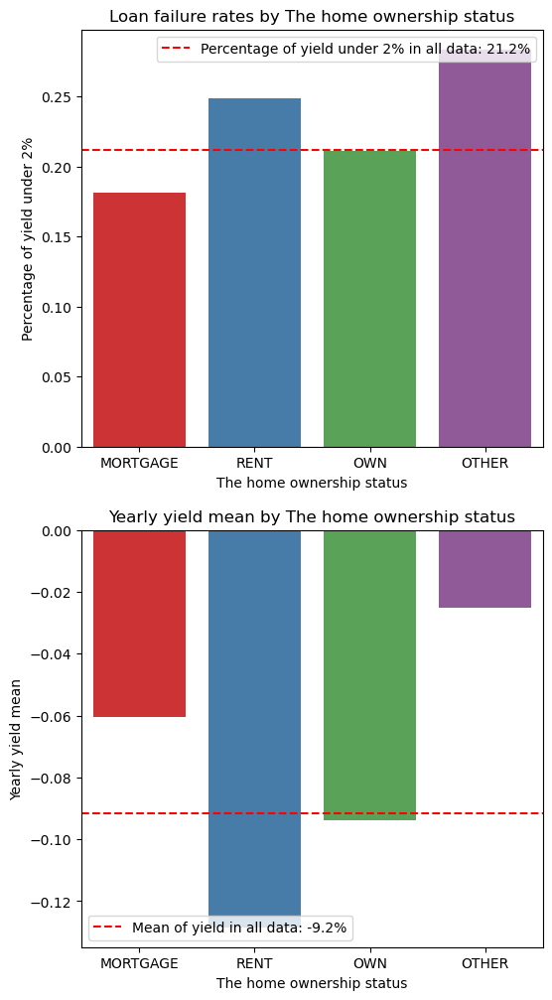

,home_ownership,Count,normalize count,yield over percentages,yearly yield mean
0,MORTGAGE,157645,0.480420,0.181357,-0.060603
1,RENT,129996,0.396160,0.248492,-0.128436
2,OWN,40432,0.123216,0.210823,-0.093864
3,OTHER,67,0.000204,0.283582,-0.025055


In [108]:
plot_yield_graphs('home_ownership','The home ownership status')
yield_percentages('home_ownership')

In [109]:
data['Is_MORTGAGE'] = np.where(data['home_ownership']=='MORTGAGE', 1 , 0)
data['Is_RENT'] = np.where(data['home_ownership']=='RENT', 1 , 0)
data.drop('home_ownership', axis=1, inplace=True)

**purpose**
<br>

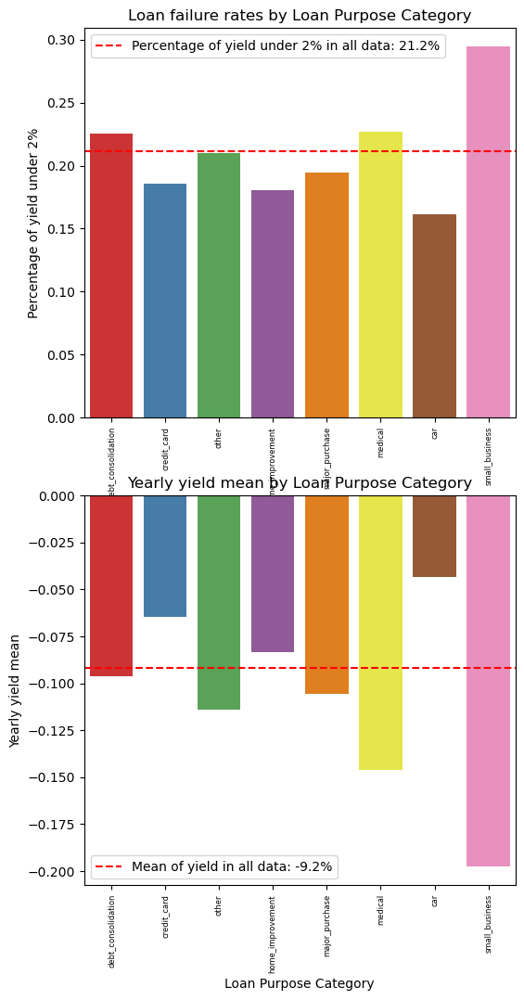

In [110]:
col='purpose'
title="Loan Purpose Category"

df = yield_percentages(col)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])

axes[0].set_xlabel(title)
axes[0].set_ylabel('Percentage of yield under 2%')
axes[0].set_title(f'Loan failure rates by {title}')
pop_mean = 1 - data['yield_over'].mean()
axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
axes[0].tick_params(axis='x', labelrotation=90, labelsize=6)

sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
axes[1].set_xlabel(title)
axes[1].set_ylabel('Yearly yield mean')
axes[1].set_title(f'Yearly yield mean by {title}')
pop_mean = data['yield_yearly_1'].mean()
axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
axes[1].tick_params(axis='x', labelrotation=90, labelsize=6)

axes[0].legend()
axes[1].legend()

plt.show()


In [111]:
loo = ce.LeaveOneOutEncoder(cols=['purpose'])
data['purpose_yield_over_encoded'] = loo.fit_transform(data['purpose'], data['yield_over'])

data['purpose_yield_yearly_encoded'] = loo.fit_transform(data['purpose'], data['yield_yearly_1'])


data.drop('purpose', axis=1, inplace=True)

**inq_last_6mths**
<br>
"inq_last_6mths" represents the number of inquiries made on a borrower's credit report in the past 6 months, excluding inquiries related to auto and mortgage loans. This variable is relevant for predicting loan defaults because a high number of inquiries may indicate that the borrower has recently applied for multiple loans, which could be a sign of financial distress or over-extension. While a high number of inquiries generally lead to higher default rates, for certain cases with high inquiries, they do not represent a large percentage of the data. Therefore, Since 0 has a relatively low failure rate, 1 percent has an average failure rate and >1 percent has a relatively high failure rate we convert this to categorical variable - 0,1,>1.

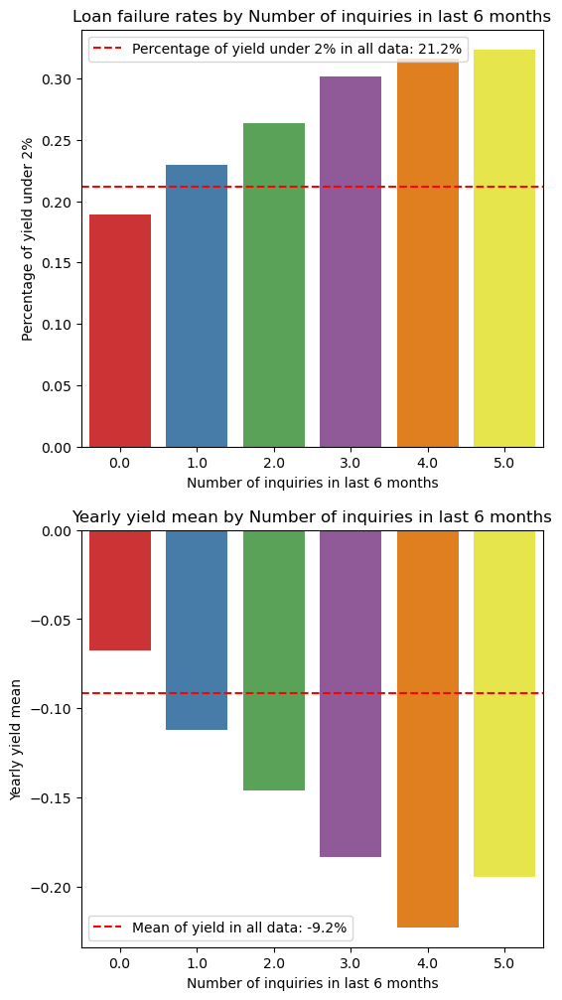

,inq_last_6mths,Count,normalize count,yield over percentages,yearly yield mean
0,0.0,198312,0.604352,0.189489,-0.067544
1,1.0,87242,0.265868,0.229717,-0.112101
2,2.0,28679,0.087399,0.263398,-0.146014
3,3.0,9778,0.029798,0.301698,-0.183453
4,4.0,3091,0.009420,0.316079,-0.222846
5,5.0,1038,0.003163,0.323699,-0.194509


In [112]:
plot_yield_graphs('inq_last_6mths','Number of inquiries in last 6 months')
yield_percentages('inq_last_6mths')

In [113]:
data['inq_last_6mths_cat'] = pd.cut(data['inq_last_6mths'], bins=[-1, 0, 1, np.inf], labels=['No recent inquiries', 'Low recent inquiries', 'High recent inquiries'])
data['inq_last_6mths_cat'] = data['inq_last_6mths_cat'].replace({'No recent inquiries': 1, 'Low recent inquiries': 2, 'High recent inquiries': 3})


**initial_list_status**
<br>

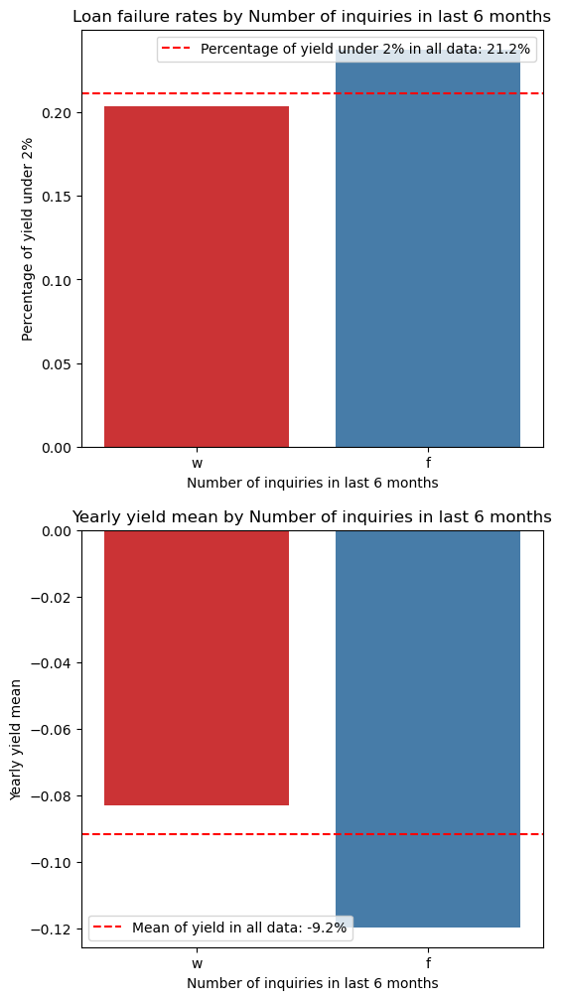

,initial_list_status,Count,normalize count,yield over percentages,yearly yield mean
0,w,251510,0.766472,0.203634,-0.082978
1,f,76630,0.233528,0.237766,-0.119757


In [114]:
plot_yield_graphs('initial_list_status','Number of inquiries in last 6 months')
yield_percentages('initial_list_status')

**inq_last_12m**
<br>
We want to capture the change in credit-seeking behavior of the borrower. If the difference is positive, it suggests an increase in credit-seeking behavior, which may be indicative of financial instability. Conversely, a negative difference could suggest a decrease in credit-seeking behavior, which may be indicative of greater financial stability. This new feature could potentially improve the model's ability to predict loan default risk.

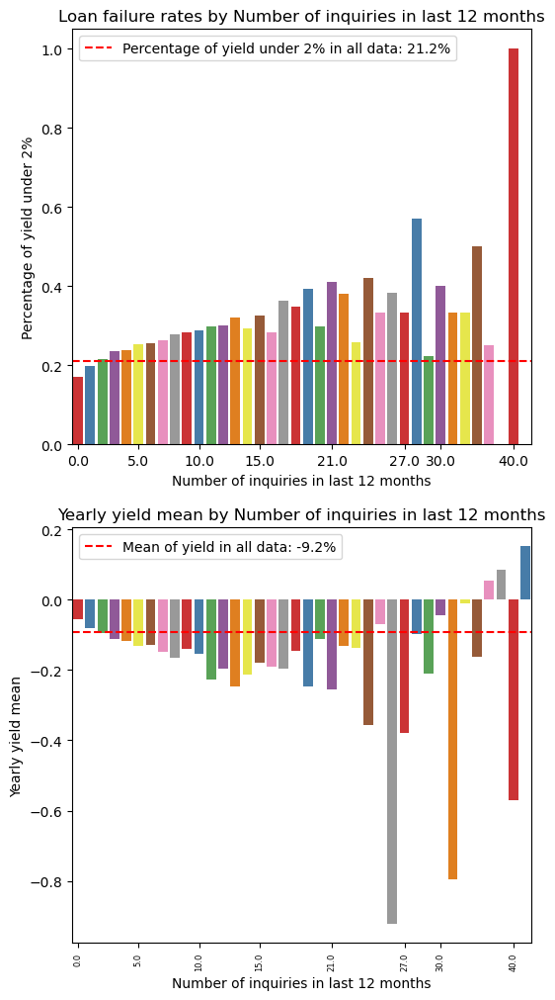

In [115]:
col='inq_last_12m'
title="Number of inquiries in last 12 months"

df = yield_percentages(col)

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(6,12))
sns.barplot(x=col, y='yield over percentages', data=df, palette='Set1', ax=axes[0])

axes[0].set_xlabel(title)
axes[0].set_ylabel('Percentage of yield under 2%')
axes[0].set_title(f'Loan failure rates by {title}')
pop_mean = 1 - data['yield_over'].mean()
axes[0].axhline(pop_mean, color='red', linestyle='--', label=f'Percentage of yield under 2% in all data: {pop_mean*100:.1f}%')
axes[0].set_xticks(df['inq_last_12m'][::5])


sns.barplot(x=col, y='yearly yield mean', data=df, palette='Set1', ax=axes[1])
axes[1].set_xlabel(title)
axes[1].set_ylabel('Yearly yield mean')
axes[1].set_title(f'Yearly yield mean by {title}')
pop_mean = data['yield_yearly_1'].mean()
axes[1].axhline(pop_mean, color='red', linestyle='--', label=f'Mean of yield in all data: {pop_mean*100:.1f}%')
axes[1].tick_params(axis='x', labelrotation=90, labelsize=6)
axes[1].set_xticks(df['inq_last_12m'][::5])

axes[0].legend()
axes[1].legend()

plt.show()


In [116]:
yield_percentages('inq_last_12m')

,inq_last_12m,Count,normalize count,yield over percentages,yearly yield mean
0,0.0,83033,0.253041,0.171233,-0.054355
1,1.0,77442,0.236003,0.198820,-0.079786
2,2.0,57152,0.174170,0.214901,-0.093127
3,3.0,38878,0.118480,0.234811,-0.111966
4,4.0,25240,0.076918,0.239422,-0.116049
5,5.0,16006,0.048778,0.252905,-0.131306
6,6.0,10265,0.031282,0.256308,-0.128636
7,7.0,6588,0.020077,0.264117,-0.148348
8,8.0,4356,0.013275,0.277319,-0.164911
9,9.0,2867,0.008737,0.284269,-0.138592


In [117]:
data['recent_inquiry_difference']=data['inq_last_12m']-data['inq_last_6mths']

In [118]:
data.drop('inq_last_6mths', axis=1, inplace=True)
data.drop('inq_last_12m', axis=1, inplace=True)

**mo_sin_rcnt_rev_tl_op and mo_sin_rcnt_tl**
<br>
We discovered that the correlation between the columns "mo_sin_rcnt_rev_tl_op" and "mo_sin_rcnt_tl"  is 0.61- Thus, we created a new feature called "revolving_account_opened_ratio" by dividing "mo_sin_rcnt_rev_tl_op" by "mo_sin_rcnt_tl", aiming to capture the ratio of months since the most recent revolving account opened to months since the most recent account opened. The resulting feature may provide additional information about a borrower's credit behavior, which can be useful in predicting their ability to repay a loan.

In [119]:
print("The corration between mo_sin_rcnt_rev_tl_op and mo_sin_rcnt_tl is:", data[['mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl']].corr()['mo_sin_rcnt_rev_tl_op'][1]
     )
       

The corration between mo_sin_rcnt_rev_tl_op and mo_sin_rcnt_tl is: 0.6089527079343466


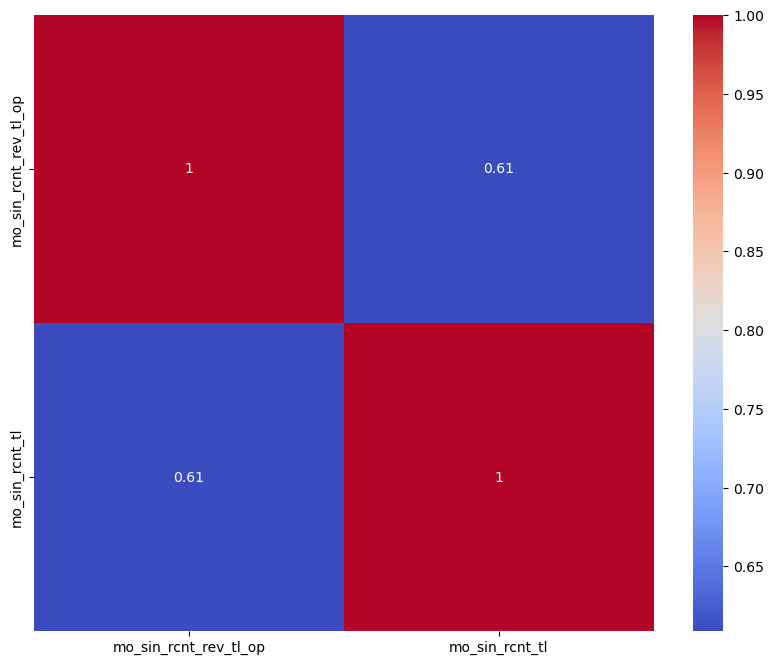

In [120]:
corr_subset=data[['mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl']].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_subset, cmap='coolwarm', annot=True)
plt.show()

In [121]:
yield_percentages('mo_sin_rcnt_rev_tl_op')

,mo_sin_rcnt_rev_tl_op,Count,normalize count,yield over percentages,yearly yield mean
0,2,27568,0.084013,0.240932,-0.110268
1,3,27214,0.082934,0.230286,-0.107532
2,4,24021,0.073204,0.224345,-0.100201
3,1,21732,0.066228,0.255016,-0.135660
4,5,21287,0.064872,0.220228,-0.087035
...,...,...,...,...,...
231,185,1,0.000003,0.000000,0.039058
232,219,1,0.000003,1.000000,-5.235301
233,438,1,0.000003,0.000000,0.064591
234,207,1,0.000003,0.000000,0.044740


In [122]:
yield_percentages('mo_sin_rcnt_tl')

,mo_sin_rcnt_tl,Count,normalize count,yield over percentages,yearly yield mean
0,2,38040,0.115926,0.242692,-0.118892
1,3,37855,0.115362,0.232994,-0.116181
2,4,32813,0.099997,0.220583,-0.097406
3,1,28206,0.085957,0.254166,-0.138377
4,5,27954,0.085189,0.215032,-0.088527
...,...,...,...,...,...
159,151,1,0.000003,1.000000,-0.284050
160,233,1,0.000003,1.000000,-0.927953
161,283,1,0.000003,0.000000,0.074422
162,174,1,0.000003,0.000000,0.048019


In [137]:
tb['mo_sin_rcnt_tl'] = data['mo_sin_rcnt_tl'].values

In [144]:
tb['revolving_account_opened_ratio']=(tb['mo_sin_rcnt_rev_tl_op']/tb['mo_sin_rcnt_tl']).fillna(0)

In [134]:
tb = pd.DataFrame()


In [146]:
tb[np.isinf(tb['revolving_account_opened_ratio'])]

,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,revolving_account_opened_ratio
592,8,0,inf
929,4,0,inf
1502,13,0,inf
3879,51,0,inf
6119,24,0,inf
...,...,...,...
314055,13,0,inf
321329,2,0,inf
322683,4,0,inf
327357,10,0,inf


In [266]:
data['revolving_account_opened_ratio']=data['mo_sin_rcnt_rev_tl_op']-data['mo_sin_rcnt_tl']
data.drop('mo_sin_rcnt_rev_tl_op', axis=1, inplace=True)
data.drop('mo_sin_rcnt_tl', axis=1, inplace=True)

In [267]:
print(data.columns)

Index(['id', 'loan_amnt', 'term', 'int_rate', 'installment', 'emp_length',
       'annual_inc', 'issue_d', 'dti', 'delinq_2yrs', 'fico_range_low',
       'fico_range_high', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util',
       'total_acc', 'initial_list_status', 'tot_coll_amt', 'tot_cur_bal',
       'open_acc_6m', 'open_act_il', 'open_il_12m', 'open_il_24m',
       'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m', 'max_bal_bc',
       'all_util', 'total_rev_hi_lim', 'inq_fi', 'total_cu_tl',
       'acc_open_past_24mths', 'avg_cur_bal', 'mo_sin_old_rev_tl_op',
       'mort_acc', 'mths_since_recent_inq', 'num_accts_ever_120_pd',
       'num_actv_bc_tl', 'num_actv_rev_tl', 'num_bc_sats', 'num_bc_tl',
       'num_il_tl', 'num_op_rev_tl', 'num_rev_accts', 'num_rev_tl_bal_gt_0',
       'num_sats', 'num_tl_op_past_12m', 'pct_tl_nvr_dlq', 'tot_hi_cred_lim',
       'total_bal_ex_mort', 'total_bc_limit', 'total_il_high_credit_limit',
       'yield_2', 'yield_yearly_1', 'is_default?', '

### More Graphs

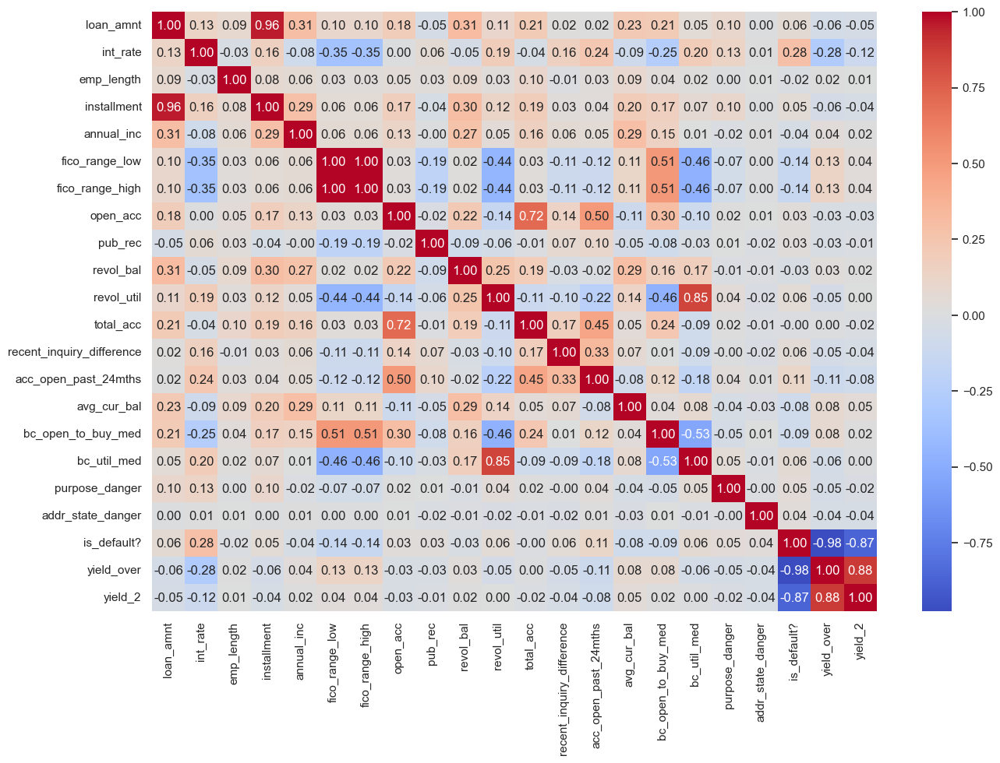

In [268]:
warnings.filterwarnings("ignore", category=DeprecationWarning)

new_cols = ['loan_amnt','int_rate','emp_length','installment','annual_inc',
            'fico_range_low', 'fico_range_high','open_acc', 'pub_rec','revol_bal', 'revol_util', 'total_acc',
            'recent_inquiry_difference', 'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy_med', 'bc_util_med',
            'purpose_danger', 'addr_state_danger','is_default?','yield_over','yield_2']

merged_df = data[new_cols]


corr_matrix = merged_df.corr()
sns.set(rc={'figure.figsize':(15,10)})
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.show()

### Correlation between continuous features

In [269]:
"""
Finding continuous features
"""
unique_counts = data.nunique().sort_values(ascending=False)

print("Column Name\tUnique Values")
for column, count in unique_counts.iteritems():
    print(f"{column}\t\t{count}")


Column Name	Unique Values
id		328140
purpose_yield_yearly_encoded		317462
yield_yearly_1		315215
yield_2		312955
tot_hi_cred_lim		201345
tot_cur_bal		197853
total_bal_ex_mort		118108
total_il_high_credit_limit		106621
total_bal_il		97850
revol_bal		55581
avg_cur_bal		52915
bc_open_to_buy_mean		48955
bc_open_to_buy_med		48955
installment		37500
max_bal_bc		24961
annual_inc		22136
total_rev_hi_lim		9706
tot_coll_amt		7596
total_bc_limit		4927
dti		4854
Age_of_credit_history		2038
loan_amnt		1503
revol_util		1163
mo_sin_old_rev_tl_op		694
pct_tl_nvr_dlq		556
mo_sin_old_il_acct_med		470
mo_sin_old_il_acct_mean		470
mths_since_recent_bc_med		415
mths_since_recent_bc_mean		415
mths_since_rcnt_il_mean		323
mths_since_rcnt_il_med		323
il_util_med		222
il_util		212
revolving_account_opened_ratio		207
all_util		165
bc_util_mean		163
bc_util_med		163
int_rate		141
total_acc		123
num_il_tl		98
num_rev_accts		93
percent_bc_gt_75_mean		87
percent_bc_gt_75_med		87
open_acc		70
num_sats		69
num_op_rev

In [270]:
'''
making a list of continues features to test with Spearman correlation.
'''

corr_df = data[['yield_yearly_1', 'yield_2', 'tot_hi_cred_lim', 'tot_cur_bal', 'total_bal_ex_mort',
    'total_il_high_credit_limit', 'total_bal_il', 'revol_bal', 'avg_cur_bal', 'bc_open_to_buy_med',
    'bc_open_to_buy_mean', 'installment', 'max_bal_bc', 'annual_inc', 'total_rev_hi_lim',
    'tot_coll_amt', 'total_bc_limit', 'dti', 'revolving_account_opened_ratio', 'Age_of_credit_history',
    'loan_amnt', 'revol_util', 'mo_sin_old_rev_tl_op', 'pct_tl_nvr_dlq', 'mo_sin_old_il_acct_mean',
    'mo_sin_old_il_acct_med', 'mths_since_recent_bc_mean', 'mths_since_recent_bc_med',
    'mths_since_rcnt_il_med', 'mths_since_rcnt_il_mean', 'il_util_med', 'il_util', 'all_util',
    'bc_util_mean', 'bc_util_med', 'int_rate']]

**Spearman correlation Heatmap**

<AxesSubplot:>

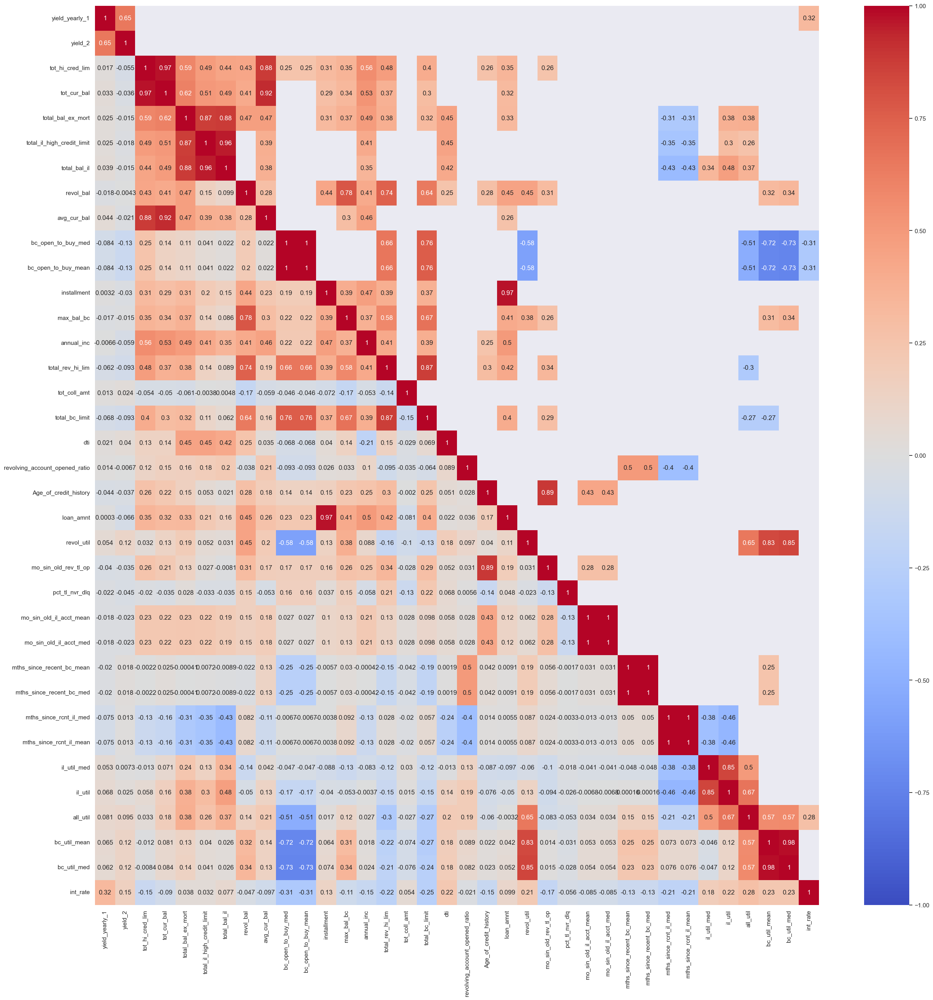

In [271]:
'''
This code calculates the correlation matrix using the Spearman correlation method and visualizes it as a heatmap.
The threshold is set to 0.25, and only correlations below the threshold are shown in the heatmap.
'''

# Calculate correlation matrix
corr_matrix = corr_df.corr(method='spearman')

# Set threshold
threshold = 0.25
plt.figure(figsize=(30, 30))
# Generate mask to only show values below the threshold
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
mask[np.abs(corr_matrix) >= threshold] = False

# Plot correlation matrix
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

**Relationship between installment and loan_amnt**

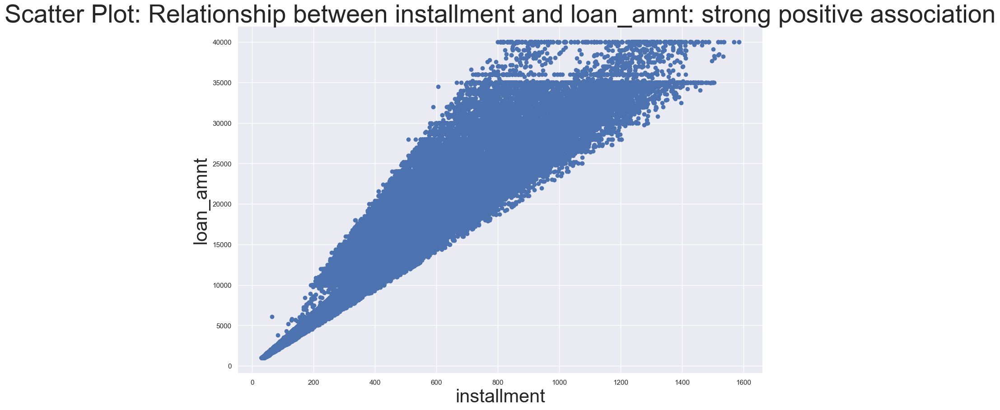

In [272]:
# Scatter plot
plt.scatter(data['installment'], data['loan_amnt'])

plt.xlabel('installment', fontsize=30)
plt.ylabel('loan_amnt', fontsize=30)
plt.title('Scatter Plot: Relationship between installment and loan_amnt: strong positive association', fontsize=40)
plt.show()


In [273]:
data.drop('installment', axis=1, inplace=True)

**Relationship between "tot_hi_cred_lim" and "tot_cur_bal"**

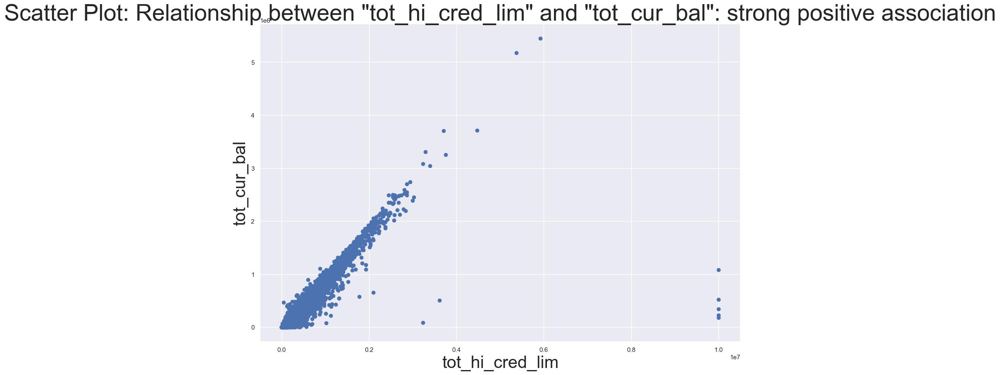

In [274]:
# Scatter plot
plt.scatter(data['tot_hi_cred_lim'], data['tot_cur_bal'])

plt.xlabel('tot_hi_cred_lim', fontsize=30)
plt.ylabel('tot_cur_bal', fontsize=30)
plt.title('Scatter Plot: Relationship between "tot_hi_cred_lim" and "tot_cur_bal": strong positive association', fontsize=40)

plt.show()

In [275]:
data.drop('tot_hi_cred_lim', axis=1, inplace=True)

**Relationship between "bc_util_med" and "revol_util"**

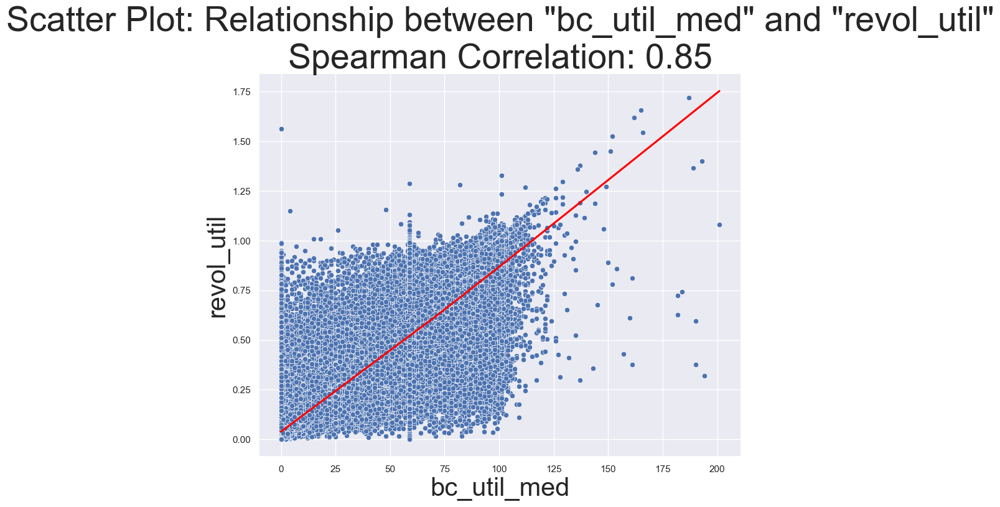

In [276]:
# Calculate Spearman correlation coefficient
corr_coeff, _ = stats.spearmanr(data['bc_util_med'], data['revol_util'])

# Create scatter plot with loess line
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='bc_util_med', y='revol_util')
sns.regplot(data=data, x='bc_util_med', y='revol_util', lowess=True, scatter=False, color='red')

# Set labels and title
plt.xlabel('bc_util_med', fontsize=30)
plt.ylabel('revol_util', fontsize=30)
plt.title(f'Scatter Plot: Relationship between "bc_util_med" and "revol_util"\nSpearman Correlation: {corr_coeff:.2f}', fontsize=40)

plt.show()

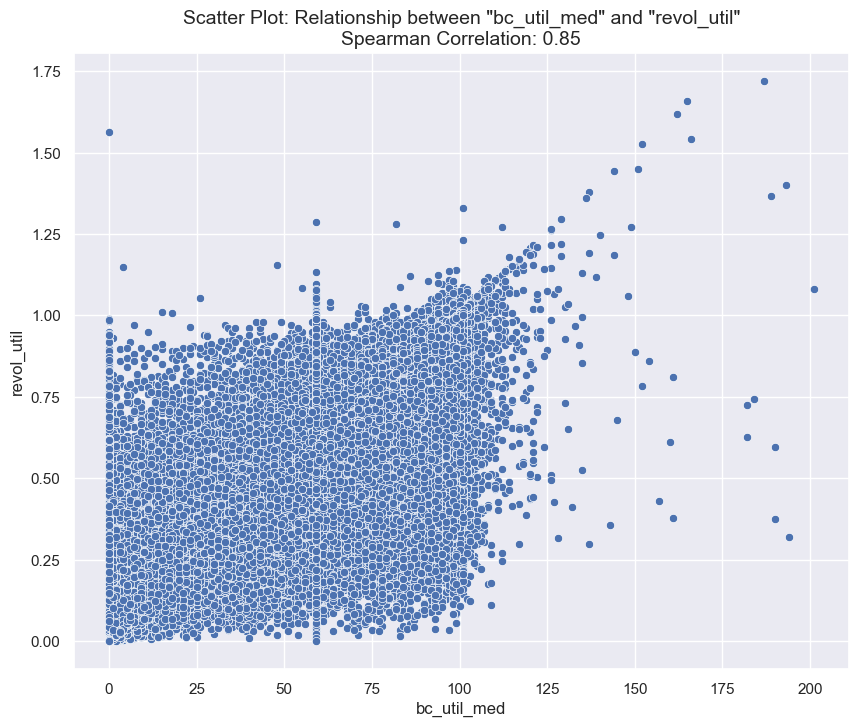

In [277]:
# Calculate Spearman correlation coefficient
corr_coeff, _ = stats.spearmanr(data['bc_util_med'], data['revol_util'])

# Create scatter plot
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='bc_util_med', y='revol_util')

# Set labels and title
plt.xlabel('bc_util_med', fontsize=12)
plt.ylabel('revol_util', fontsize=12)
plt.title(f'Scatter Plot: Relationship between "bc_util_med" and "revol_util"\nSpearman Correlation: {corr_coeff:.2f}', fontsize=14)

plt.show()


In [278]:
    #Create a Credit_Utilization_Score feature that represents the combined credit utilization across bankcard accounts.
    
    # Calculate the ratio of total current balance to high credit/credit limit for all bankcard accounts
    bankcard_ratio = data['bc_util_med']
    
    # Calculate the revolving line utilization rate
    revolving_utilization = data['revol_util']
    
    # Calculate the combined feature (average of the two ratios)
    credit_utilization_score = (bankcard_ratio + revolving_utilization) / 2
    
    # Normalize the combined feature (optional)
    normalized_score = (credit_utilization_score - credit_utilization_score.min()) / (credit_utilization_score.max() - credit_utilization_score.min())
    
    # Add the Credit_Utilization_Score feature to the DataFrame
    data['credit_Utilization_Score'] = normalized_score
    data.drop('bc_util_med', axis=1, inplace=True)
    data.drop('revol_util', axis=1, inplace=True)

In [279]:
# Assuming you have a DataFrame named 'data' and the target feature is 'target'
correlation_threshold = 0.2  # Define the correlation threshold below which features will be eliminated

# Calculate the correlation between each feature and the target
correlations = data.corr()['yield_over'].abs()

correlations

id                                0.052532
loan_amnt                         0.063617
term                              0.180580
int_rate                          0.275379
emp_length                        0.015619
                                    ...   
purpose_yield_over_encoded        0.050316
purpose_yield_yearly_encoded      0.039078
recent_inquiry_difference         0.054620
revolving_account_opened_ratio    0.034959
credit_Utilization_Score          0.058294
Name: yield_over, Length: 79, dtype: float64

Cheking the distribution for each numeric feature and Detect and handle outliers

In [280]:
"""
This code calculates the percentage of missing values for each column in the dataset and returns 
a sorted list of columns that have missing values higher than 0%, along with their corresponding 
percentage of missing values. The resulting dictionary is printed in descending order of NaN percentages.
"""

na_percent = {}

# Loop through the columns in data dataframe
for column in data.columns:
    if column == 'id':
        continue
    na_count = data[column].isna().sum()
    na_percent[column] = (na_count / len(data)) * 100

# Filter columns with NaN percentage higher than 0%
na_percent_above_0 = {column: na_percent for column, na_percent in na_percent.items() if na_percent > 0}

# Sort the dictionary by NaN percentages in descending order
sorted_na_percent_above_0 = {column: na_percent for column, na_percent in sorted(na_percent_above_0.items(), key=lambda x: x[1], reverse=True)}

# Print the sorted list of column names and NaN percentages
print("Columns with NaN percentage higher than 0% (sorted):")
for column, na_percent in sorted_na_percent_above_0.items():
    print(f"{column}: {na_percent:.2f}% NaN Percent")


Columns with NaN percentage higher than 0% (sorted):


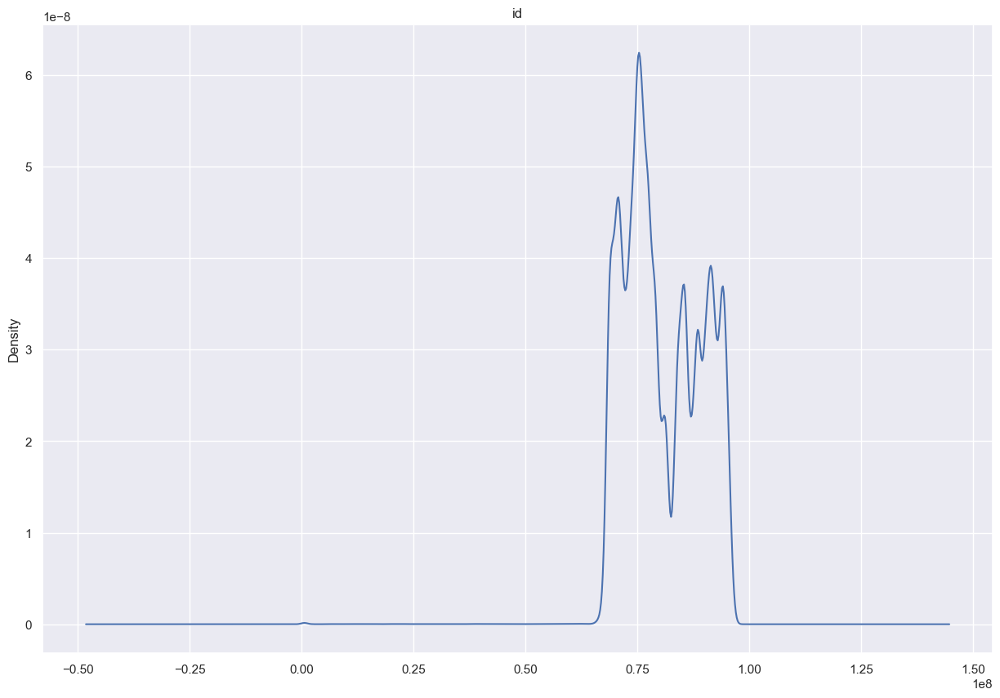

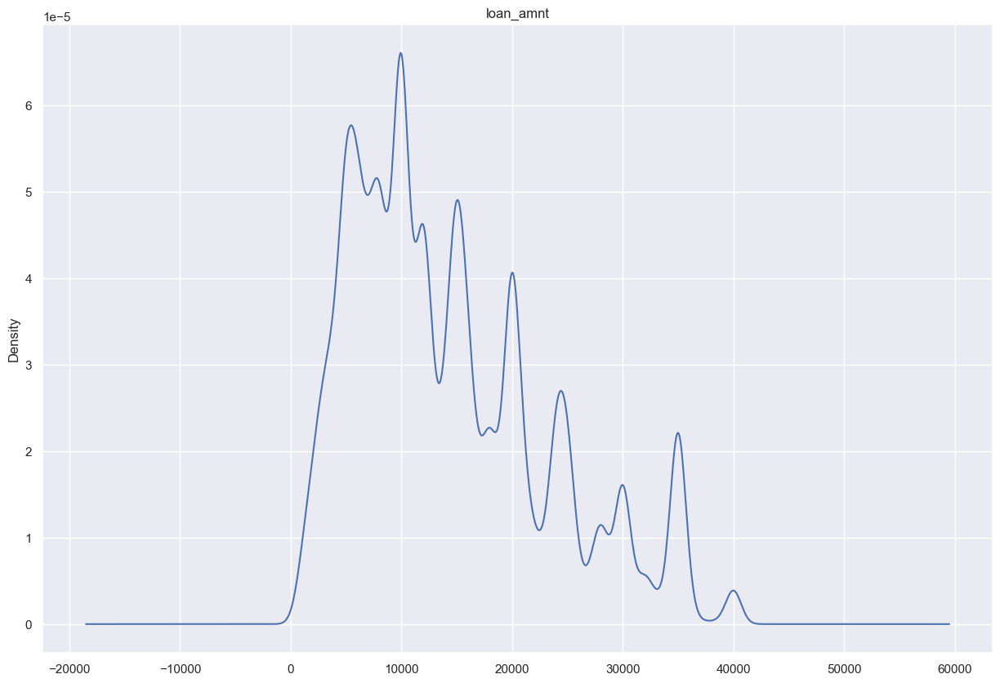

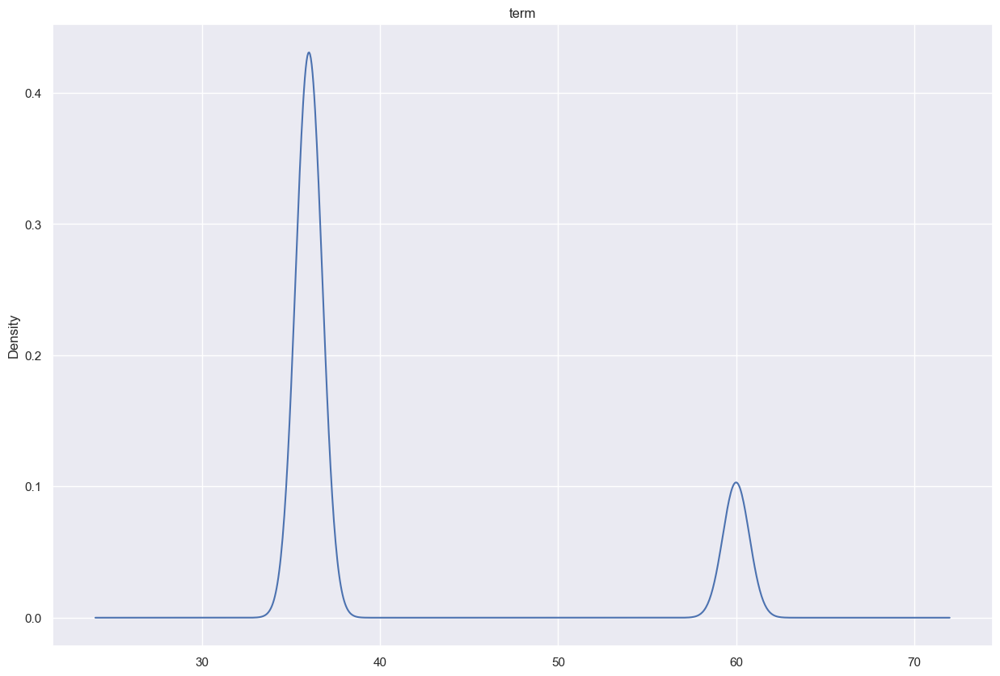

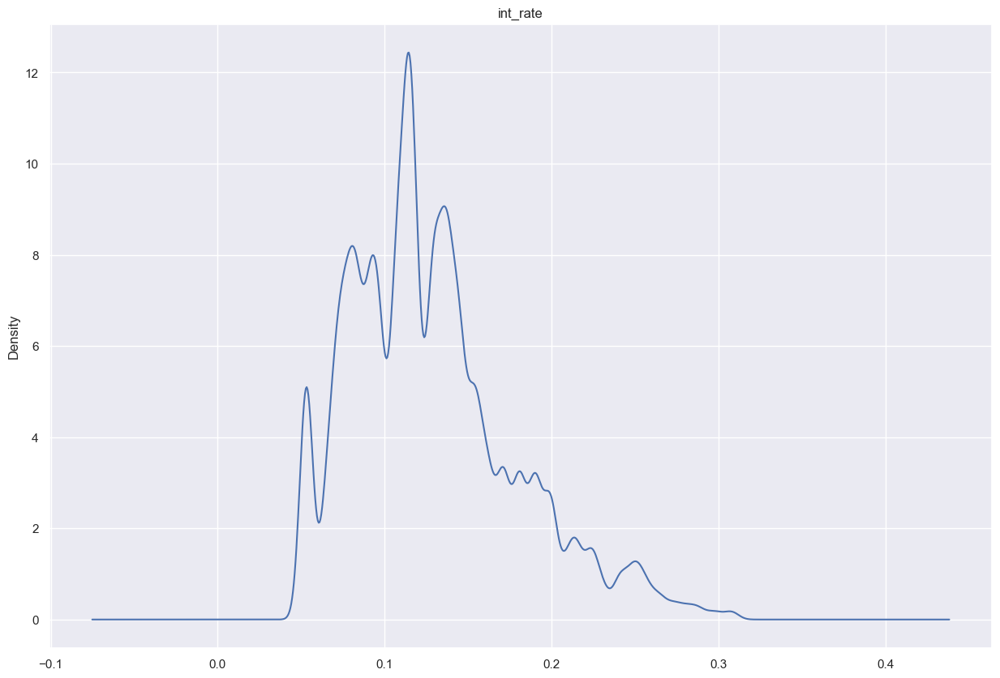

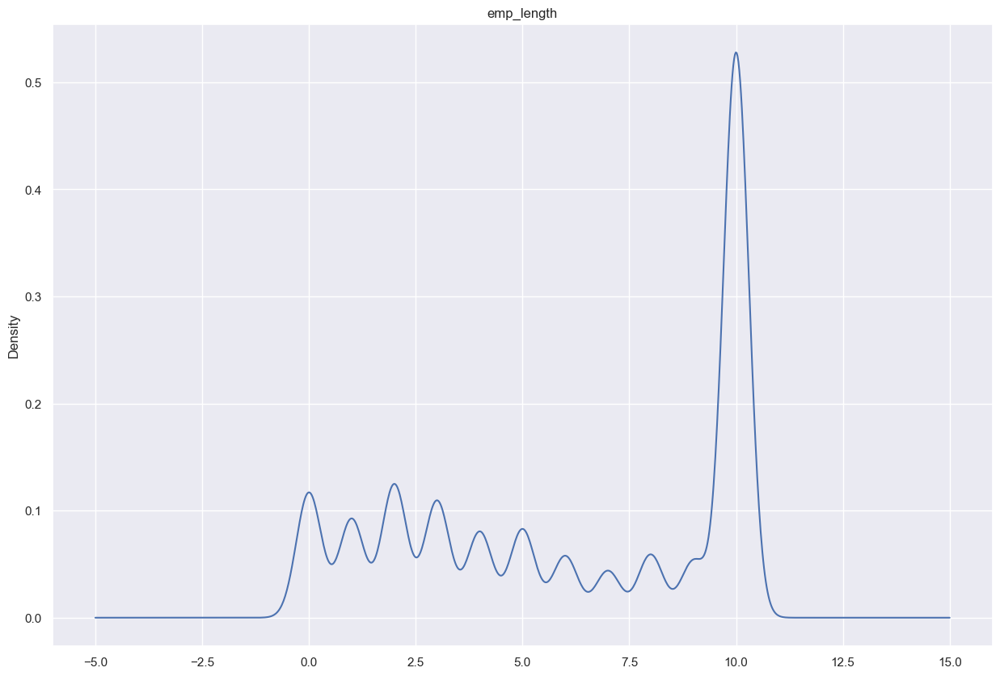

...

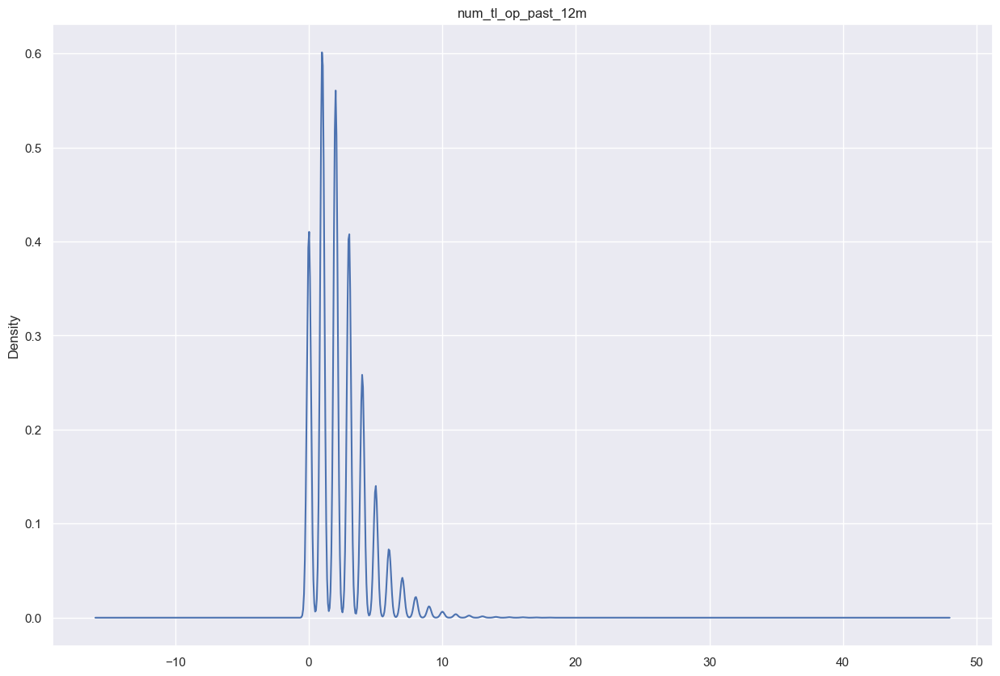

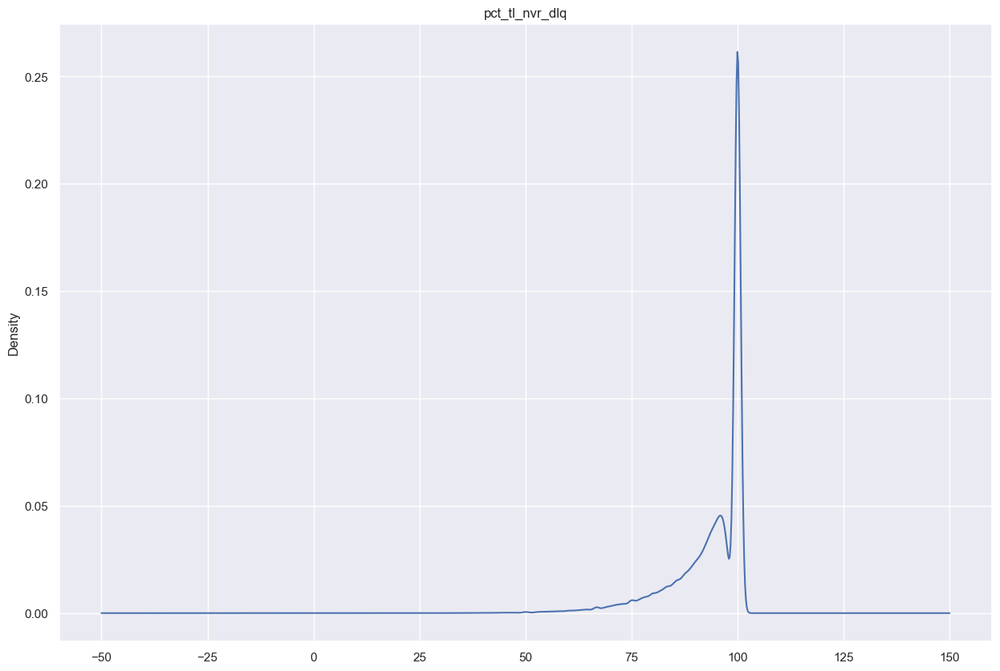

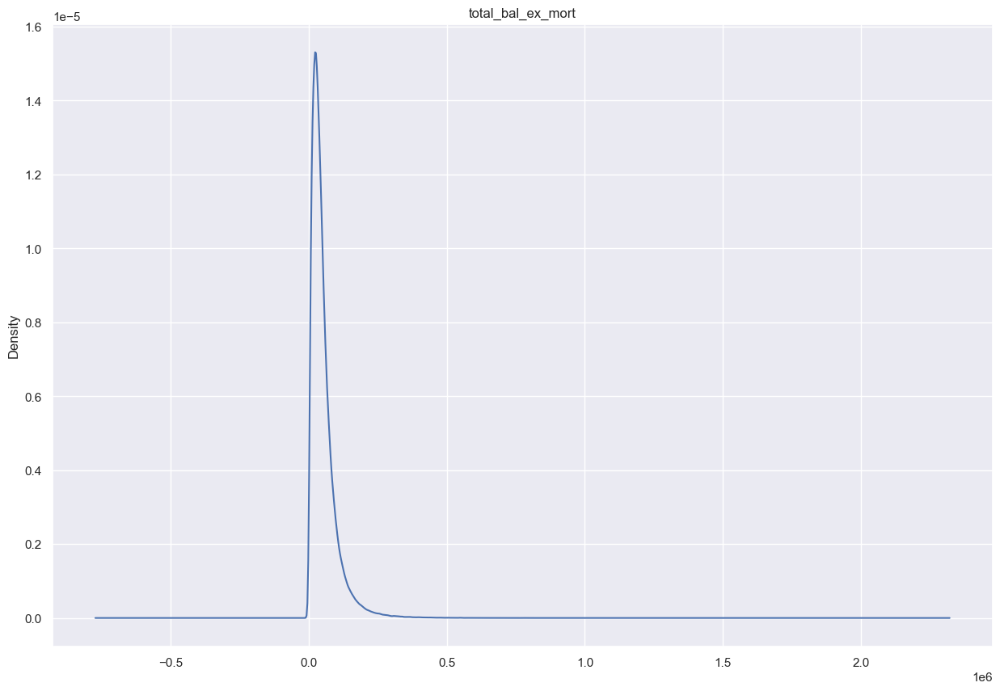

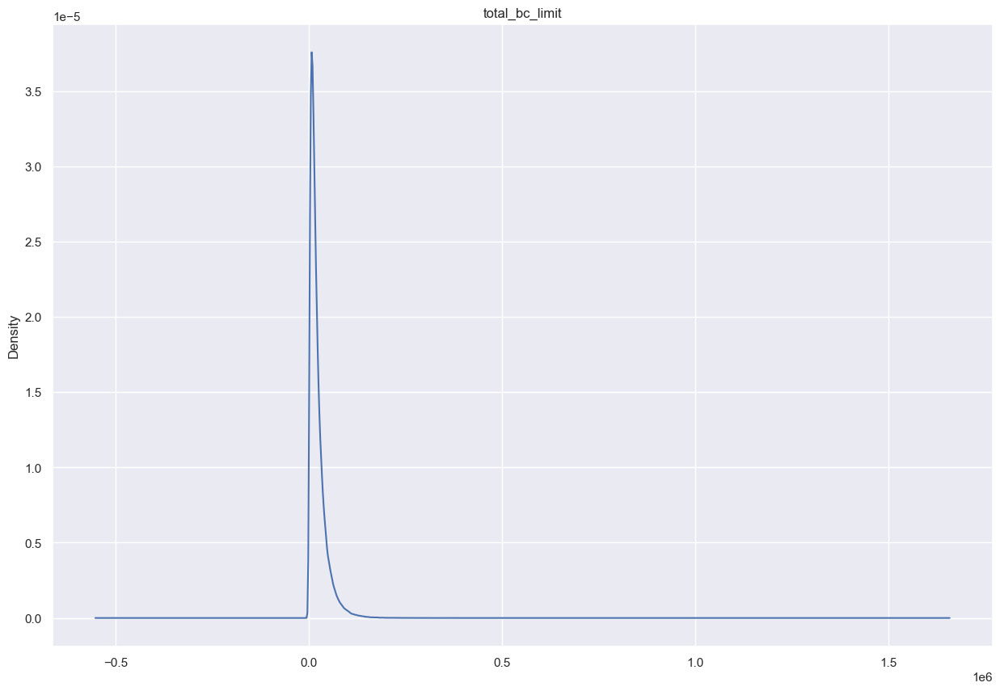

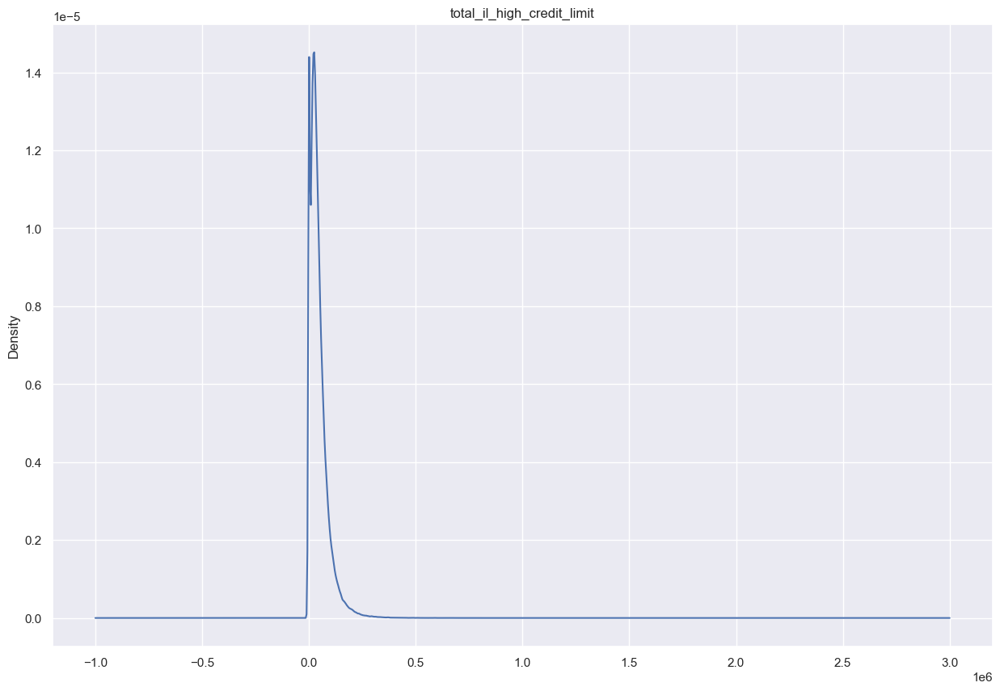

/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/core/function_base.py:151: RuntimeWarning: invalid value encountered in multiply
  y *= step
/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/core/function_base.py:161: RuntimeWarning: invalid value encountered in add
  y += start
/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:2536: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


ValueError: array must not contain infs or NaNs

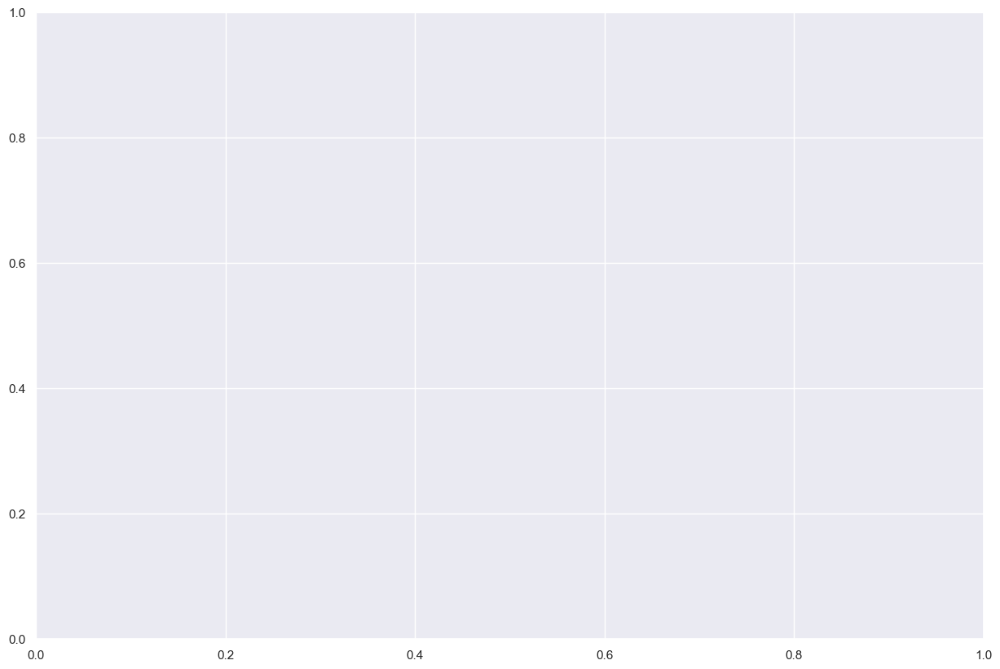

In [281]:
def plot_density_graphs(data):
    """
    Plot the density graph for all numeric columns in a Pandas DataFrame.

    Parameters:
    data (Pandas DataFrame): The dataset to be plotted.

    Returns:
    None
    """
num_cols = data.select_dtypes(include=['int64', 'float64']).columns
for col in num_cols:
    data[col].plot(kind='density')
    plt.title(col)
    plt.show()

In [282]:
def plot_qq_plots(dataframe):
    """
    Plot normal Q-Q plots for all numeric columns in a Pandas DataFrame.

    Parameters:
    dataframe (Pandas DataFrame): The DataFrame to plot the Q-Q plots for.

    Returns:
    None

    """
    num_cols = dataframe.select_dtypes(include=['int64', 'float64']).columns
    for col in num_cols:
        # Create a Q-Q plot
        fig, ax = plt.subplots()
        stats.probplot(dataframe[col], dist="norm", plot=ax)
        ax.set_title(f"Normal Q-Q plot for {col}")
        
        # Adjust figure size
        fig.set_size_inches(8, 6)
        
        # Adjust subplot spacing
        plt.tight_layout()

        # Show the plot
        plt.show()


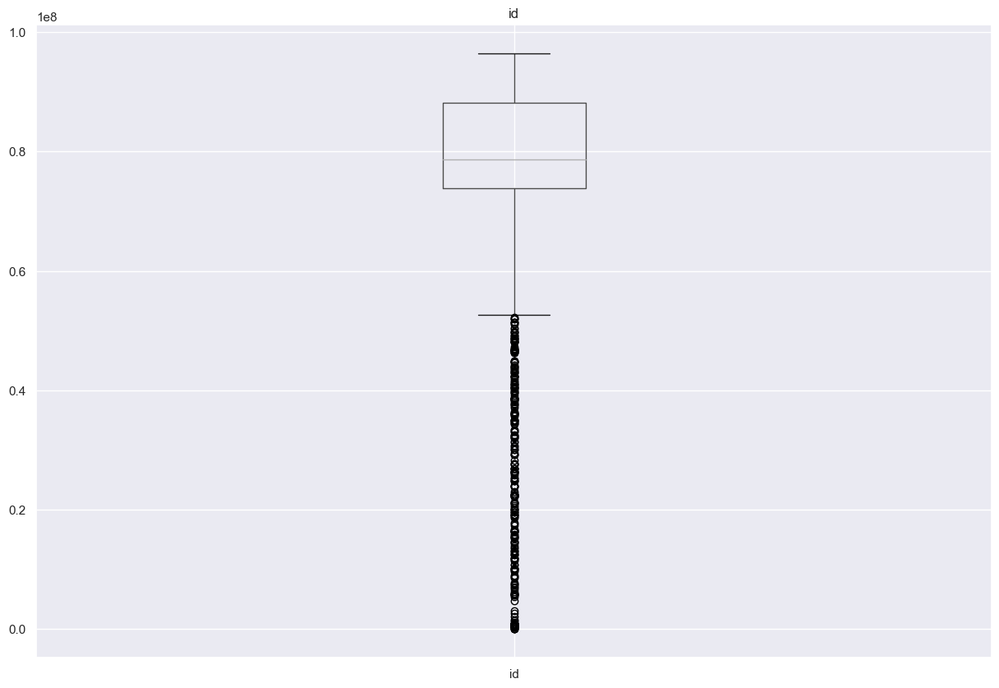

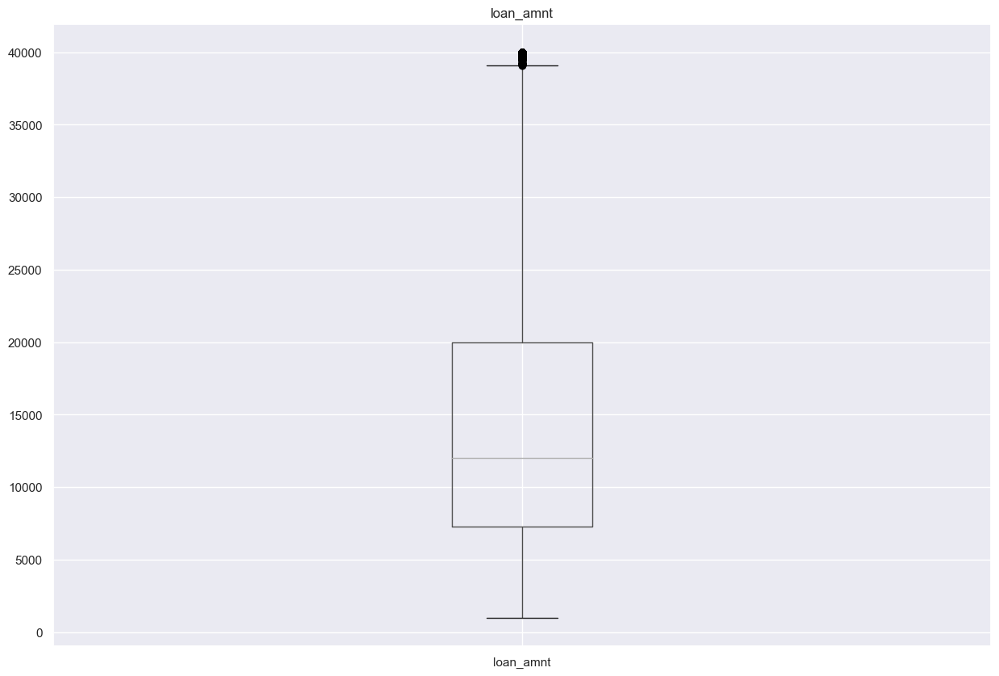

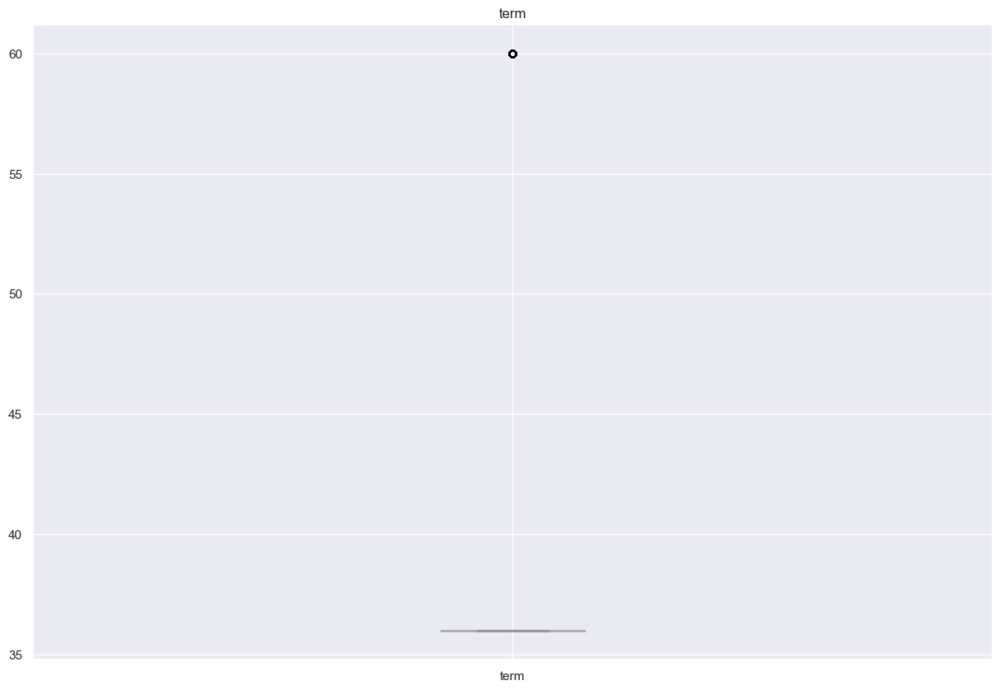

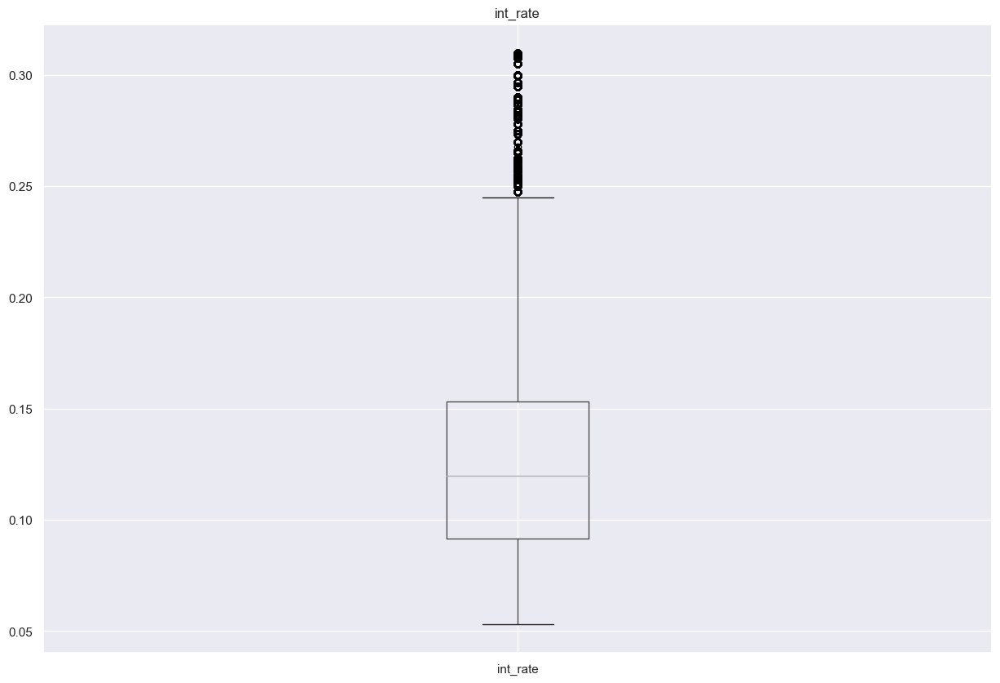

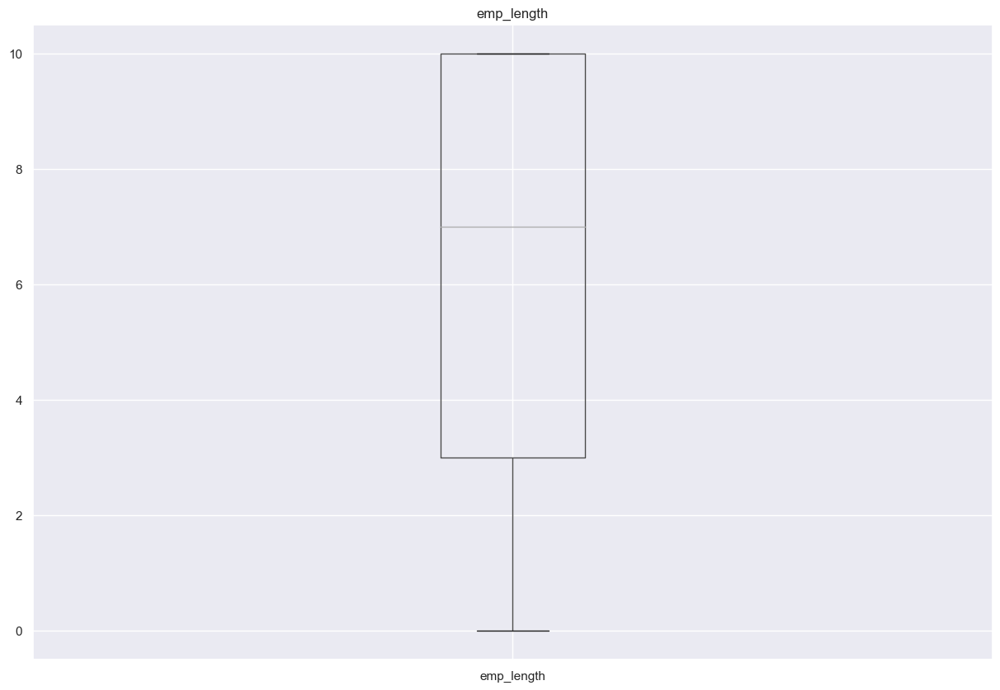

...

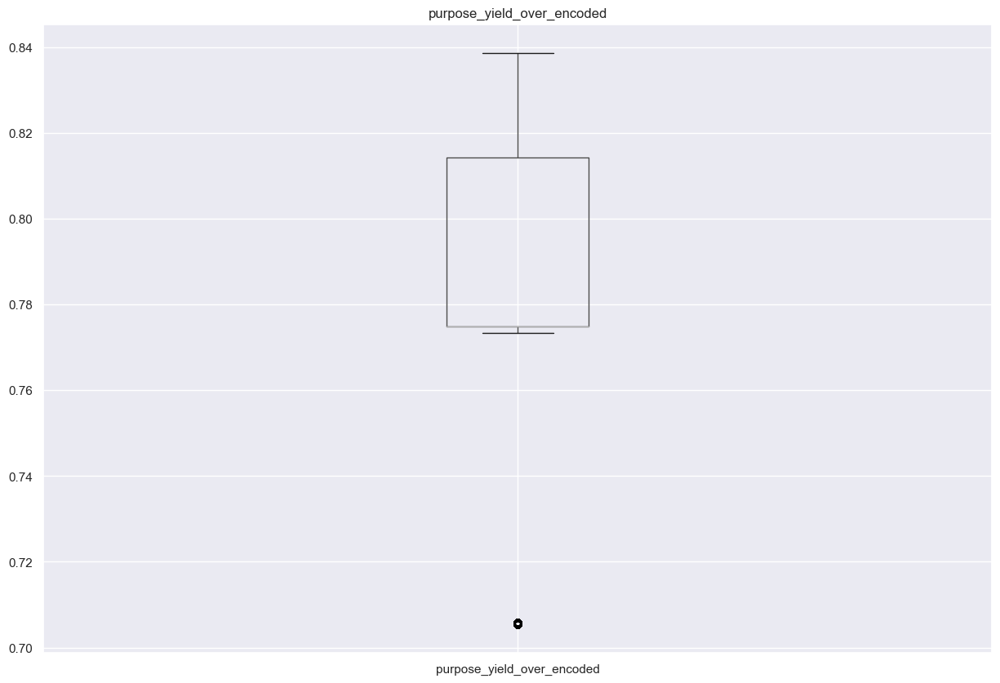

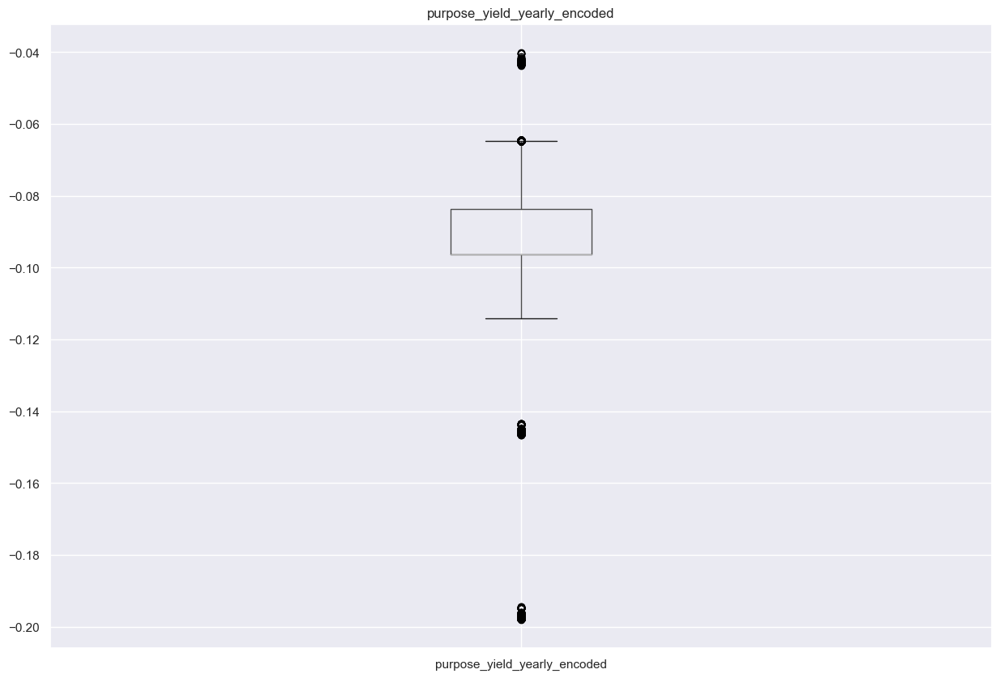

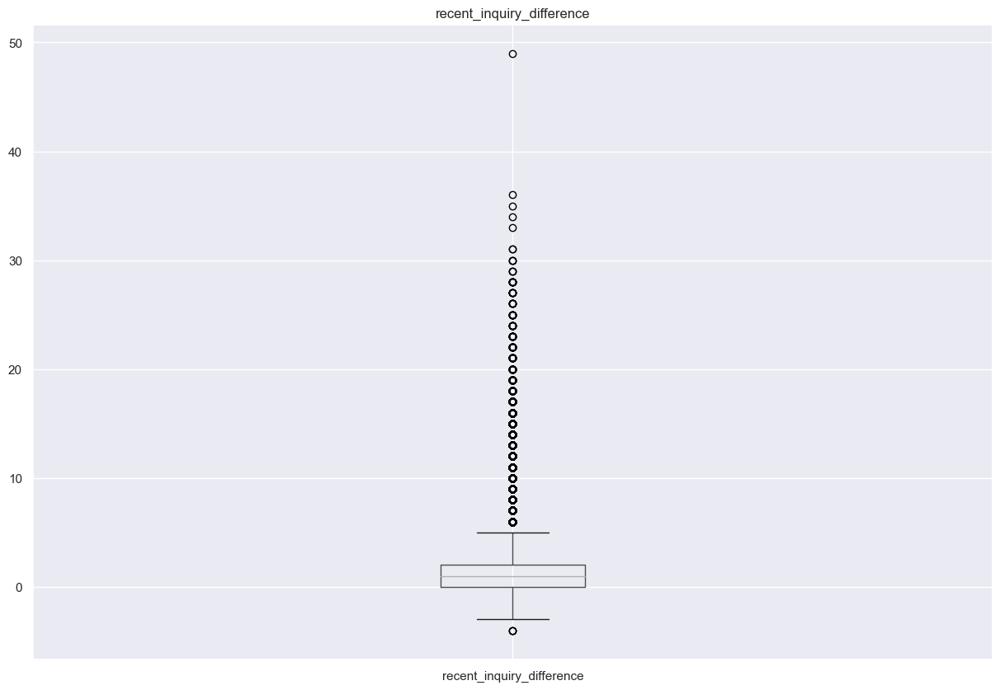

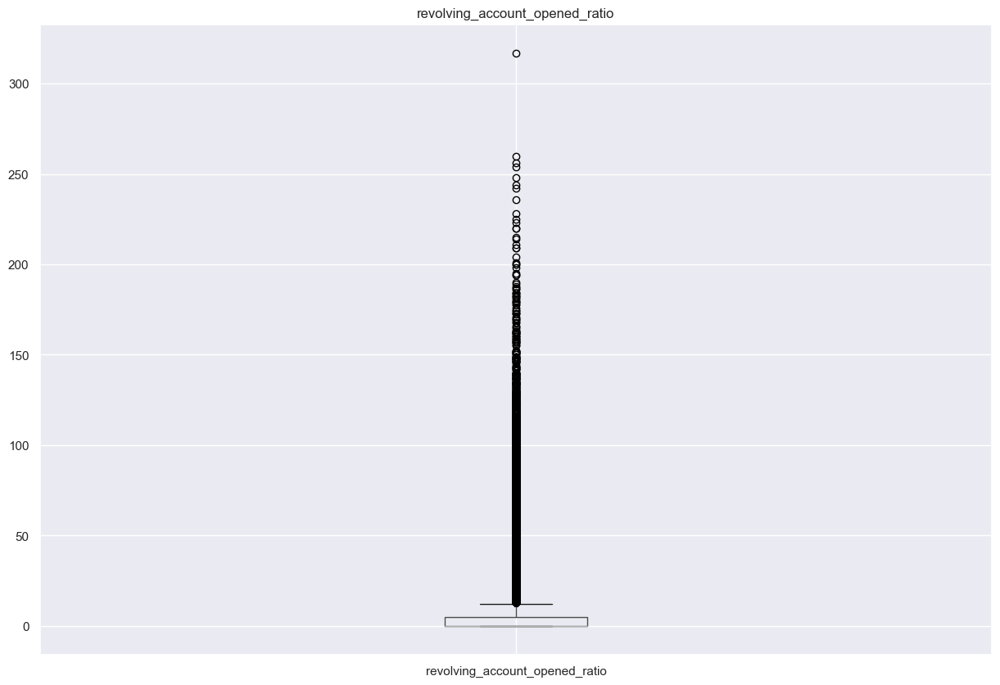

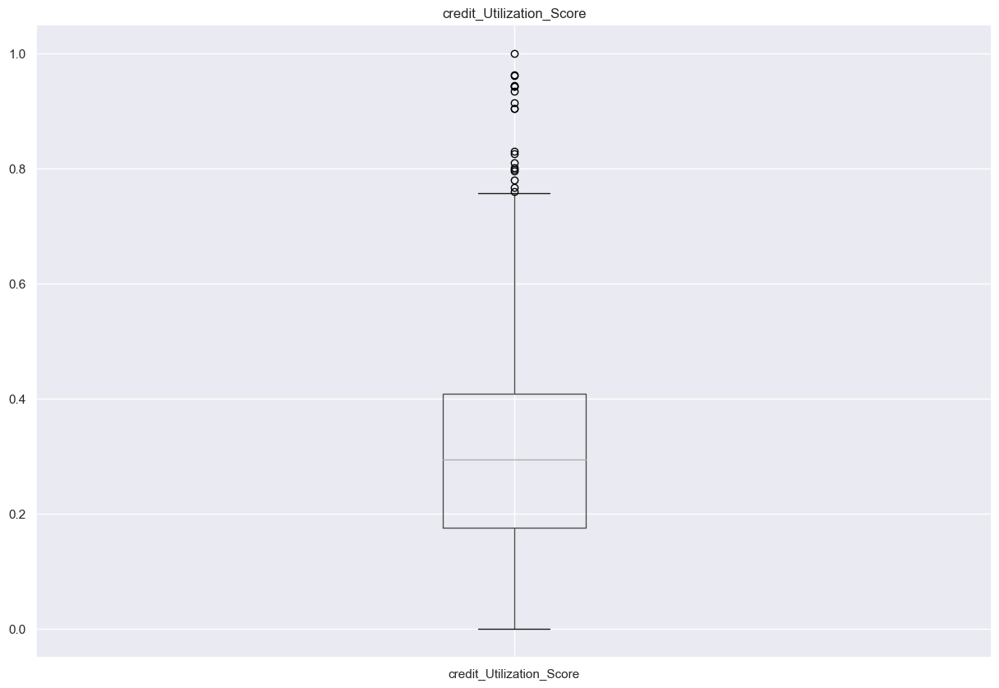

In [283]:
# Assume 'data' is your pandas dataframe

# Select only numerical columns
num_cols = data.select_dtypes(include=['int64', 'float64']).columns

# Create a boxplot for each numerical column
for col in num_cols:
    plt.figure()
    data.boxplot([col])
    plt.title(col)
    plt.show()

In [284]:
plot_density_graphs(data)

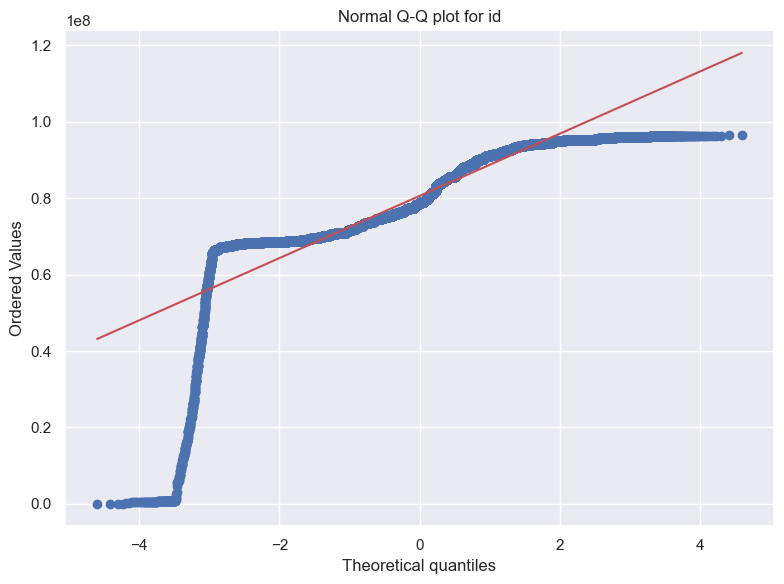

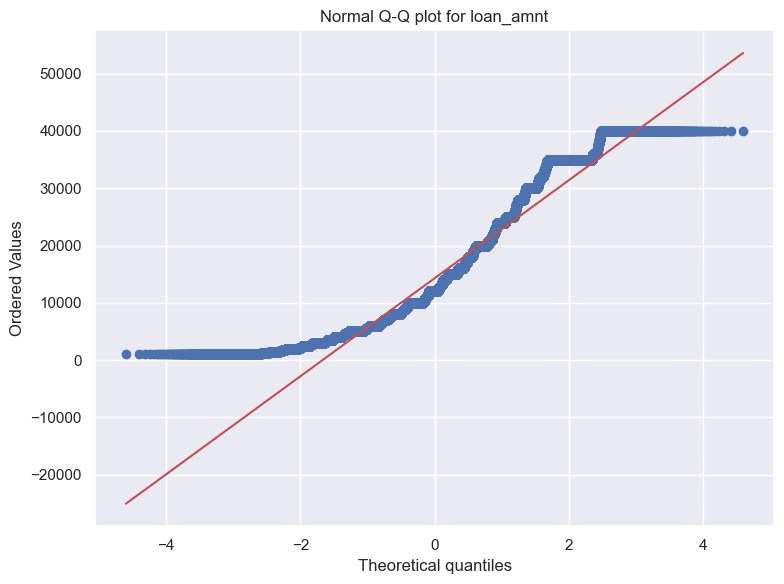

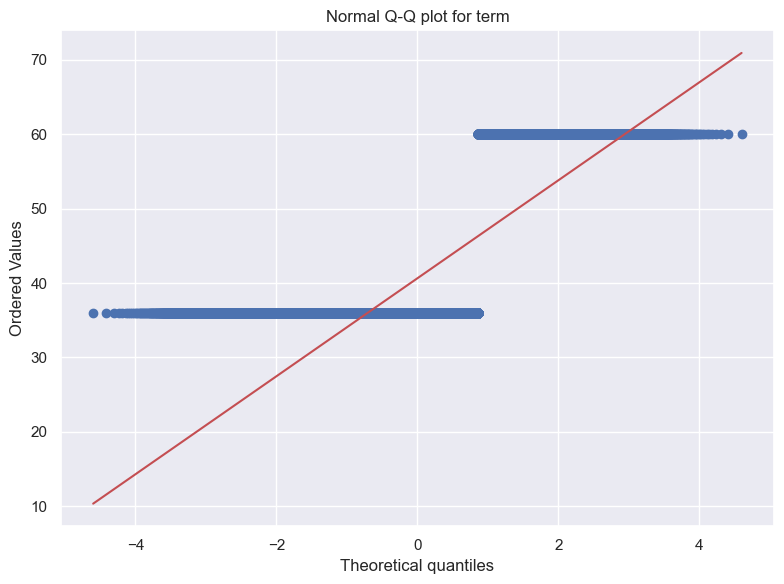

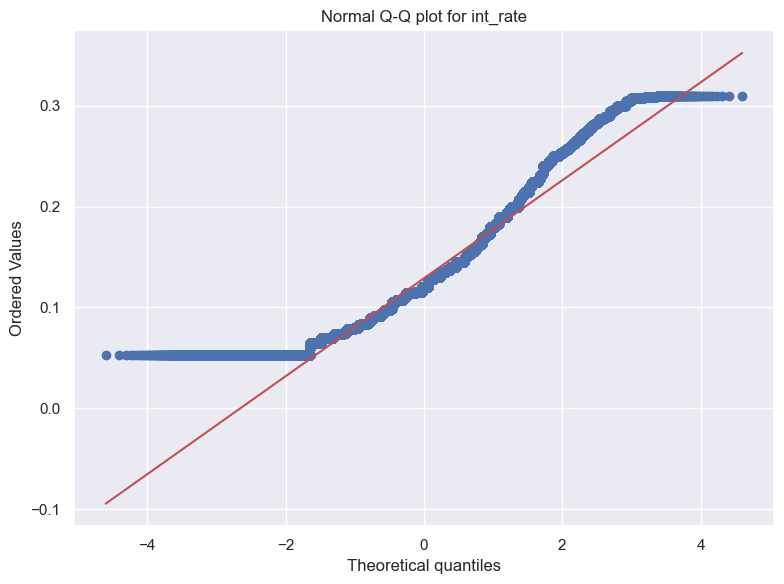

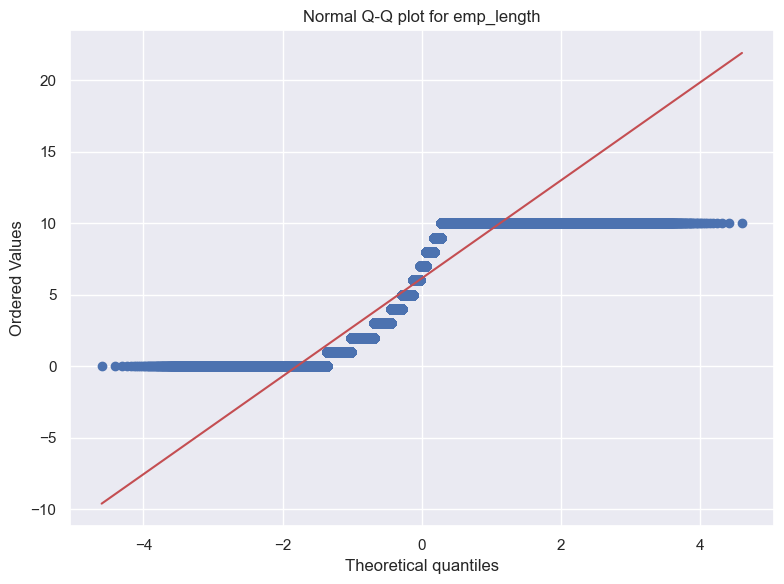

...

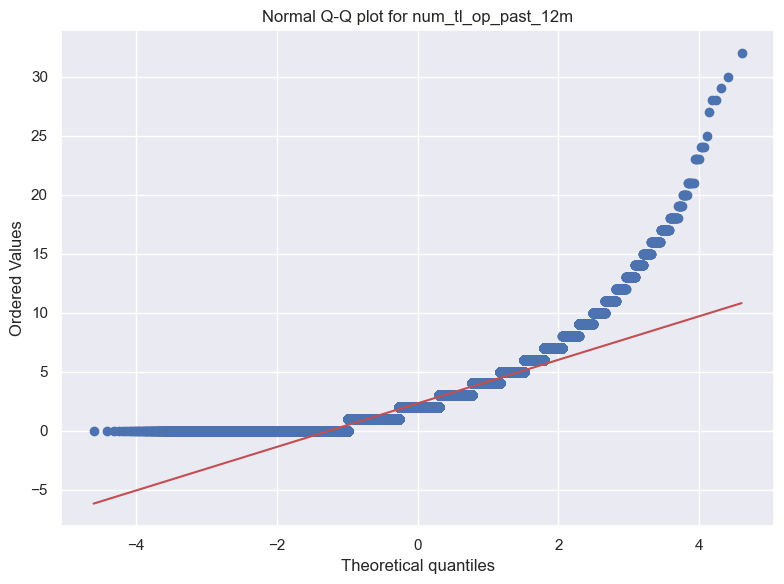

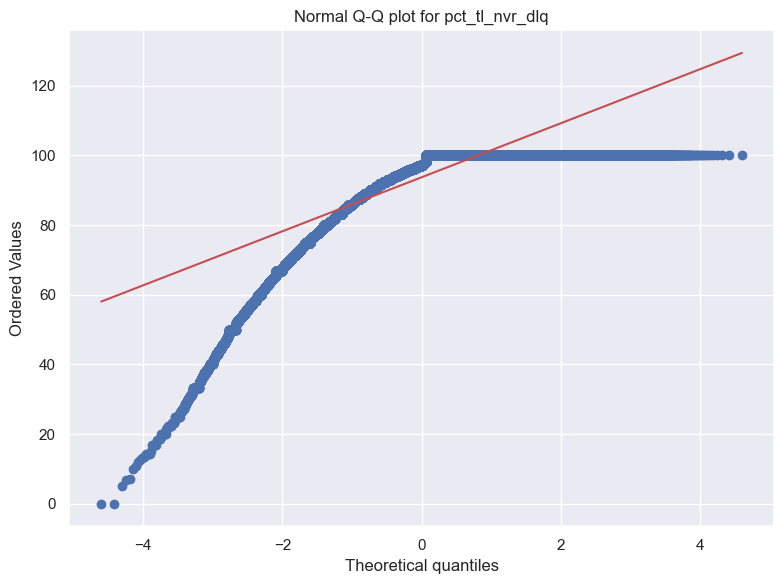

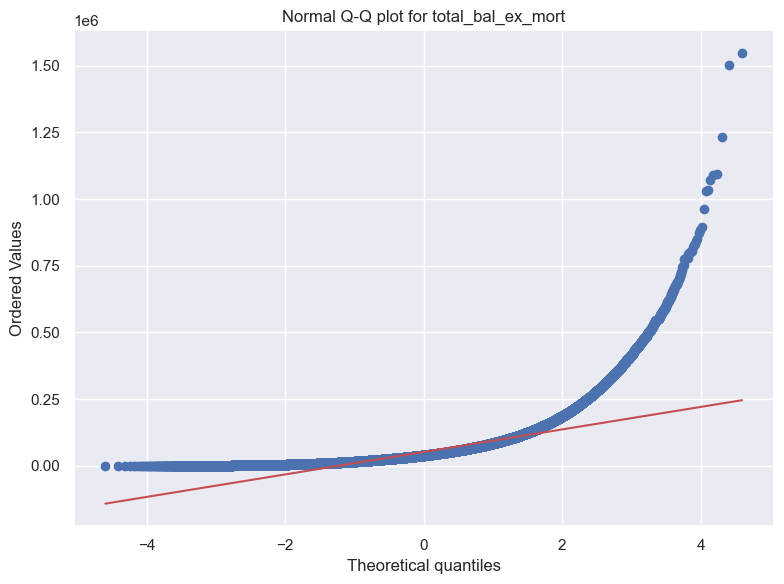

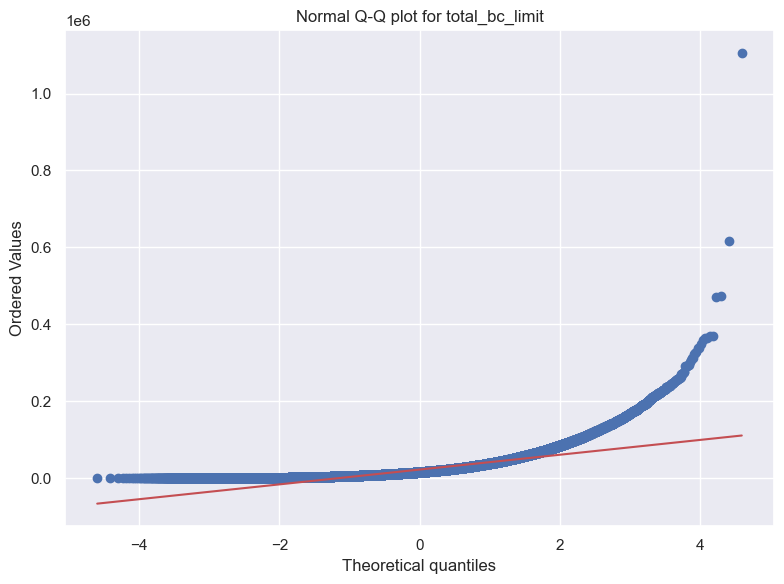

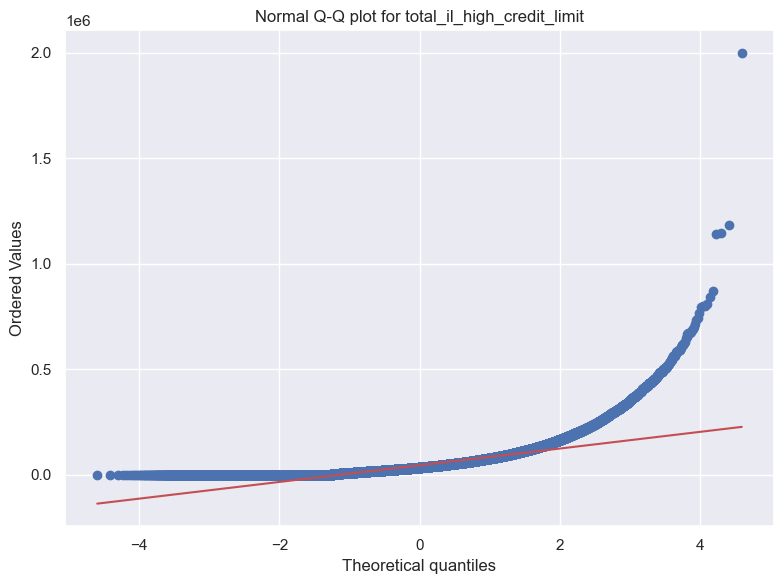

/Users/shellylevy/opt/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:2536: RuntimeWarning: invalid value encountered in subtract
  X -= avg[:, None]


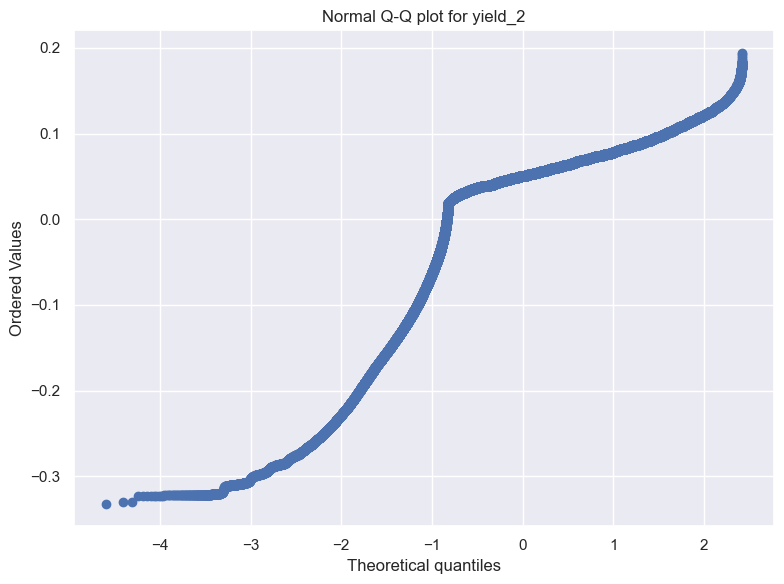

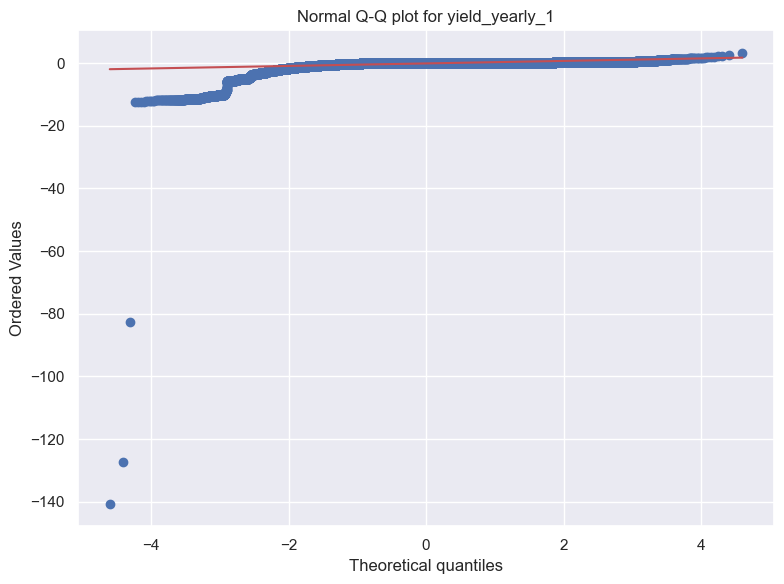

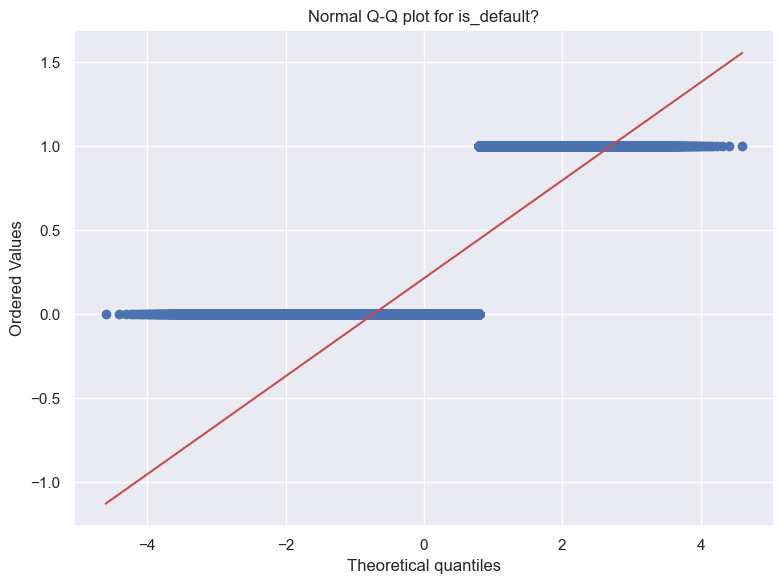

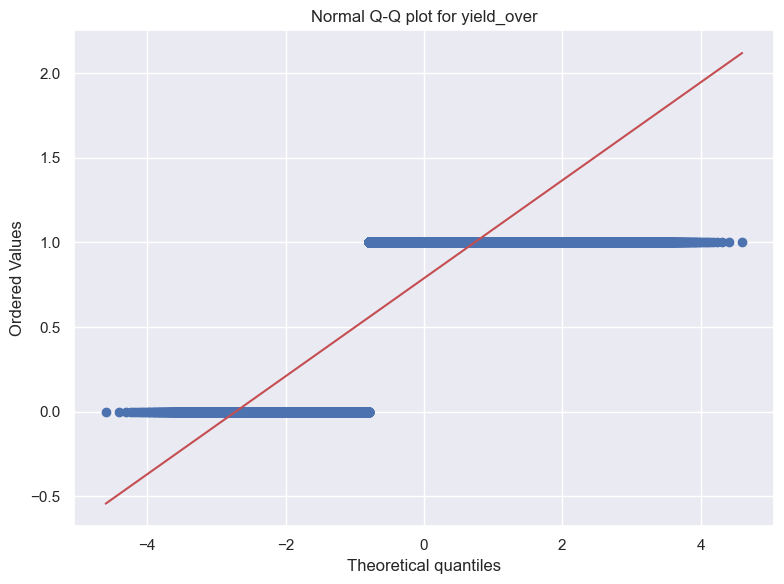

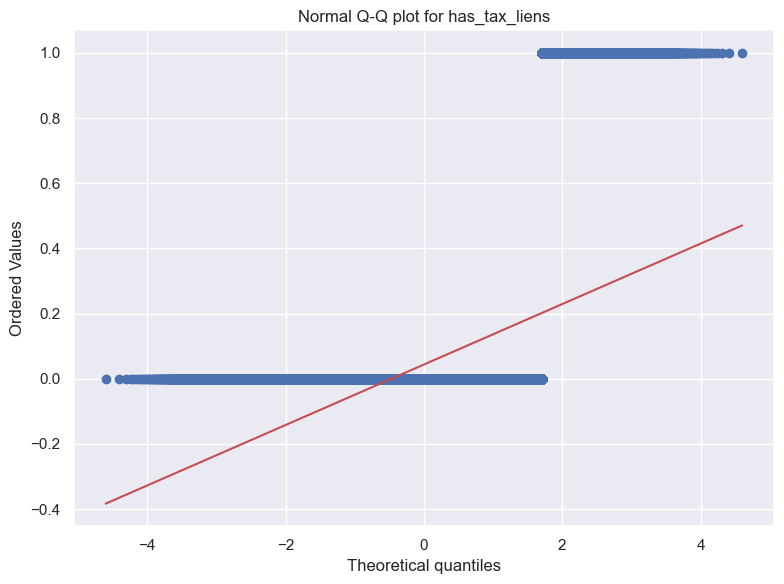

...

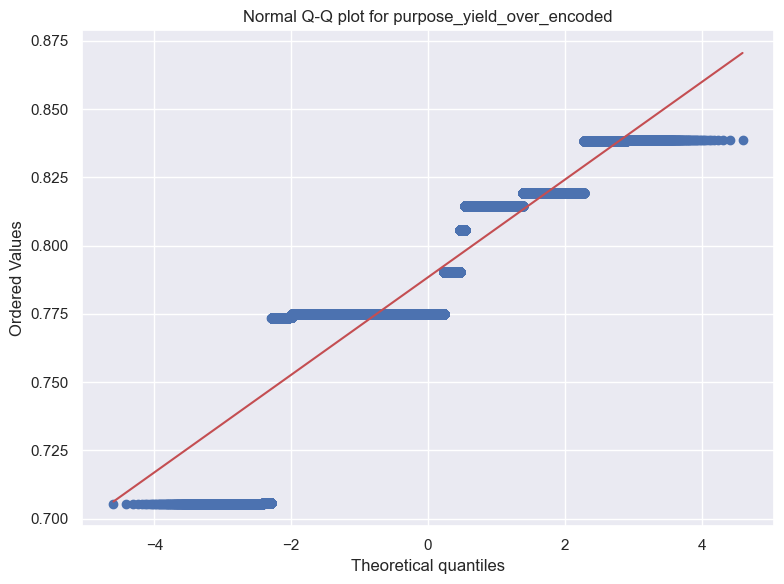

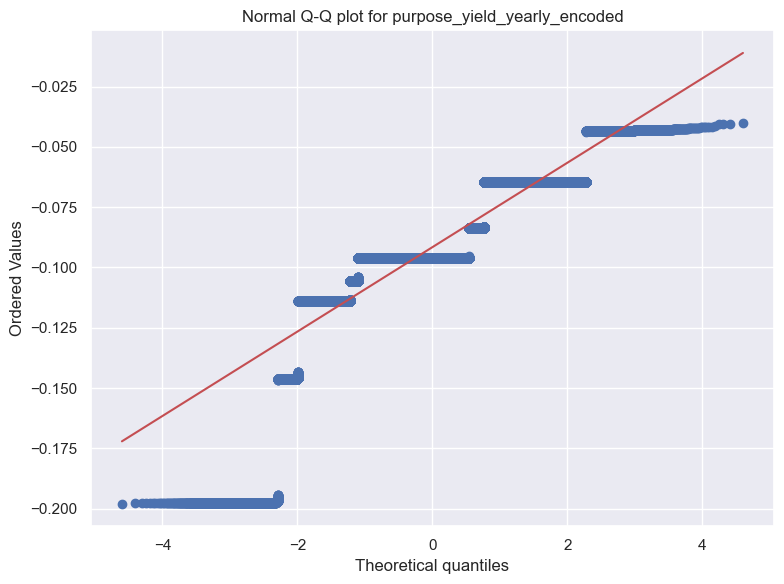

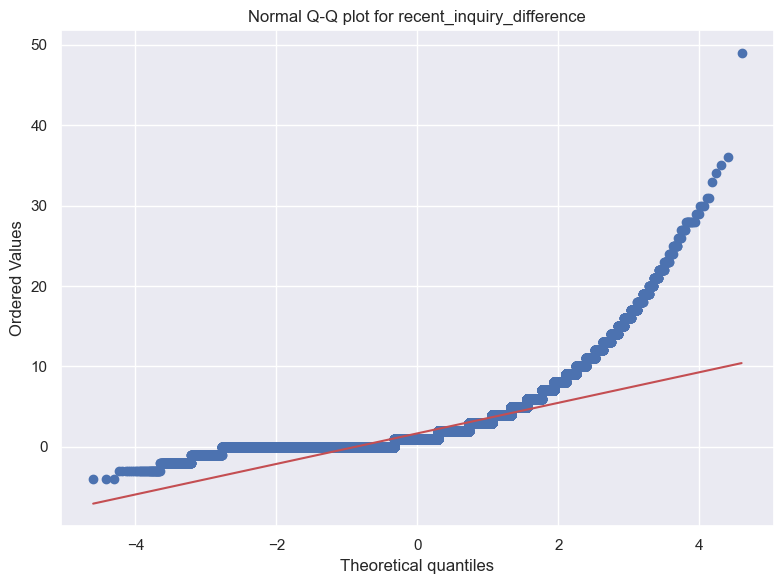

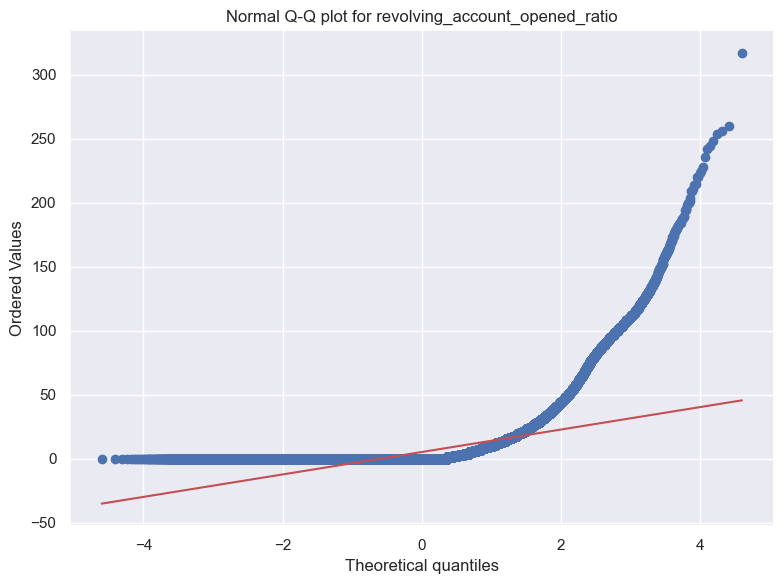

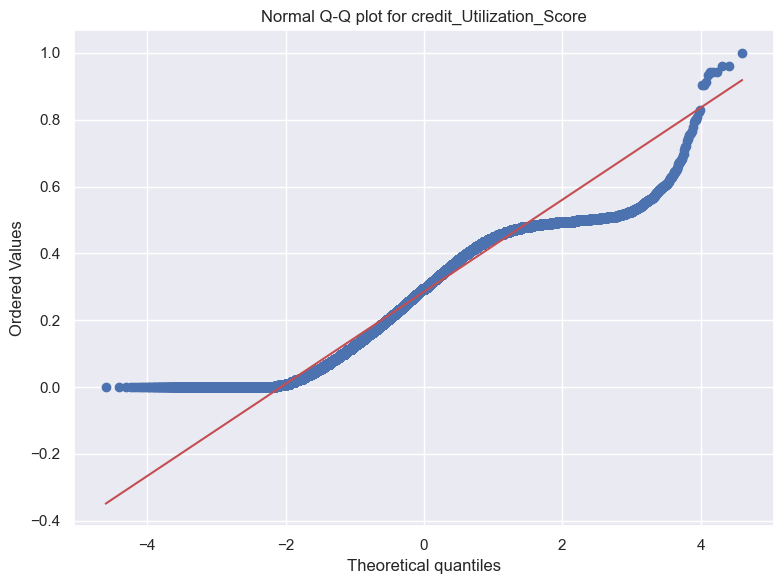

In [285]:
plot_qq_plots(data)

**total_il_high_credit_limit**

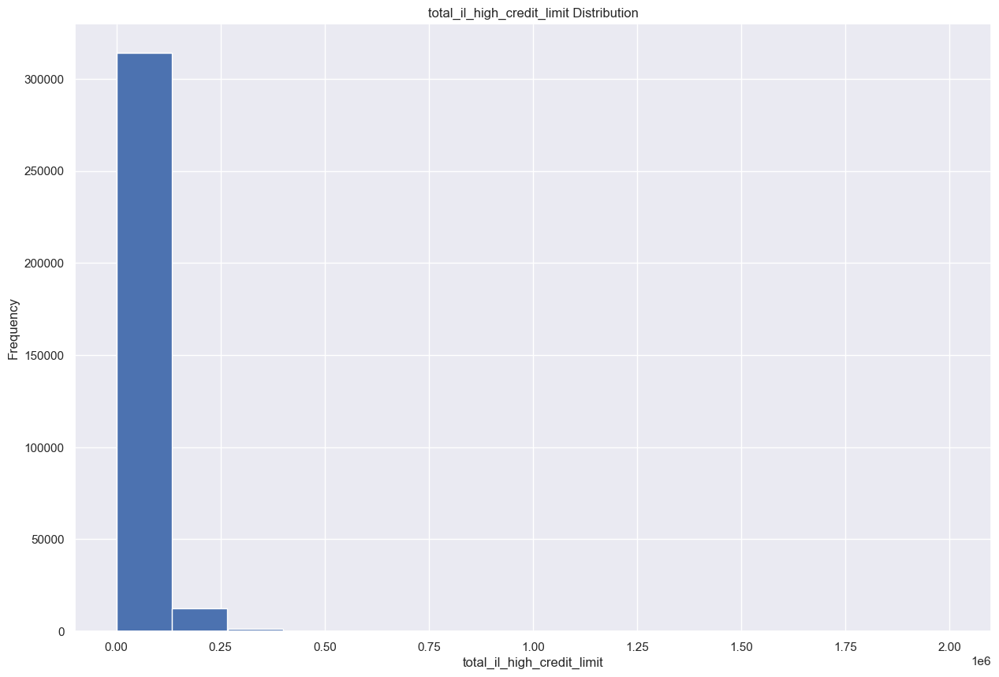

In [286]:
plt.hist(data['total_il_high_credit_limit'], bins=15)
plt.title('total_il_high_credit_limit Distribution')
plt.xlabel('total_il_high_credit_limit')
plt.ylabel('Frequency')
plt.show()

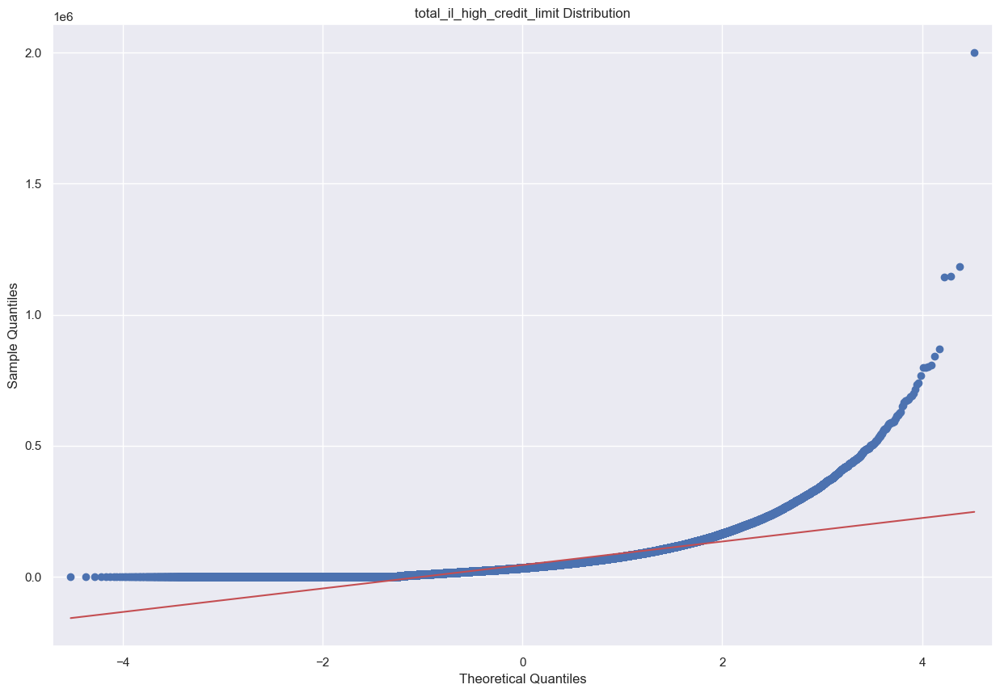

In [287]:
# Plot QQ plot of price
sm.qqplot(data['total_il_high_credit_limit'], line='s')
plt.title('total_il_high_credit_limit Distribution')
plt.show()

In [288]:
data = data[data['total_il_high_credit_limit'] <= 300000]

**dti**

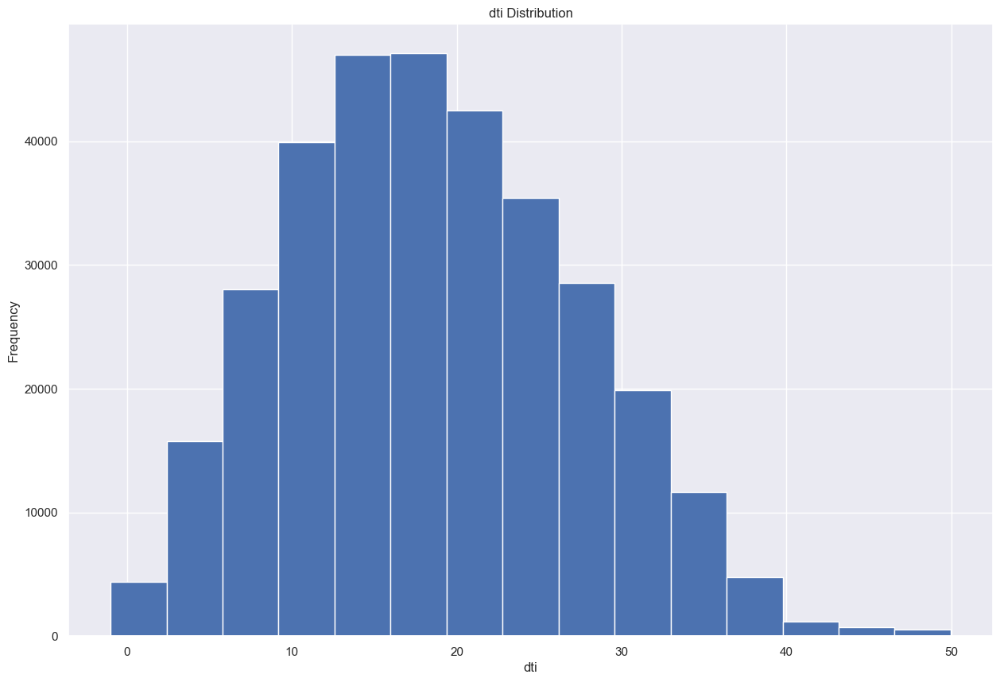

In [289]:
plt.hist(data['dti'], bins=15)
plt.title('dti Distribution')
plt.xlabel('dti')
plt.ylabel('Frequency')
plt.show()

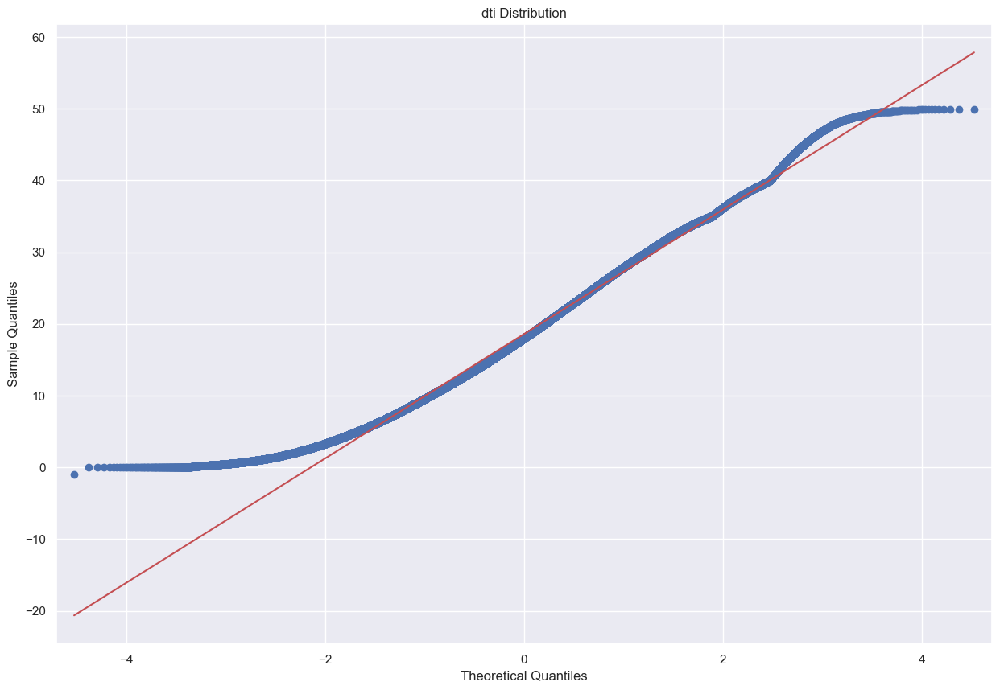

In [290]:
# Plot QQ plot of price
sm.qqplot(data['dti'], line='s')
plt.title('dti Distribution')
plt.show()

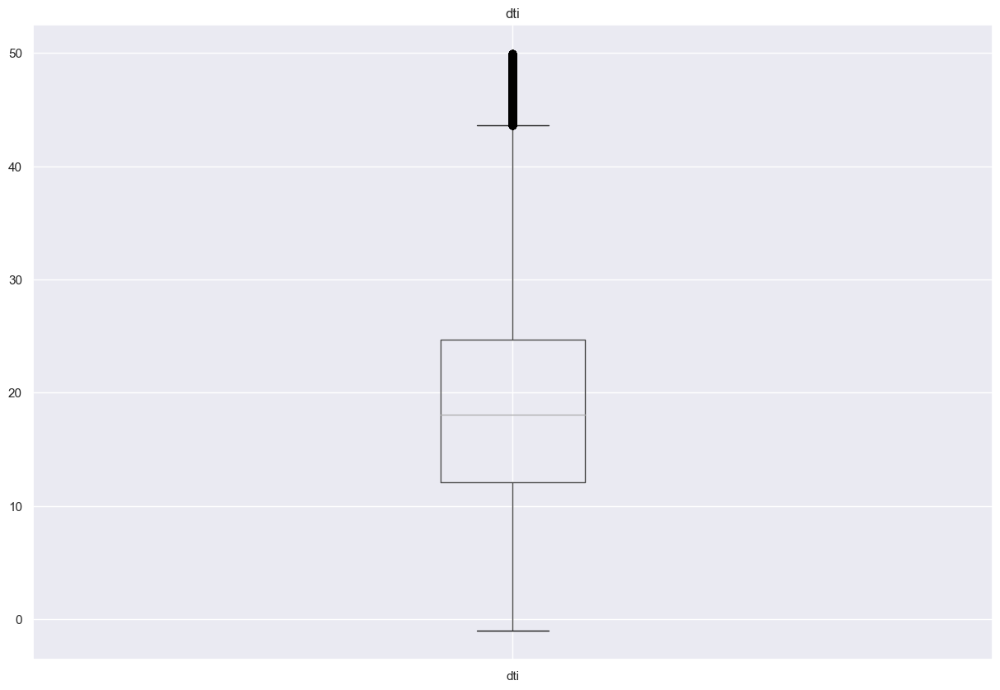

In [291]:
plt.figure()
data.boxplot(['dti'])
plt.title("dti")
plt.show()

In [292]:
m_dti = data["dti"].mean()
sd_dti = data["dti"].std()
x = m_dti + 3*sd_dti
data[data["dti"] > x]

,id,loan_amnt,term,int_rate,emp_length,annual_inc,issue_d,dti,delinq_2yrs,fico_range_low,...,addr_state_danger,Age_of_credit_history,Is_MORTGAGE,Is_RENT,purpose_yield_over_encoded,purpose_yield_yearly_encoded,inq_last_6mths_cat,recent_inquiry_difference,revolving_account_opened_ratio,credit_Utilization_Score
1,76142378,30000.0,36,0.1446,10.0,68500.0,2016-03-01,45.16,0,720.0,...,1,33.163587,1,0,0.774833,-0.096180,1,5.0,5,0.159841
82,75194106,24000.0,36,0.1727,10.0,55000.0,2016-03-01,47.46,0,715.0,...,0,26.329911,0,0,0.814347,-0.064672,1,2.0,0,0.434650
157,75981611,8000.0,36,0.1299,10.0,41460.0,2016-03-01,46.89,1,710.0,...,0,11.581109,0,1,0.774833,-0.096177,1,1.0,7,0.094823
178,76132699,3000.0,36,0.1999,10.0,52000.0,2016-03-01,47.10,0,660.0,...,1,14.581793,1,0,0.774833,-0.096173,1,0.0,22,0.479162
351,75222670,9400.0,36,0.2313,10.0,40065.0,2016-03-01,45.60,0,705.0,...,1,17.834360,1,0,0.790389,-0.113972,1,7.0,2,0.274681
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
208785,75050761,13200.0,60,0.2814,10.0,33000.0,2016-04-01,45.45,0,675.0,...,1,11.917864,0,1,0.774833,-0.096169,1,4.0,0,0.398566
208816,75190578,10000.0,36,0.1299,6.0,30000.0,2016-04-01,46.24,0,710.0,...,1,7.750856,0,1,0.774827,-0.096181,1,0.0,0,0.474001
208831,75153299,13175.0,60,0.2899,3.0,26353.0,2016-04-01,45.67,0,675.0,...,0,10.332649,0,1,0.774827,-0.096182,1,0.0,28,0.479993
208930,74592359,18000.0,60,0.2867,3.0,41600.0,2016-04-01,47.11,0,675.0,...,0,9.667351,1,0,0.814347,-0.064627,1,1.0,0,0.423590


**annual_inc**

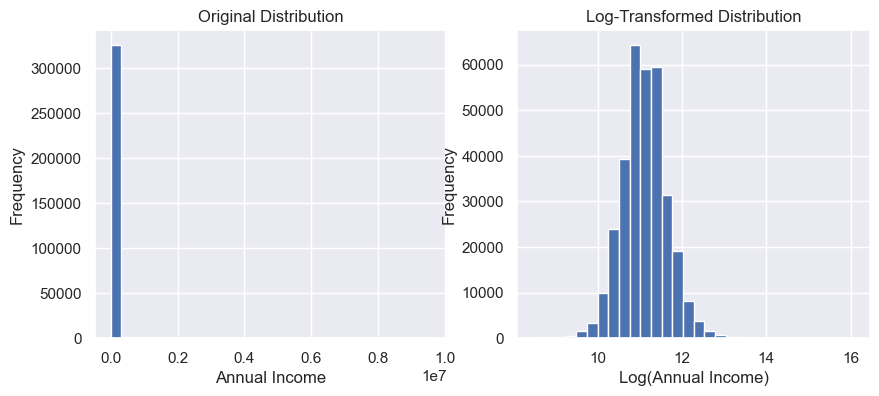

In [293]:
data['annl_inc_log'] = np.log(data['annual_inc'])


# Plot the non-transformed distribution
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].hist(data['annual_inc'], bins=30)
ax[0].set_xlabel('Annual Income')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Original Distribution')

# Apply the log transformation and plot the transformed distribution
ax[1].hist(data['annl_inc_log'], bins=30)
ax[1].set_xlabel('Log(Annual Income)')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Log-Transformed Distribution')

plt.show()

data.drop('annual_inc', axis=1, inplace=True)

**revol_bal**

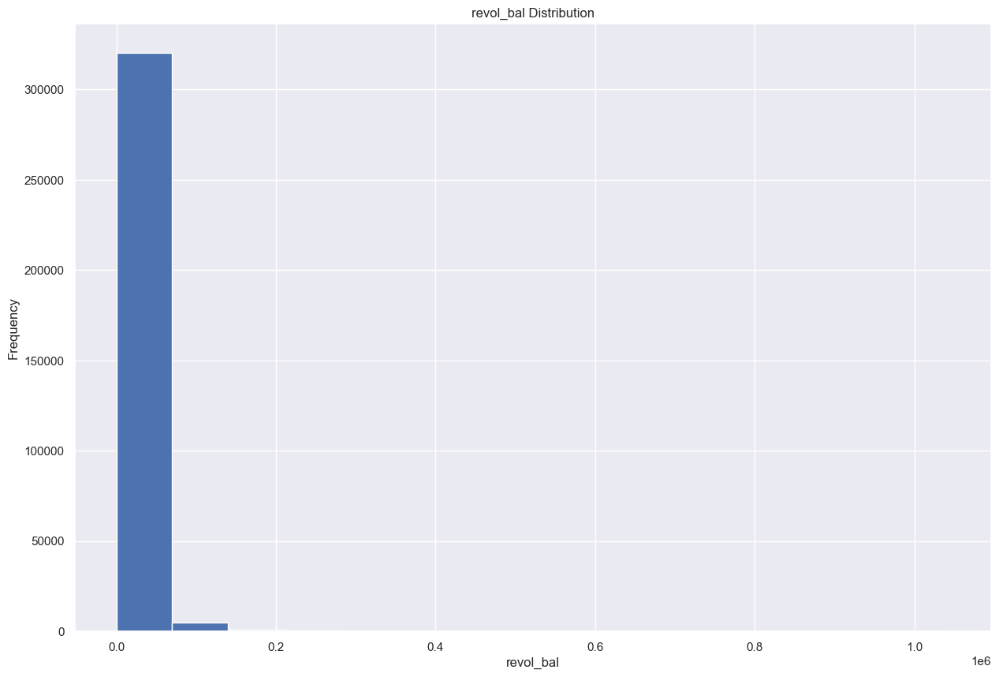

In [294]:
plt.hist(data['revol_bal'], bins=15)
plt.title('revol_bal Distribution')
plt.xlabel('revol_bal')
plt.ylabel('Frequency')
plt.show()

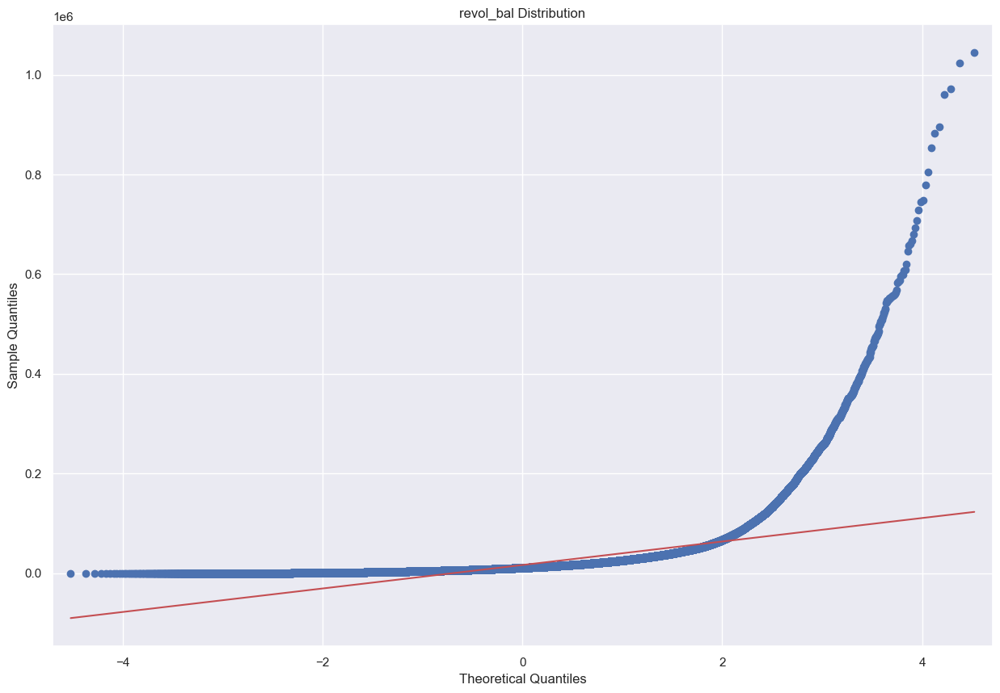

In [295]:
# Plot QQ plot of price
sm.qqplot(data['revol_bal'], line='s')
plt.title('revol_bal Distribution')
plt.show()

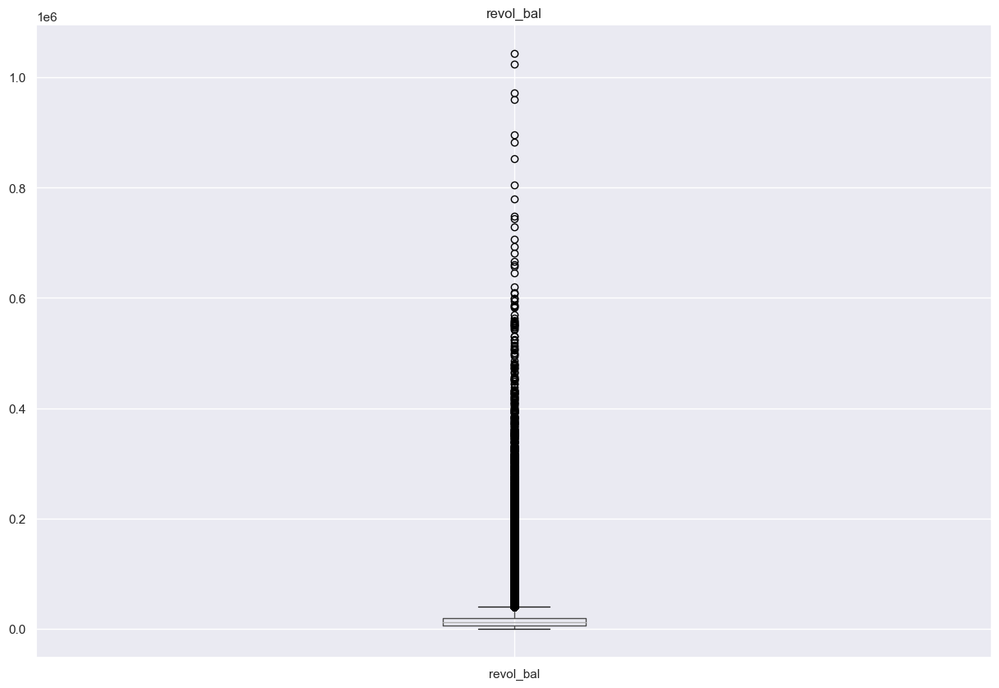

In [296]:
plt.figure()
data.boxplot(['revol_bal'])
plt.title("revol_bal")
plt.show()

In [297]:
data = data[data['revol_bal'] <= 200000]

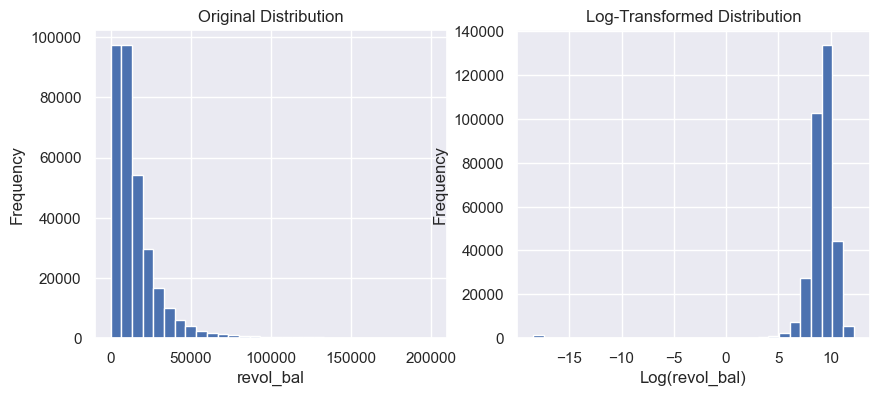

In [298]:
data['revol_bal_log'] = np.log(data['revol_bal'] + 1e-8)


# Plot the non-transformed distribution
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].hist(data['revol_bal'], bins=30)
ax[0].set_xlabel('revol_bal')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Original Distribution')

# Apply the log transformation and plot the transformed distribution
ax[1].hist(data['revol_bal_log'], bins=30)
ax[1].set_xlabel('Log(revol_bal)')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Log-Transformed Distribution')

plt.show()

data.drop('revol_bal', axis=1, inplace=True)

**Total rev limit**

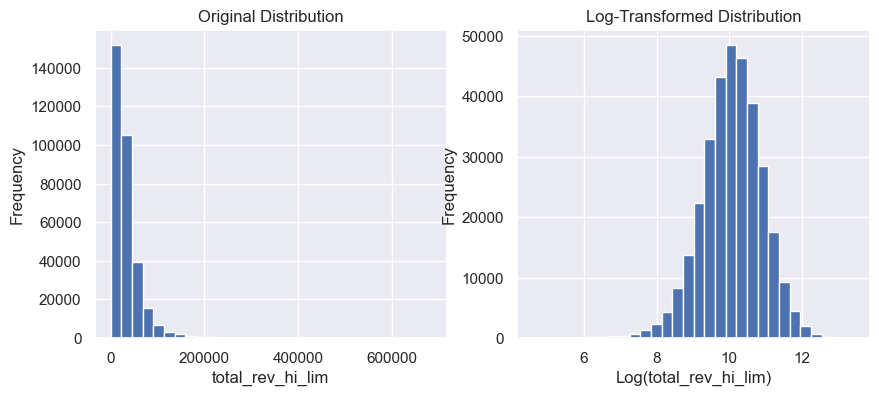

In [299]:
data['total_rev_hi_lim_log'] = np.log(data['total_rev_hi_lim'])


# Plot the non-transformed distribution
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].hist(data['total_rev_hi_lim'], bins=30)
ax[0].set_xlabel('total_rev_hi_lim')
ax[0].set_ylabel('Frequency')
ax[0].set_title('Original Distribution')

# Apply the log transformation and plot the transformed distribution
ax[1].hist(data['total_rev_hi_lim_log'], bins=30)
ax[1].set_xlabel('Log(total_rev_hi_lim)')
ax[1].set_ylabel('Frequency')
ax[1].set_title('Log-Transformed Distribution')

plt.show()

data.drop('total_rev_hi_lim', axis=1, inplace=True)

**Correlation between categorical features**

In [303]:
unique_counts = data.nunique().sort_values(ascending=False)

print("Column Name\tUnique Values")
for column, count in unique_counts.iteritems():
    print(f"{column}\t\t{count}")

Column Name	Unique Values
id		326403
purpose_yield_yearly_encoded		315810
yield_yearly_1		313595
yield_2		311344
tot_cur_bal		196269
total_bal_ex_mort		116534
total_il_high_credit_limit		105553
total_bal_il		96833
revol_bal_log		54521
credit_Utilization_Score		52783
avg_cur_bal		52207
bc_open_to_buy_mean		48697
bc_open_to_buy_med		48697
max_bal_bc		24628
annl_inc_log		22027
total_rev_hi_lim_log		9016
tot_coll_amt		7589
dti		4852
total_bc_limit		4784
Age_of_credit_history		2037
loan_amnt		1501
mo_sin_old_rev_tl_op		693
pct_tl_nvr_dlq		554
mo_sin_old_il_acct_mean		470
mo_sin_old_il_acct_med		470
mths_since_recent_bc_med		413
mths_since_recent_bc_mean		413
mths_since_rcnt_il_med		323
mths_since_rcnt_il_mean		323
il_util_med		220
il_util		209
revolving_account_opened_ratio		207
all_util		164
bc_util_mean		163
int_rate		141
total_acc		122
num_il_tl		97
num_rev_accts		93
percent_bc_gt_75_med		87
percent_bc_gt_75_mean		87
num_sats		69
open_acc		69
num_op_rev_tl		62
num_bc_tl		60
total_cu_tl		

In [314]:
'''
making a list of categorical features to test with chi-square test.
'''

cat_corr_df = data[['num_accts_ever_120_pd', 'num_actv_bc_tl', 'open_il_24m', 'mort_acc', 'pub_rec', 'num_tl_op_past_12m',
                    'inq_fi','mths_since_recent_inq_med', 'open_rv_12m', 'delinq_2yrs', 'open_acc_6m', 'open_il_12m',
                    'purpose_yield_over_encoded' , 'emp_length', 'inq_last_6mths_cat',]]

In [315]:
def categorical_correlation(cat_data):
    features = cat_data.columns
    correlation_matrix = np.zeros((len(features), len(features)))
    for i in range(len(features)):
        for j in range(len(features)):
            feature1 = cat_data[features[i]]
            feature2 = cat_data[features[j]]
            contingency_table = pd.crosstab(feature1, feature2)
            chi2, _, _, _ = chi2_contingency(contingency_table)
            n = contingency_table.sum().sum()
            correlation = np.sqrt(chi2 / n)
            correlation_matrix[i, j] = correlation
    correlation_df = pd.DataFrame(correlation_matrix, index=features, columns=features)
    return correlation_df

cat_data = cat_corr_df
correlation_df = categorical_correlation(cat_data)
print(correlation_df)

                            num_accts_ever_120_pd  num_actv_bc_tl  \
num_accts_ever_120_pd                    6.082763        0.071085   
num_actv_bc_tl                           0.071085        5.567764   
open_il_24m                              0.064758        0.064913   
mort_acc                                 0.128694        0.135146   
pub_rec                                  0.061222        0.070507   
num_tl_op_past_12m                       0.110774        0.282456   
inq_fi                                   0.104827        0.042754   
mths_since_recent_inq_med                0.083055        0.074455   
open_rv_12m                              0.100978        0.375396   
delinq_2yrs                              1.058328        0.177173   
open_acc_6m                              0.093286        0.165945   
open_il_12m                              0.066913        0.058498   
purpose_yield_over_encoded               0.075010        0.178851   
emp_length                        

In [316]:
column_names = cat_corr_df.columns

chisqmatrix = pd.DataFrame(index=column_names, columns=column_names)

# Setting counters to zero
outercnt = 0
innercnt = 0

for icol in column_names:  # Outer loop
    for jcol in column_names:  # Inner loop
        # Converting to cross tab as for CHi-square test we have
        # to first convert variables into a contingency table
        mycrosstab = pd.crosstab(cat_corr_df[icol], cat_corr_df[jcol])
        
        # Getting p-value and other useful information
        stat, p, dof, expected = stats.chi2_contingency(mycrosstab)
        
        # Rounding very small p-values to zero
        chisqmatrix.at[icol, jcol] = round(p, 5)
        
        # As mentioned above, expected frequencies should be at least 5 for the majority (80%) of the cells.
        cntexpected = expected[expected < 5].size
        
        # Getting percentage
        perexpected = ((expected.size - cntexpected) / expected.size) * 100
        
        if perexpected < 20:
            chisqmatrix.at[icol, jcol] = 2  # Assigning 2
            
        if icol == jcol:
            chisqmatrix.at[icol, jcol] = 0.00
        
        innercnt += 1
        outercnt += 1
        innercnt = 0

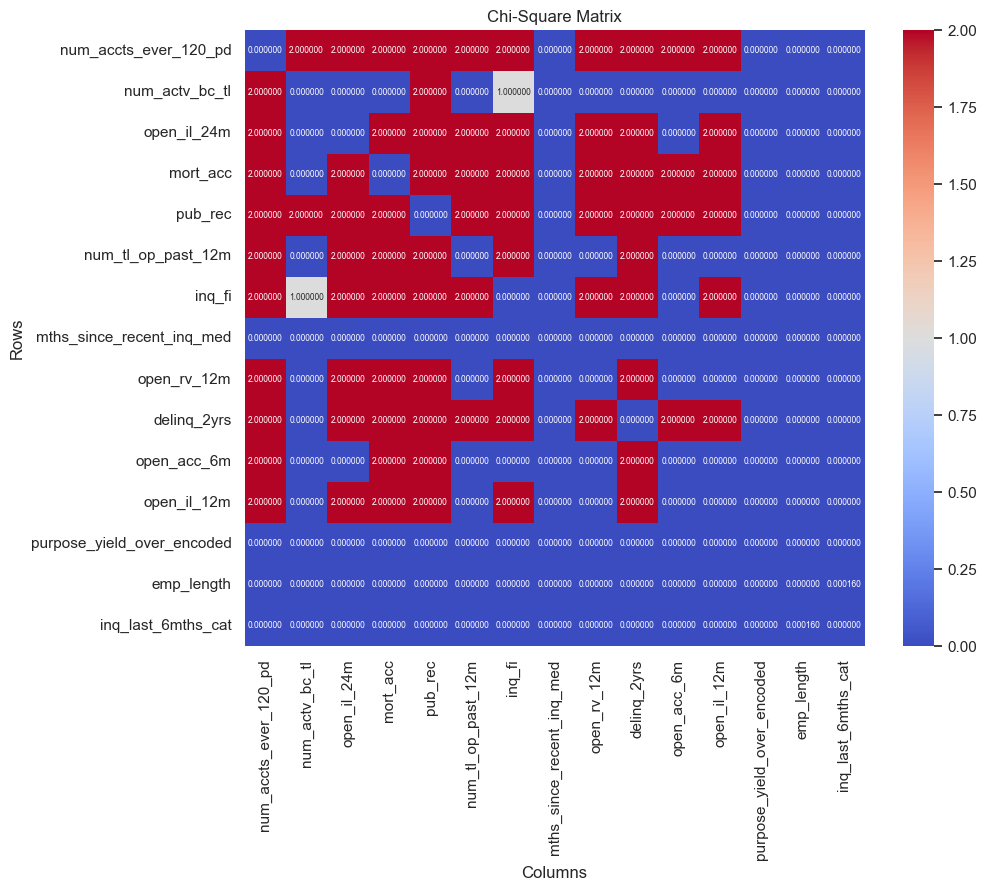

In [317]:
# Assuming you have already generated the `chisqmatrix` DataFrame

# Convert the data in chisqmatrix to numeric values
chisqmatrix = chisqmatrix.apply(pd.to_numeric)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Generate the heatmap using seaborn with smaller font size
sns.heatmap(chisqmatrix, annot=True, fmt=".6f", cmap="coolwarm", ax=ax,
            annot_kws={"fontsize": 6})

# Set the title and labels
ax.set_title("Chi-Square Matrix")
ax.set_xlabel("Columns")
ax.set_ylabel("Rows")

# Rotate the x-axis labels for better readability if needed
plt.xticks(rotation=90)

# Show the plot
plt.show()

### Normalization
Assumption: because we located and treated outliers, min max normalization can be used

In [312]:
def normalize_numeric_data(data):
    """
    Normalize the numeric columns in the given DataFrame using Min-Max scaling.

    Parameters:
    - data (pandas.DataFrame): Input DataFrame containing numeric columns to be normalized.

    Returns:
    - normalized_data (pandas.DataFrame): DataFrame with normalized numeric columns concatenated with non-numeric columns.

    """

    # Select only the numeric columns
    numeric_cols = data.select_dtypes(include=['int64', 'float64'])

    # Initialize the MinMaxScaler
    scaler = MinMaxScaler()

    # Normalize the numeric columns
    normalized_data = scaler.fit_transform(numeric_cols)

    # Create a new DataFrame with the normalized values
    normalized_df = pd.DataFrame(normalized_data, columns=numeric_cols.columns)

    # Concatenate the normalized DataFrame with the non-numeric columns
    normalized_data = pd.concat([normalized_df, data.select_dtypes(exclude=['int64', 'float64'])], axis=1)

    return normalized_data
# Splitting the data into training and testing sets
#X_train, X_test, y_train, y_test = train_test_split(data, y, test_size=0.2, random_state=42)
# Example usage
corr_df = data[['tot_cur_bal', 'total_bal_ex_mort',
    'total_il_high_credit_limit', 'total_bal_il', 'revol_bal_log', 'avg_cur_bal', 'bc_open_to_buy_med',
    'bc_open_to_buy_mean', 'max_bal_bc', 'annl_inc_log', 'total_rev_hi_lim_log',
    'tot_coll_amt', 'total_bc_limit', 'dti', 'Age_of_credit_history',
    'loan_amnt', 'mo_sin_old_rev_tl_op', 'pct_tl_nvr_dlq', 'mo_sin_old_il_acct_mean',
    'mo_sin_old_il_acct_med', 'mths_since_recent_bc_mean', 'mths_since_recent_bc_med',
    'mths_since_rcnt_il_med', 'mths_since_rcnt_il_mean', 'il_util_med', 'il_util', 'all_util',
    'bc_util_mean', 'int_rate', 'credit_Utilization_Score']]
normalized_data = normalize_numeric_data(corr_df)

# THANK YOU

In [310]:
data.shape

(326403, 82)